In [ ]:
import sklearn
from sklearn.pipeline import Pipeline
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.model_selection import cross_validate, StratifiedKFold, KFold
import numpy as np
from sklearn.datasets import load_iris
import pandas as pd
import os
import datetime as dt
import re 
import sys 
import importlib
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import (
	OneHotEncoder,
	OrdinalEncoder,
	RobustScaler,
)
from sklearn.preprocessing import (
	PowerTransformer, 
	QuantileTransformer
)
import matplotlib.pyplot as plt
# import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import PowerTransformer, StandardScaler, QuantileTransformer, Normalizer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GroupShuffleSplit
from sklearn.model_selection import cross_validate
sklearn.set_config(enable_metadata_routing=False)
from sklearn.model_selection import train_test_split
from sklearn.compose import make_column_selector as selector
from xgboost import XGBClassifier, XGBRegressor
import time 
import pandas as pd
import os
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import PowerTransformer, StandardScaler, OneHotEncoder, FunctionTransformer
from sklearn.compose import ColumnTransformer
from sklearn.metrics import make_scorer
from sklearn.model_selection import GroupKFold, cross_validate
from sklearn.base import BaseEstimator, RegressorMixin
from scipy.stats import pearsonr
import plotly.express as px
from sklearn.linear_model import Ridge
from sklearn.decomposition import PCA
from sklearn.ensemble import HistGradientBoostingRegressor
import numpy as np
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.model_selection import GroupKFold
from sklearn.metrics import r2_score, mean_absolute_error

import shap
shap.initjs()


############ LOAD in custom packages ################

project_root = os.path.join(os.getcwd(), "..") # Get path of the project 
sys.path.append(project_root) # Add project root to sys.path for script usage

# Import and reload (optional) custom scripts
from scripts import paths
from scripts import preprocessing as pre
from scripts import visualization as vis
from scripts import variables
from scripts import feature_selection as fs
from scripts import clustering as cl

importlib.reload(paths)
importlib.reload(pre)
importlib.reload(vis)
importlib.reload(variables)
importlib.reload(fs)
importlib.reload(cl)

# Filepaths
brighten_dir = paths.DATA
sub_dir = paths.SUB_DFS
results_dir = paths.RESULTS



################ DEFINE column variables from data ###################
from scripts.variables import id_columns
from scripts.variables import all_cols, all_daily_cols, weekly_cols, baseline_cols, drop_weekly_cols
from scripts.variables import daily_cols_v1, daily_v2_sensor_hr, daily_v2_weather, daily_cols_v2 
from scripts.variables import gad_cols, phq9_base, alc_cols, phq9_cols, phq2_cols, sleep_cols, gic_cols, sds_cols


# Define label variables
df_names = ['v1_day', 'v2_day', 'v1_week', 'v2_week']
aggregate_dfs = ['alldays_df','week_df']
# Update endings list if order changes


########################################## MODELS #######################################


# Models
from sklearn.ensemble import RandomForestRegressor, HistGradientBoostingRegressor
from xgboost import XGBRegressor
# Dummy baseline model
class GroupMeanRegressor(BaseEstimator, RegressorMixin):
	def fit(self, X, y, groups):
		self.group_means_ = y.groupby(groups.squeeze()).mean().squeeze()
		self.global_mean_ = y.mean().squeeze()
		return self
	
	def predict(self, X, groups):
		return groups.squeeze().map(self.group_means_).fillna(self.global_mean_).values

# Pearson scorer
def pearsonr_scorer(y_true, y_pred):
	return pearsonr(y_true, y_pred)[0]

models = {
	'Random Forest': RandomForestRegressor(random_state=42),
	'XGBoost': XGBRegressor(objective='reg:squarederror', random_state=42),
	'Hist Gradient Boost': HistGradientBoostingRegressor(),
	'Group Mean': GroupMeanRegressor(),
	'Ridge': Ridge(alpha=1.0)
}
from sklearn.metrics import make_scorer
from scipy.stats import pearsonr

def pearsonr_scorer(y_true, y_pred):
	return pearsonr(y_true, y_pred)[0]

scoring_metrics = {
	'r2': 'r2',
	'neg_mae': 'neg_mean_absolute_error',
	'neg_rmse': 'neg_root_mean_squared_error',
}





In [5]:
# Just so i can view them :3
a_v1day_pca_df = pd.read_csv(os.path.join(brighten_dir, 'v1_day_trainval_pca.csv'))
a_v1week_pca_df = pd.read_csv(os.path.join(brighten_dir, 'v1_week_trainval_pca.csv'))
a_v2day_pca_df = pd.read_csv(os.path.join(brighten_dir, 'v2_day_trainval_pca.csv'))
a_v2week_pca_df = pd.read_csv(os.path.join(brighten_dir, 'v2_week_trainval_pca.csv'))


## Anova for feature analysis for all subjects

Run on: Mon 13 Apr 2026, 08:28AM
################ v1_day ###############


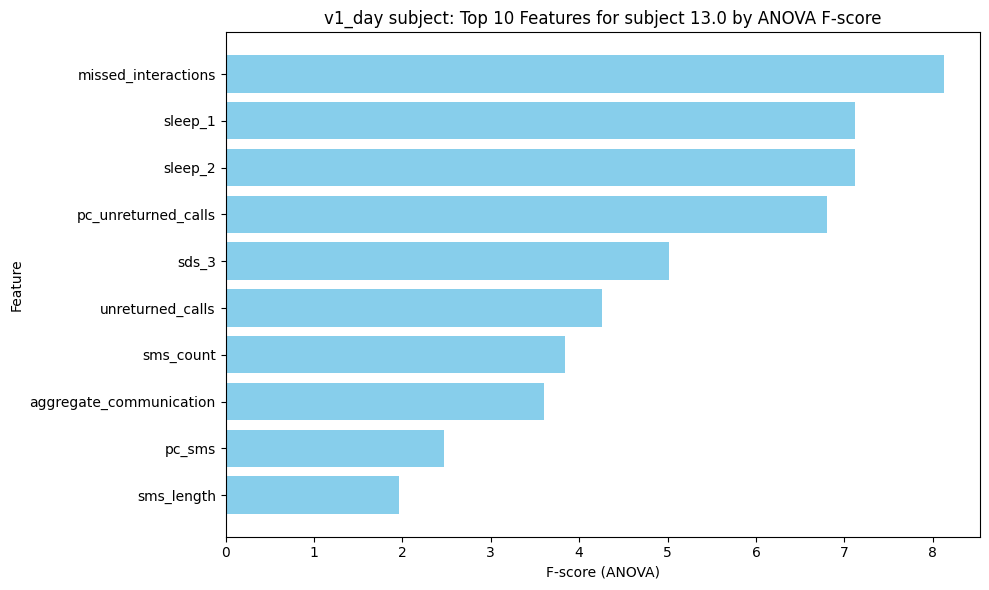

,mobility,mobility_radius,unreturned_calls,sms_count,aggregate_communication,call_duration,call_count,missed_interactions,sms_length,interaction_diversity,...,participant_id,phq2_bin,phq9_category,income_lastyear,mood_1,pc_mobility,pc_calls,pc_unreturned_calls,pc_sms,pc_phq2
31,2.306195,0.26825,-0.243433,-0.507714,-0.568199,-0.246027,-0.644551,-0.417007,-0.418630,-0.939191,...,BLUE-00062,1.0,high,6.0,0.74044,2.156541,-0.631383,-0.453963,-0.656631,2.538556
32,2.306195,0.26825,-0.243433,-0.507714,-0.568199,-0.246027,-0.644551,-0.417007,-0.418630,-0.939191,...,BLUE-00062,1.0,high,6.0,0.74044,2.156541,-0.631383,-0.453963,-0.656631,2.538556
33,2.306195,0.26825,-0.527078,-0.475153,-0.528979,-0.184631,-0.578802,-0.548976,-0.502945,-1.033784,...,BLUE-00062,1.0,high,6.0,0.74044,2.156541,-0.541471,-0.742176,-0.693152,3.134169
34,2.306195,0.26825,-0.527078,-0.475153,-0.528979,-0.184631,-0.578802,-0.548976,-0.502945,-1.033784,...,BLUE-00062,1.0,high,6.0,0.74044,2.156541,-0.541471,-0.742176,-0.693152,3.134169
35,2.306195,0.26825,-0.243433,-0.584506,-0.650104,-0.469839,-0.708735,-0.548976,-0.550846,-1.033784,...,BLUE-00062,1.0,high,6.0,0.74044,2.156541,-0.834784,-0.551784,-0.804388,2.538556
36,2.306195,0.26825,-0.243433,-0.584506,-0.650104,-0.469839,-0.708735,-0.548976,-0.550846,-1.033784,...,BLUE-00062,1.0,high,6.0,0.74044,2.156541,-0.834784,-0.551784,-0.804388,2.538556
37,2.306195,0.26825,-0.243433,-0.600128,-0.665245,-0.469839,-0.708735,-0.548976,-0.587252,-1.251873,...,BLUE-00062,1.0,high,6.0,0.74044,2.156541,-0.834784,-0.551784,-0.841163,0.183459
38,2.306195,0.26825,-0.243433,-0.600128,-0.665245,-0.469839,-0.708735,-0.548976,-0.587252,-1.251873,...,BLUE-00062,1.0,high,6.0,0.74044,2.156541,-0.834784,-0.551784,-0.841163,0.183459
39,2.306195,0.26825,0.119001,-0.584506,-0.634964,-0.460460,-0.578802,-0.110840,-0.554679,-0.815694,...,BLUE-00062,NaN,high,6.0,0.74044,2.156541,-0.736093,0.016260,-0.807095,0.309651
40,2.306195,0.26825,0.119001,-0.584506,-0.634964,-0.460460,-0.578802,-0.110840,-0.554679,-0.815694,...,BLUE-00062,NaN,high,6.0,0.74044,2.156541,-0.736093,0.016260,-0.807095,0.309651


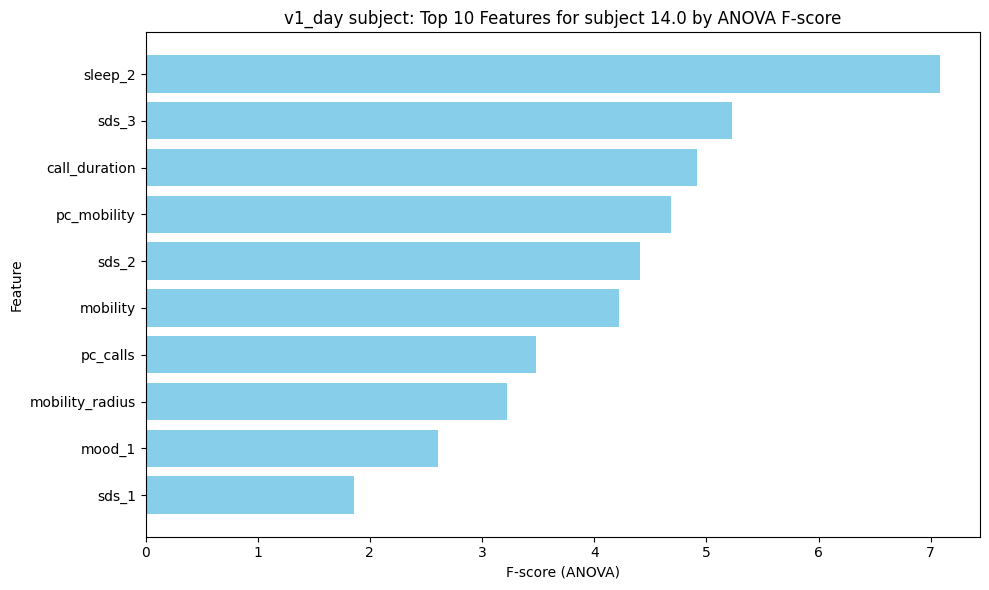

,mobility,mobility_radius,unreturned_calls,sms_count,aggregate_communication,call_duration,call_count,missed_interactions,sms_length,interaction_diversity,...,participant_id,phq2_bin,phq9_category,income_lastyear,mood_1,pc_mobility,pc_calls,pc_unreturned_calls,pc_sms,pc_phq2
116,0.448694,0.06147,-0.427681,0.968763,0.889187,-0.261991,-0.417932,-0.402931,0.925018,-0.234122,...,BLUE-00063,1.0,med-high,6.0,0.465707,0.484595,-0.482060,-0.567203,1.337583,1.952062
117,0.448694,0.06147,0.119001,0.509031,0.440017,-0.445869,-0.448868,-0.110840,0.761346,-0.379515,...,BLUE-00063,1.0,med-high,6.0,0.465707,0.484595,-0.633725,0.016260,0.896579,0.769954
118,0.448694,0.06147,-0.527078,-0.178336,-0.211027,-0.347210,-0.318935,-0.110840,-0.079492,0.492843,...,BLUE-00063,1.0,med-high,6.0,0.465707,0.484595,-0.472038,-0.417411,-0.183925,-0.412154
119,0.448694,0.06147,-0.527078,4.711338,4.527971,0.412883,-0.318935,-0.548976,7.071622,0.492843,...,BLUE-00063,0.0,med-high,6.0,0.465707,0.484595,0.064275,-0.742176,8.328738,-1.594261
120,0.448694,0.06147,-0.527078,4.070837,3.892067,-0.454901,-0.448868,-0.548976,5.019505,-0.597605,...,BLUE-00063,0.0,med-high,6.0,0.465707,0.484595,-0.640098,-0.742176,6.425679,-1.594261
121,0.448694,0.06147,0.119001,0.821470,0.788250,-0.270089,-0.059069,-0.110840,0.799348,0.274753,...,BLUE-00063,1.0,med-high,6.0,0.465707,0.484595,-0.233476,0.016260,1.144555,-0.412154
122,0.448694,0.06147,-0.527078,0.727738,0.667126,-0.449691,-0.318935,-0.548976,0.759430,0.274753,...,BLUE-00063,1.0,med-high,6.0,0.465707,0.484595,-0.544348,-0.742176,1.050015,-0.412154
123,0.448694,0.06147,0.119001,7.663888,7.344118,-0.469839,-0.708735,-0.110840,6.390457,0.056664,...,BLUE-00063,0.0,med-high,6.0,0.190975,0.484595,-0.834784,0.016260,9.937187,-1.594261
124,0.448694,0.06147,-0.527078,5.226862,4.997329,-0.316292,-0.578802,-0.548976,4.324289,-0.379515,...,BLUE-00063,0.0,med-high,6.0,0.190975,0.484595,-0.634370,-0.742176,6.752711,-1.594261
125,0.448694,0.06147,-0.427681,4.851935,4.618815,-0.469839,-0.708735,-0.548976,4.329718,0.274753,...,BLUE-00063,1.0,med-high,6.0,0.190975,0.484595,-0.834784,-0.675458,6.491192,-0.412154


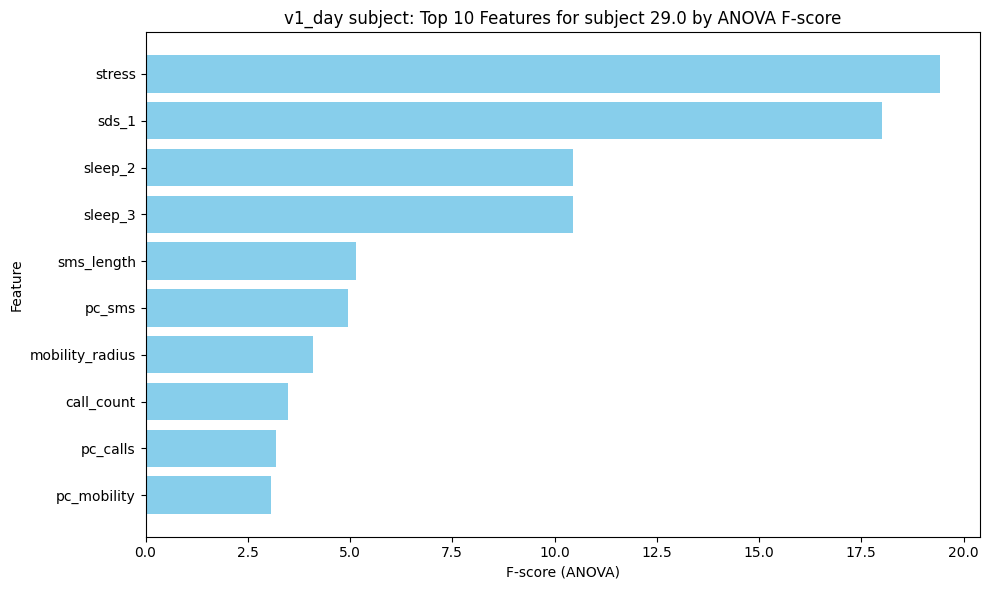

,mobility,mobility_radius,unreturned_calls,sms_count,aggregate_communication,call_duration,call_count,missed_interactions,sms_length,interaction_diversity,...,participant_id,phq2_bin,phq9_category,income_lastyear,mood_1,pc_mobility,pc_calls,pc_unreturned_calls,pc_sms,pc_phq2
201,-0.693058,-0.569776,0.119001,-0.475153,-0.513839,-0.445174,-0.448868,-0.110840,-0.431092,-0.379515,...,BLUE-00079,NaN,high,6.0,-0.633221,-0.816923,-0.633234,0.016260,-0.642390,1.865061
202,-0.693058,-0.569776,0.119001,-0.475153,-0.513839,-0.445174,-0.448868,-0.110840,-0.431092,-0.379515,...,BLUE-00079,NaN,high,6.0,-0.633221,-0.816923,-0.633234,0.016260,-0.642390,1.865061
203,-0.693058,-0.569776,3.349397,-0.522019,-0.392714,-0.231181,0.980396,2.079836,-0.530408,0.710933,...,BLUE-00079,1.0,high,6.0,-0.633221,-0.816923,0.530563,3.808441,-0.745723,3.134169
204,-0.693058,-0.569776,3.349397,-0.522019,-0.392714,-0.231181,0.980396,2.079836,-0.530408,0.710933,...,BLUE-00079,1.0,high,6.0,-0.633221,-0.816923,0.530563,3.808441,-0.745723,3.134169
205,-0.693058,-0.569776,0.119001,-0.522019,-0.559261,-0.328798,-0.448868,2.517972,-0.401712,0.056664,...,BLUE-00079,1.0,high,6.0,-0.633221,-0.816923,-0.551121,1.964854,-0.654804,2.547675
206,-0.693058,-0.569776,0.119001,-0.522019,-0.559261,-0.328798,-0.448868,2.517972,-0.401712,0.056664,...,BLUE-00079,1.0,high,6.0,-0.633221,-0.816923,-0.551121,1.964854,-0.654804,2.547675
207,-0.693058,-0.569776,2.057239,-0.568885,-0.498698,-0.313513,0.460663,1.203566,-0.510290,-0.161426,...,BLUE-00079,1.0,high,6.0,-0.633221,-0.816923,0.104178,2.291569,-0.764679,0.769954
208,-0.693058,-0.569776,2.057239,-0.568885,-0.498698,-0.313513,0.460663,1.203566,-0.510290,-0.161426,...,BLUE-00079,1.0,high,6.0,-0.633221,-0.816923,0.104178,2.291569,-0.764679,0.769954
209,-0.693058,-0.569776,3.995476,-0.475153,-0.513839,-0.376043,-0.448868,2.517972,-0.337843,-0.379515,...,BLUE-00079,1.0,high,6.0,-0.633221,-0.816923,-0.584456,4.566877,-0.576513,1.952062
210,-0.693058,-0.569776,3.995476,-0.475153,-0.513839,-0.376043,-0.448868,2.517972,-0.337843,-0.379515,...,BLUE-00079,1.0,high,6.0,-0.633221,-0.816923,-0.584456,4.566877,-0.576513,1.952062


/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: divide by zero encountered in divide
  f = msb / msw


################ v2_day ###############


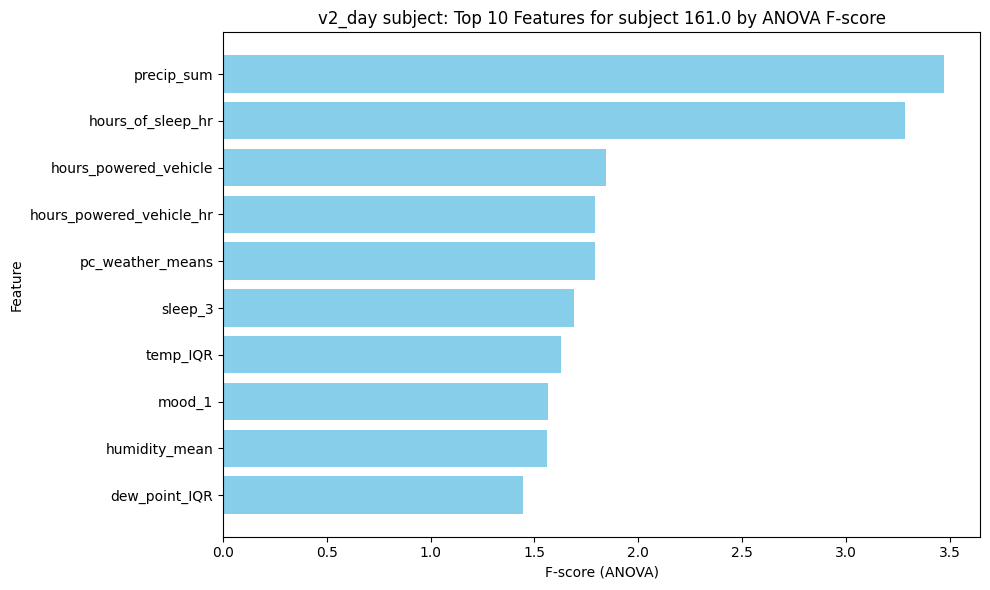

,hours_walking,distance_high_speed_transportation_hr,distance_active,distance_powered_vehicle_hr,distance_active_hr,hours_accounted_for,location_variance_hr,distance_walking,hours_high_speed_transportation_hr,hours_high_speed_transportation,...,phq2_sum,pc_commute,pc_active_mobility,pc_cloud_cover_std,pc_weather_means,pc_temp_humidity_std,pc_dew_point,pc_dew_point_std,pc_temp,pc_phq2
0,0.354998,0.330044,0.234812,0.237594,0.283147,-0.565722,0.182047,0.399520,0.585301,0.357622,...,-0.918681,0.456205,0.783720,0.138818,-0.318551,1.781262,-0.333336,1.743657,1.220219,-1.175420
1,0.354998,0.330044,0.234812,0.237594,0.283147,-0.565722,0.182047,0.399520,0.585301,0.357622,...,-0.918681,0.456205,0.783720,0.138818,-0.318551,1.781262,-0.333336,1.743657,1.220219,-1.175420
2,0.354998,0.330044,0.234812,0.237594,0.283147,-0.565722,0.182047,0.399520,0.585301,0.357622,...,-0.918681,0.456205,0.783720,0.138818,-0.318551,1.781262,-0.333336,1.743657,1.220219,-1.175420
3,0.354998,0.330044,0.234812,0.237594,0.283147,-0.565722,0.182047,0.399520,0.585301,0.357622,...,-0.918681,0.456205,0.783720,0.138818,-0.318551,1.781262,-0.333336,1.743657,1.220219,-1.175420
4,0.354998,0.330044,0.234812,0.237594,0.283147,-0.565722,0.182047,0.399520,0.585301,0.357622,...,-0.918681,0.456205,0.783720,0.138818,-0.318551,1.781262,-0.333336,1.743657,1.220219,-1.175420
5,0.354998,0.330044,0.234812,0.237594,0.283147,-0.565722,0.182047,0.399520,0.585301,0.357622,...,-0.918681,0.456205,0.783720,0.138818,-0.318551,1.781262,-0.333336,1.743657,1.220219,-1.175420
6,0.804208,0.330044,-0.503367,0.237594,0.283147,-0.565722,0.182047,0.769125,0.585301,-0.193354,...,-0.918681,0.085464,-0.423223,-0.340271,-1.290710,2.267533,-0.261753,2.045740,2.627657,-1.175420
7,0.494229,-0.218340,-0.068230,1.380313,-0.551485,-1.166539,0.289037,0.644755,-0.193123,-0.193354,...,-0.421061,-0.273218,1.707409,0.538018,-0.795199,2.539571,-0.957846,2.359082,1.914649,-0.550249
8,1.187970,4.580015,0.939833,1.963017,0.800808,-0.247610,2.271359,0.984713,7.515741,6.239921,...,0.469418,6.850722,4.355004,0.344263,0.077919,2.432220,-1.121349,2.461274,1.027867,0.644758
9,0.736042,-0.218340,-0.135402,-0.608071,-0.893918,-0.511139,-1.069954,0.712747,-0.193123,-0.193354,...,-1.311539,-0.273218,-0.798890,0.098806,-0.684072,2.544637,-1.140492,2.427559,2.017841,-1.693495


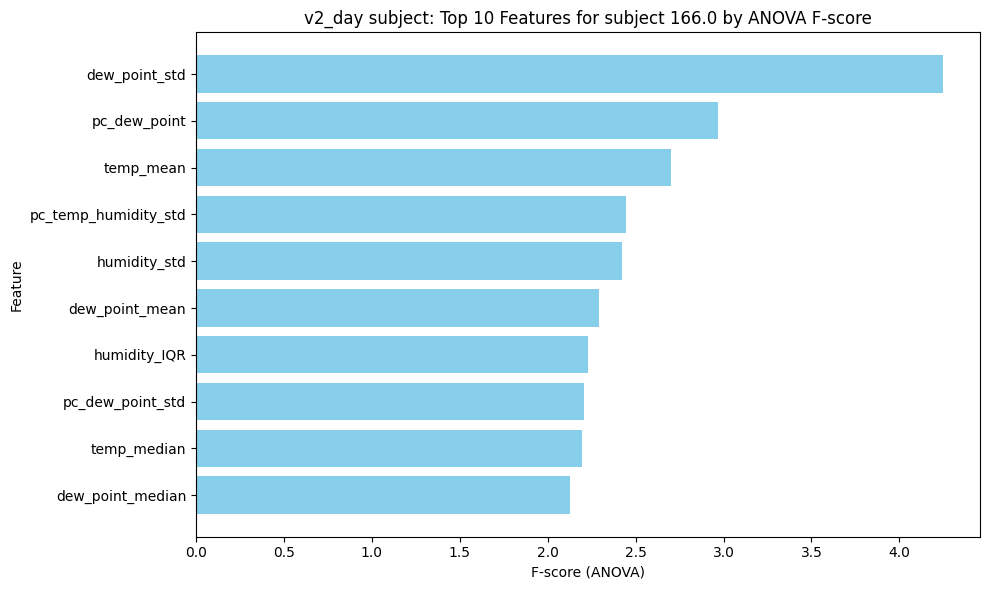

,hours_walking,distance_high_speed_transportation_hr,distance_active,distance_powered_vehicle_hr,distance_active_hr,hours_accounted_for,location_variance_hr,distance_walking,hours_high_speed_transportation_hr,hours_high_speed_transportation,...,phq2_sum,pc_commute,pc_active_mobility,pc_cloud_cover_std,pc_weather_means,pc_temp_humidity_std,pc_dew_point,pc_dew_point_std,pc_temp,pc_phq2
49,0.237762,-0.21834,0.343739,0.768026,-0.016947,-0.073220,0.298866,0.307113,-0.193123,-0.193354,...,-0.706470,-0.273218,1.192540,-0.111824,-2.161753,1.355386,0.222511,0.190029,1.384374,-0.899420
50,0.237762,-0.21834,0.343739,0.768026,-0.016947,-0.073220,0.298866,0.307113,-0.193123,-0.193354,...,-0.706470,-0.273218,1.192540,-0.111824,-2.161753,1.355386,0.222511,0.190029,1.384374,-0.899420
51,-0.361352,-0.21834,0.426191,0.687789,-0.145079,-0.015175,0.169334,0.076284,-0.193123,-0.193354,...,-0.706470,-0.273218,0.846079,1.054554,0.700602,1.077164,-1.181310,1.066218,0.346442,-0.899420
52,1.224871,-0.21834,0.800272,1.164700,0.853888,-0.813717,0.221152,0.971229,-0.193123,-0.193354,...,-1.311539,-0.273218,2.340995,1.596955,0.552262,0.852909,-1.160613,0.796065,-0.618328,-1.693495
53,0.178128,-0.21834,0.095040,0.750740,-0.251376,-1.166539,-0.659262,0.536498,-0.193123,-0.193354,...,-0.706470,-0.273218,0.723714,-0.017558,-1.763998,1.011699,-0.666090,0.613283,3.478272,-0.899420
54,1.121214,-0.21834,0.614899,0.955487,0.530477,-0.813717,0.061765,0.889347,-0.193123,-0.193354,...,-1.311539,-0.273218,1.892383,-1.554261,-2.669812,1.239222,-0.129797,0.205480,2.874882,-1.693495
55,-0.620590,-0.21834,0.513243,1.480566,0.511458,-1.166539,0.061586,0.132305,-0.193123,-0.193354,...,-0.706470,-0.273218,1.710896,-1.450964,-2.652170,1.335209,0.278201,0.259406,2.498591,-0.899420
56,0.330362,-0.21834,0.250561,0.397588,-0.919790,1.205508,0.796136,0.565155,-0.193123,-0.193354,...,-0.421061,-0.273218,0.963016,-0.676241,-2.778487,1.677783,0.022358,0.357975,2.690582,-0.524368
57,-0.247686,-0.21834,0.476894,0.794183,-0.154435,0.192001,0.628281,0.236075,-0.193123,-0.193354,...,-0.866300,-0.273218,1.348055,-1.089292,-3.587849,2.277889,1.331946,-0.066197,2.534844,-1.121872
58,1.270842,-0.21834,0.802428,0.675165,-0.149723,1.205508,0.845379,0.987049,-0.193123,-0.193354,...,-0.706470,-0.273218,1.871478,-0.727754,-3.284512,2.128624,1.986096,0.388971,0.600020,-0.899420


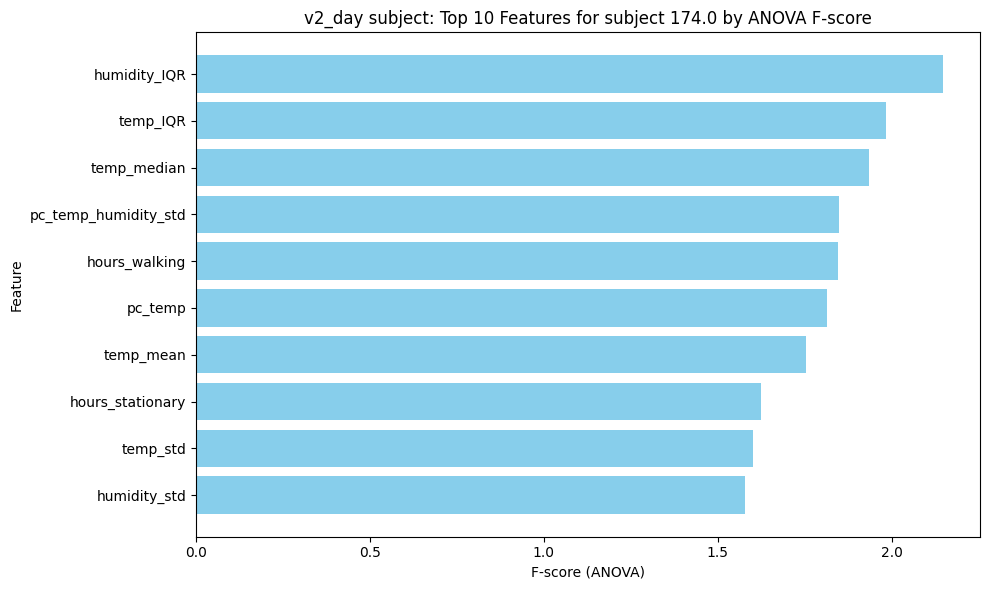

,hours_walking,distance_high_speed_transportation_hr,distance_active,distance_powered_vehicle_hr,distance_active_hr,hours_accounted_for,location_variance_hr,distance_walking,hours_high_speed_transportation_hr,hours_high_speed_transportation,...,phq2_sum,pc_commute,pc_active_mobility,pc_cloud_cover_std,pc_weather_means,pc_temp_humidity_std,pc_dew_point,pc_dew_point_std,pc_temp,pc_phq2
123,-1.006521,0.774423,-0.197892,0.731891,-0.292840,-0.121447,0.821868,-0.597019,0.736303,-0.193354,...,0.469418,0.376119,0.813874,-0.469649,-1.531297,1.340601,-0.248903,1.203594,1.468659,0.644758
124,-1.006521,0.774423,-0.153556,0.731891,-0.292840,-0.121447,0.821868,-0.575499,0.736303,-0.193354,...,-0.421061,0.376119,0.854795,0.718773,1.402560,1.218075,0.432528,1.636114,-1.254516,-0.524368
125,-1.096248,4.580015,0.807874,0.867225,1.044376,-1.166539,0.012579,-1.320046,3.511551,4.198794,...,-0.421061,6.850722,0.643203,-1.373424,-0.208426,0.445532,-1.552568,1.119923,-2.840725,-0.524368
126,-1.096248,-0.218340,0.505427,0.990904,0.497274,-1.166539,-0.062767,-1.320046,-0.193123,-0.193354,...,-1.311539,-0.273218,0.447569,0.667071,-0.525492,1.120783,-0.253092,1.455808,1.231192,-1.693495
127,1.200779,0.774423,-0.539580,0.731891,-0.292840,-0.121447,0.821868,0.803012,0.736303,-0.193354,...,-1.311539,0.376119,1.129291,0.873799,0.797793,1.593194,0.597439,1.994192,0.414856,-1.693495
128,0.906254,4.580015,0.612545,1.511473,-0.243519,0.842387,2.008887,0.922708,1.728823,4.198794,...,-1.311539,6.850722,3.498982,1.054554,0.054377,1.165970,-0.598177,1.534566,1.165060,-1.693495
129,1.460375,4.580015,-0.537629,1.806029,-1.660876,-0.247610,1.998839,0.968228,2.642869,4.198794,...,-1.311539,6.850722,2.923119,-0.701903,-0.807883,1.121368,-0.281016,1.285131,2.452455,-1.693495
130,-1.096248,4.580015,0.816324,0.344637,0.123765,0.701119,2.911932,-1.320046,7.515741,6.239921,...,-0.836617,6.850722,2.573348,1.054487,-0.154178,2.195527,-0.898774,2.558678,1.343428,-1.069961
131,-0.090541,-0.218340,0.596119,-0.042453,-0.384165,1.093301,0.536908,0.392262,-0.193123,-0.193354,...,-1.311539,-0.273218,0.563831,0.021374,-0.554604,2.482708,-1.294252,2.735370,1.227097,-1.693495
132,1.351829,-0.218340,1.279265,-0.374501,0.334718,1.500437,0.468889,1.035053,-0.193123,-0.193354,...,-1.311539,-0.273218,0.949202,0.512154,-0.008897,2.413836,-1.303145,2.722464,0.719926,-1.693495


################ v1_week ###############


/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: divide by zero encountered in divide
  f = msb / msw


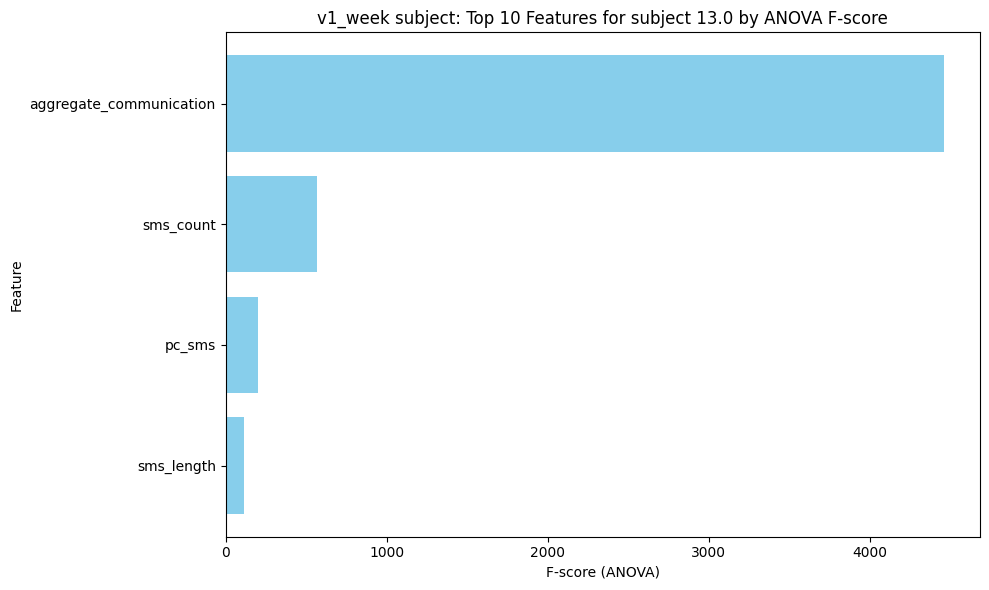

,mobility,mobility_radius,unreturned_calls,sms_count,aggregate_communication,call_duration,call_count,missed_interactions,sms_length,interaction_diversity,...,phq2_bin,phq9_category,income_lastyear,mood_1,pc_unreturned_calls,pc_calls,pc_mobility,pc_phq2,pc_sms,pc_mobility_radius
5,2.365980,-0.245957,-0.711691,-0.613502,-0.687526,-0.479609,-0.853664,-0.789442,-0.642482,-1.299268,...,1.000000,high,6.0,0.734736,-1.058513,-0.942652,2.396576,2.957899,-0.887847,-0.192900
6,2.365980,-0.245957,0.231650,-0.639297,-0.714761,-0.652062,-0.874260,-0.601237,-0.579162,-1.127349,...,1.000000,high,6.0,0.734736,-0.262088,-1.079159,2.396576,0.327834,-0.861313,-0.192900
7,2.216201,-1.363053,-0.711691,-0.434619,-0.513222,0.084519,-0.848515,-0.601237,-0.374320,-0.971059,...,0.714286,high,6.0,0.734736,-0.924517,-0.540108,2.246797,0.226413,-0.571739,-1.309996
8,2.676369,0.428688,-0.334354,-0.193492,-0.273553,0.850754,-0.797025,-0.601237,0.422890,-0.892914,...,0.428571,high,6.0,0.734736,-0.659546,0.038115,2.706965,-1.191186,0.162479,0.481745
9,2.205369,0.196493,-0.307402,-0.302840,-0.349811,0.187770,-0.513832,-0.318929,-0.047066,-0.541262,...,1.000000,high,6.0,0.734736,-0.439626,-0.230444,2.235965,0.020707,-0.247153,0.249550
10,2.365980,-0.245957,0.231650,-0.672943,-0.750167,-0.610961,-0.900005,-0.601237,-0.685798,-1.400856,...,1.000000,high,6.0,0.176854,-0.262088,-1.068301,2.396576,0.941783,-0.960508,-0.192900
11,2.365980,-0.245957,-0.037876,-0.672943,-0.728379,-0.301824,-0.694046,-0.224826,-0.686159,-1.088277,...,1.000000,high,6.0,0.734736,-0.183363,-0.704073,2.396576,1.454923,-0.960763,-0.192900
12,2.365980,-0.245957,-0.711691,-0.658924,-0.728379,-0.260417,-0.822770,-0.789442,-0.632872,-1.010132,...,1.000000,high,6.0,0.176854,-1.058513,-0.765813,2.396576,1.459736,-0.913170,-0.192900
13,2.365980,-0.245957,0.703320,-0.664531,-0.739273,-0.641767,-0.874260,-0.224826,-0.643349,-1.166422,...,1.000000,high,6.0,0.734736,0.337118,-1.071880,2.396576,0.428682,-0.924543,-0.192900
14,2.365980,-0.245957,-0.711691,-0.633690,-0.709314,-0.407764,-0.874260,-0.789442,-0.620107,-1.127349,...,1.000000,high,6.0,1.850500,-1.058513,-0.906413,2.396576,0.328235,-0.886300,-0.192900


/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:108: RuntimeWarning: invalid value encountered in divide
  msw = sswn / float(dfwn)


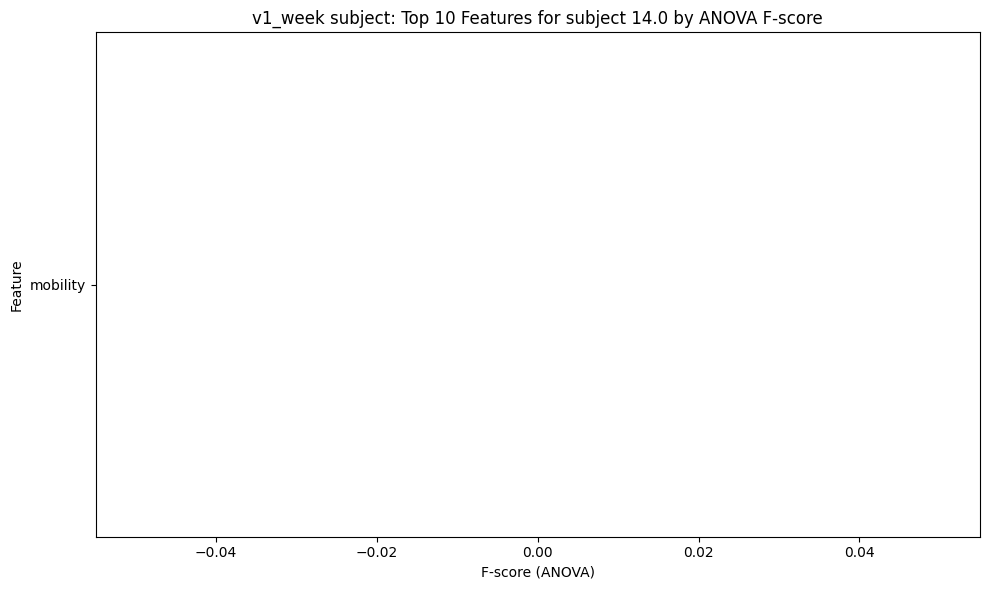

,mobility,mobility_radius,unreturned_calls,sms_count,aggregate_communication,call_duration,call_count,missed_interactions,sms_length,interaction_diversity,...,phq2_bin,phq9_category,income_lastyear,mood_1,pc_unreturned_calls,pc_calls,pc_mobility,pc_phq2,pc_sms,pc_mobility_radius
18,0.718692,-0.086778,-0.397244,2.302363,2.194397,-0.330057,-0.385107,-0.460083,3.221476,0.168554,...,0.714286,med-high,6.0,0.455795,-0.603211,-0.505586,0.749288,-0.179843,3.906215,-0.033721
19,0.718692,-0.086778,-0.397244,5.531881,5.312358,-0.559336,-0.565321,-0.507134,4.938931,0.201115,...,0.583333,med-high,6.0,0.176854,-0.636710,-0.795142,0.749288,-0.972061,7.404248,-0.033721
20,-1.450342,-1.960301,-0.711691,0.072870,0.023309,-0.332170,-0.436597,-0.695339,0.084497,-0.424045,...,0.428571,med-high,6.0,0.455795,-0.991515,-0.543488,-1.419746,-0.988917,0.111543,-1.907244
21,0.475449,-0.105018,-0.711691,0.193433,0.107738,-0.579156,-0.745536,-0.789442,0.626227,-0.463117,...,1.000000,med-high,6.0,0.455795,-1.058513,-0.936586,0.506045,0.224694,0.579856,-0.051961
22,1.362705,0.380094,0.231650,0.248108,0.214862,0.266501,-0.234929,-0.130723,0.699024,-0.013784,...,0.400000,med-high,6.0,0.455795,0.072900,0.022440,1.393301,-0.948463,0.669992,0.433151
23,0.718692,-0.086778,-0.711691,1.424304,1.319698,-0.477903,-0.591066,-0.695339,1.471246,0.005752,...,0.875000,med-high,6.0,0.176854,-0.991515,-0.755764,0.749288,-0.382111,2.047731,-0.033721
24,0.718692,-0.086778,-0.442165,2.343953,2.218455,-0.484433,-0.539577,-0.413031,2.153933,-0.033320,...,0.800000,med-high,6.0,1.013677,-0.601256,-0.723973,0.749288,-0.805672,3.180752,-0.033721
25,0.718692,-0.086778,-0.442165,1.853287,1.758182,-0.520847,-0.385107,-0.318929,1.283143,-0.345900,...,0.666667,med-high,6.0,0.455795,-0.534259,-0.640497,0.749288,-0.146131,2.218056,-0.033721
26,1.173754,-0.025619,-0.397244,0.681296,0.592522,-0.584073,-0.642556,-0.507134,0.394229,-0.658480,...,0.666667,med-high,6.0,0.455795,-0.636710,-0.867246,1.204350,-1.148545,0.760777,0.027438
27,0.852247,0.569784,-0.576928,0.692511,0.603416,-0.033558,-0.642556,-0.695339,0.874964,-0.228682,...,1.000000,med-high,6.0,0.455795,-0.896882,-0.477969,0.882843,0.675587,1.108640,0.622841


/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: divide by zero encountered in divide
  f = msb / msw


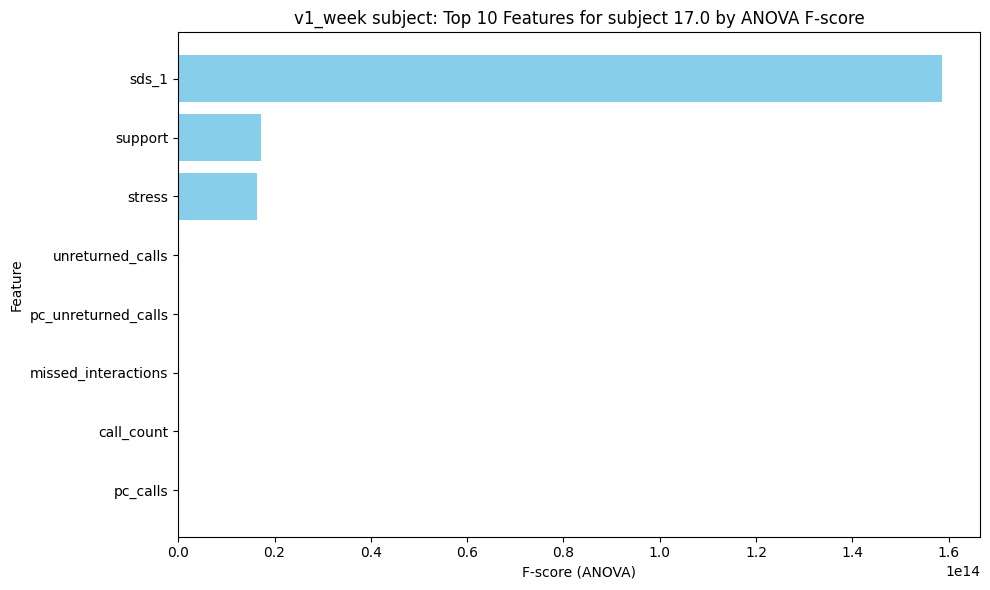

,mobility,mobility_radius,unreturned_calls,sms_count,aggregate_communication,call_duration,call_count,missed_interactions,sms_length,interaction_diversity,...,participant_id,phq9_category,income_lastyear,mood_1,pc_unreturned_calls,pc_calls,pc_mobility,pc_phq2,pc_sms,pc_mobility_radius
31,0.763886,-0.584508,-0.711691,-0.532753,-0.524116,0.469865,-0.050424,-0.507134,-0.601320,0.005752,...,BLUE-00066,med-high,6.0,1.013677,-0.857520,0.296704,0.794483,1.023121,-0.801643,-0.531451
32,0.763886,-0.584508,0.770702,0.863543,1.009218,2.541787,1.622992,1.186714,0.401756,1.021637,...,BLUE-00066,med-high,6.0,1.013677,1.389399,2.945061,0.794483,1.023121,0.894967,-0.531451
33,0.763886,-0.584508,-0.442165,-0.465461,-0.036608,3.135553,3.940031,2.315947,-0.488182,2.389173,...,BLUE-00066,med-high,6.0,1.013677,1.341676,5.003299,0.794483,2.443633,-0.674060,-0.531451
34,0.763886,-0.584508,-0.307402,-0.372936,-0.153719,1.173796,1.983421,0.057482,-0.473550,0.787202,...,BLUE-00066,med-high,6.0,1.013677,-0.171635,2.232595,0.794483,0.828062,-0.598289,-0.531451
35,0.763886,-0.584508,1.714043,-0.336486,-0.300788,0.111561,0.258514,3.445179,-0.435195,0.240187,...,BLUE-00066,med-high,6.0,1.013677,3.659772,0.261793,0.794483,1.236037,-0.545394,-0.531451
36,0.763886,-0.584508,1.040228,0.392504,0.418217,-0.070356,0.361494,1.186714,0.067216,0.748129,...,BLUE-00066,med-high,6.0,1.013677,1.578664,0.205974,0.794483,-0.382111,0.325337,-0.531451
37,0.763886,-0.584508,-0.711691,-0.591633,-0.513222,0.057017,0.593198,-0.789442,-0.607763,0.982564,...,BLUE-00066,med-high,6.0,1.013677,-1.058513,0.459878,0.794483,1.023121,-0.847833,-0.531451
38,0.763886,-0.584508,0.905465,-0.557987,-0.556798,-0.039320,-0.127659,1.092612,-0.663761,-0.384972,...,BLUE-00066,med-high,6.0,1.013677,1.417034,-0.117960,0.794483,1.023121,-0.863639,-0.531451
39,0.763886,-0.584508,0.096887,-0.229941,-0.085631,0.652320,1.314054,1.563125,-0.383232,0.943492,...,BLUE-00066,med-high,6.0,1.013677,1.184226,1.390543,0.794483,1.023121,-0.433312,-0.531451
40,0.763886,-0.584508,-0.711691,-0.252372,-0.219083,-0.298137,0.258514,-0.507134,-0.339156,-0.150537,...,BLUE-00066,med-high,6.0,1.013677,-0.857520,-0.027910,0.794483,1.023121,-0.418006,-0.531451


/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: divide by zero encountered in divide
  f = msb / msw
/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: divide by zero encountered in divide
  f = msb / msw
/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: divide by zero encountered in divide
  f = msb / msw
/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: divide by zero encountered in divide
  f = msb / msw
/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: divide by zero encountered in divide
  f = msb / msw
/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selecti

/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:108: RuntimeWarning: invalid value encountered in divide
  msw = sswn / float(dfwn)
/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: divide by zero encountered in divide
  f = msb / msw
/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: divide by zero encountered in divide
  f = msb / msw
/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:108: RuntimeWarning: invalid value encountered in divide
  msw = sswn / float(dfwn)
/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: divide by zero encountered in divide
  f = msb / msw
/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection

################ v2_week ###############


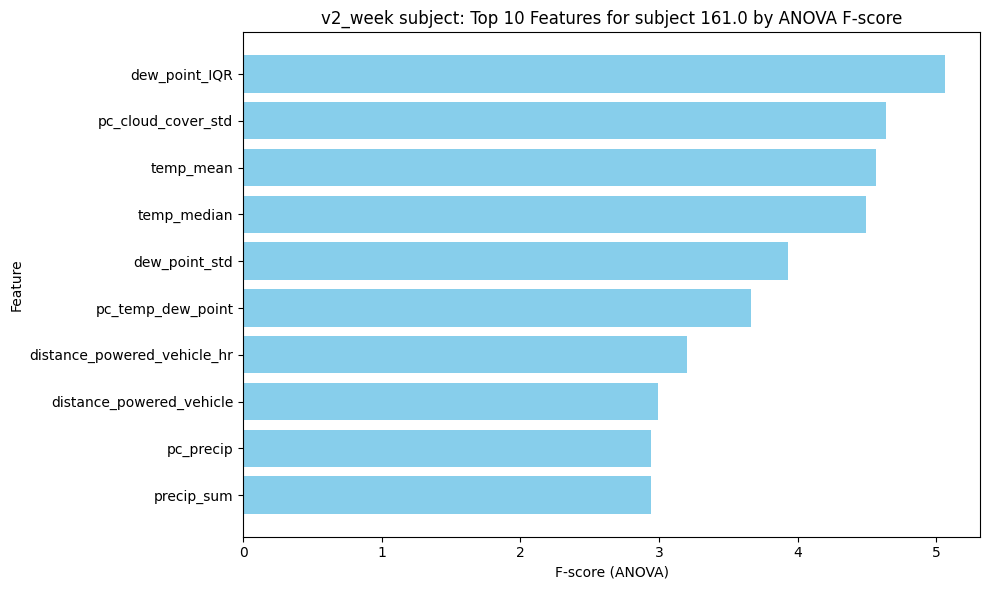

,hours_walking,distance_high_speed_transportation_hr,distance_active,distance_powered_vehicle_hr,distance_active_hr,hours_accounted_for,location_variance_hr,distance_walking,hours_high_speed_transportation_hr,hours_high_speed_transportation,...,phq2_sum,pc_active_mobility,pc_commute,pc_temp_dew_point,pc_humidity_cloud_mean,pc_cloud_cover_std,pc_dew_point_std,pc_phq2,pc_temp_humidity_std,pc_precip
0,0.346727,0.667575,0.208644,0.323936,0.257873,-0.461678,0.119119,0.311110,1.263587,1.076547,...,-1.135599,0.723768,0.939731,2.684983,-0.562273,-0.695156,0.144060,-1.497206,2.017596,0.334953
1,0.346727,0.667575,0.208644,0.323936,0.257873,-0.461678,0.119119,0.311110,1.263587,1.076547,...,-1.135599,0.723768,0.939731,2.684983,-0.562273,-0.695156,0.144060,-1.497206,2.017596,0.334953
2,0.346727,0.667575,0.208644,0.323936,0.257873,-0.461678,0.119119,0.311110,1.263587,1.076547,...,-1.135599,0.723768,0.939731,2.684983,-0.562273,-0.695156,0.144060,-1.497206,2.017596,0.334953
3,0.626867,2.190797,-0.124263,1.692661,-0.110135,-0.751921,0.473137,0.568677,4.934933,4.397465,...,-0.470513,1.750761,3.067181,3.608452,-0.909053,-1.620945,0.322080,-0.610017,2.938607,-0.529502
4,0.268573,2.140646,0.726961,0.536190,0.879385,-0.732642,-0.174907,0.213301,0.140158,0.042492,...,-0.470513,1.119895,2.993993,3.751229,-1.643734,-1.402898,-0.502296,-0.609181,3.063261,0.046203
5,0.823388,-0.462517,0.490060,-0.368171,0.532727,-0.002894,-0.304237,0.683330,-0.293600,-0.326715,...,-1.173246,0.501569,-0.638110,2.656756,0.157025,-1.265173,-0.132260,-1.547140,0.659765,1.753811
6,1.097139,2.191647,0.279633,-0.089569,0.380176,-1.117392,1.074294,0.970710,4.944420,4.402731,...,-1.524612,1.691572,3.069386,2.058615,1.402026,-1.010579,-0.260638,-2.016537,0.044295,-0.427633
7,0.010128,-0.462517,0.406088,-0.150441,0.123363,-0.332377,-0.282212,0.035625,-0.293600,-0.326715,...,-1.261087,-0.129443,-0.638110,1.991584,-0.693722,0.329582,0.594355,-1.664489,3.013089,1.548624
8,0.304248,-0.462517,0.343377,0.362460,0.583499,-0.332377,0.138719,0.241974,-0.293600,-0.326715,...,-1.524612,1.018109,-0.638110,3.053606,-0.393993,0.250552,3.006035,-2.016537,1.432743,0.924725
9,-0.703255,-0.462517,-0.661346,0.284419,-0.583901,0.037855,-0.090965,-0.535847,-0.293600,-0.326715,...,-1.524612,-0.886089,-0.638110,1.674638,-1.854461,-0.146628,-2.018854,-2.016537,2.971411,-0.971556


/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:108: RuntimeWarning: invalid value encountered in divide
  msw = sswn / float(dfwn)


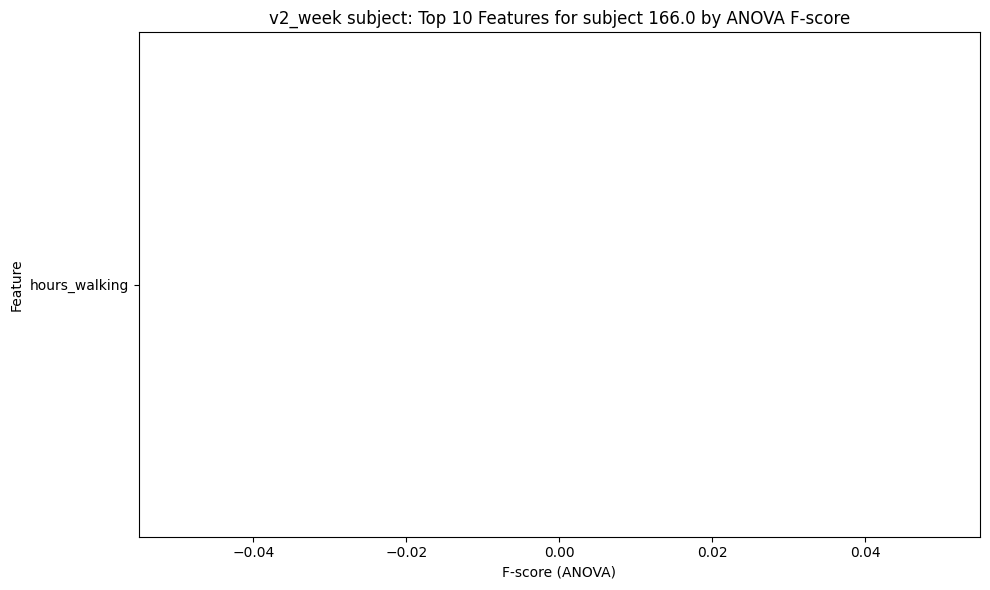

,hours_walking,distance_high_speed_transportation_hr,distance_active,distance_powered_vehicle_hr,distance_active_hr,hours_accounted_for,location_variance_hr,distance_walking,hours_high_speed_transportation_hr,hours_high_speed_transportation,...,phq2_sum,pc_active_mobility,pc_commute,pc_temp_dew_point,pc_humidity_cloud_mean,pc_cloud_cover_std,pc_dew_point_std,pc_phq2,pc_temp_humidity_std,pc_precip
10,0.129476,-0.462517,0.201768,0.753476,0.041334,0.085409,0.451290,0.101623,-0.2936,-0.326715,...,-0.869222,1.035960,-0.63811,1.145129,-2.381002,0.375160,0.056308,-1.141783,1.931905,-0.560437
11,-0.870247,-0.462517,0.153126,0.480433,-0.252295,0.037855,0.371346,-0.830756,-0.2936,-0.326715,...,-0.869222,0.054919,-0.63811,1.671552,1.482375,-2.163812,2.076867,-1.141783,0.528715,-0.971556
12,0.258342,-0.462517,0.473500,0.817633,0.438602,-0.265961,0.415100,0.153723,-0.2936,-0.326715,...,-0.681333,1.298903,-0.63811,0.834108,-5.055406,-0.899534,-2.202447,-0.890987,1.004614,-0.971556
13,-0.340790,-0.462517,0.417454,0.765756,0.456428,-0.718286,0.163790,-0.244002,-0.2936,-0.326715,...,-0.018756,1.005386,-0.63811,0.028554,-3.415903,5.493910,-0.488125,-0.006626,2.036577,-0.785502
14,0.410432,-0.462517,-0.150315,0.818343,-0.380389,0.397985,0.594879,0.309942,-0.2936,-0.326715,...,-1.223441,1.004714,-0.63811,0.087229,-1.431308,2.209107,1.448997,-1.614555,1.421062,1.181212
15,0.442297,-0.462517,0.334226,0.911625,0.102334,0.155346,0.466433,0.378725,-0.2936,-0.326715,...,-1.129325,1.430937,-0.63811,1.453345,-2.907298,0.336379,-1.105163,-1.489092,3.055950,-0.971556
16,0.138965,-0.462517,0.133012,0.244824,-0.121596,1.237381,0.817645,0.047754,-0.2936,-0.326715,...,-1.173246,0.562929,-0.63811,1.806277,-2.002111,1.227559,0.106034,-1.547558,2.452873,0.408173
17,0.410154,-0.462517,0.146109,0.704383,-0.296441,0.193004,0.511012,0.363458,-0.2936,-0.326715,...,-0.470513,1.104612,-0.63811,1.802115,-3.017078,-1.289179,-1.254183,-0.609599,2.013944,-0.971556
18,0.105446,-0.462517,0.389587,0.981832,0.432467,0.421284,0.621777,0.197427,-0.2936,-0.326715,...,-1.524612,1.685393,-0.63811,1.061863,-3.610351,0.643119,-0.757411,-2.016537,3.148793,-0.971556
19,0.194373,-0.462517,-0.072299,1.018011,-0.508061,0.653863,0.799008,0.178047,-0.2936,-0.326715,...,-0.821879,1.161641,-0.63811,1.491207,-0.453551,-1.068911,3.070412,-1.078579,1.718266,-0.917071


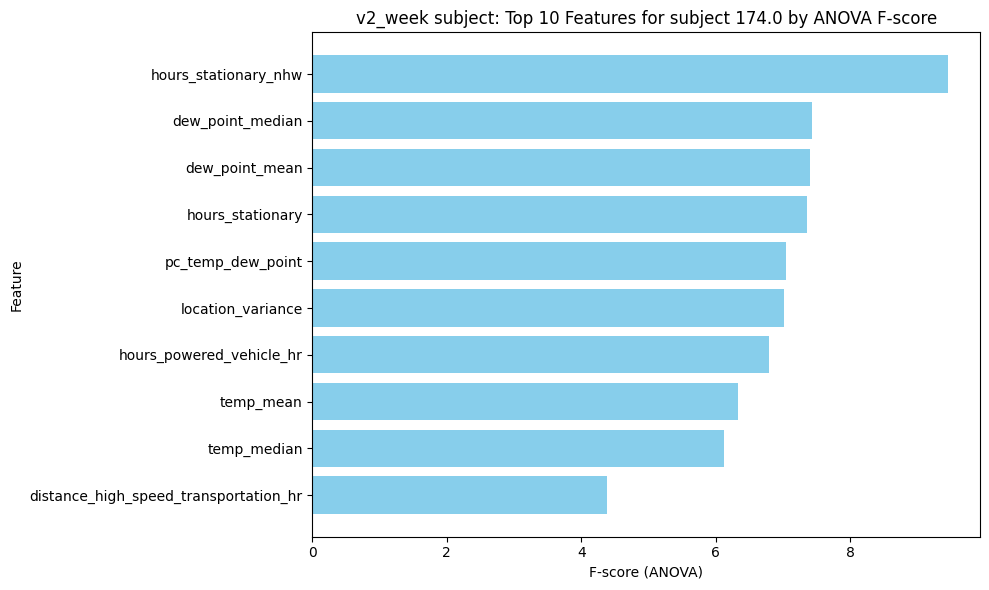

,hours_walking,distance_high_speed_transportation_hr,distance_active,distance_powered_vehicle_hr,distance_active_hr,hours_accounted_for,location_variance_hr,distance_walking,hours_high_speed_transportation_hr,hours_high_speed_transportation,...,phq2_sum,pc_active_mobility,pc_commute,pc_temp_dew_point,pc_humidity_cloud_mean,pc_cloud_cover_std,pc_dew_point_std,pc_phq2,pc_temp_humidity_std,pc_precip
23,0.161782,2.174946,-0.143504,1.613216,0.162989,-0.265961,1.245621,0.001570,0.973814,0.694505,...,-0.922270,1.973973,3.039316,2.016821,-0.084287,-0.562004,0.215962,-1.212573,0.584610,-0.709632
24,0.304248,2.191180,0.749450,-0.317514,-0.048019,1.019042,0.811497,0.250883,4.944412,4.402731,...,-1.524612,0.531042,3.068623,3.718411,-0.097530,-1.665155,1.594453,-2.016537,1.765212,0.476908
25,-0.059562,-0.462517,-0.709891,0.644844,-0.978510,-0.139048,0.430728,-0.070771,-0.293600,-0.326715,...,-0.997562,0.216731,-0.638110,-1.184300,2.004240,0.107250,0.555814,-1.313068,-1.777643,-0.216694
26,-0.547590,-0.462517,-0.458743,0.519609,-0.874265,-0.265961,0.663263,-0.621362,-0.293600,-0.326715,...,-0.470513,0.016595,-0.638110,-0.227865,1.349364,-0.290223,-2.599584,-0.609599,-1.277314,1.932437
27,1.121505,2.191437,0.538268,0.719949,0.758492,0.147726,1.309565,0.944884,4.944413,4.402729,...,-0.897172,2.477555,3.068871,2.232017,2.256833,-1.994925,-1.035348,-1.179074,-2.153174,0.786568
28,0.525286,2.142923,-0.124588,1.416204,-0.352897,-0.620225,0.992115,0.312465,0.046996,0.042492,...,-0.897172,1.819113,3.002294,1.095913,0.875898,1.810015,2.901125,-1.179074,0.379969,-0.564472
29,-0.735555,2.191679,-0.244870,0.542612,0.042719,-1.039747,3.301296,-0.600098,4.944420,4.402731,...,-0.897172,1.530059,3.069364,2.477594,0.226544,-0.988554,0.640727,-1.179074,-0.608352,-0.472354
30,0.563079,2.160457,0.157560,1.515456,-0.102113,0.200450,1.490905,0.522043,0.319399,0.382086,...,-0.897172,2.440992,3.025244,0.355414,0.199332,-0.152087,1.762381,-1.179074,0.729589,-0.971556
31,-1.577286,2.176842,-0.474547,0.750448,-0.897605,-1.280340,0.031154,-1.427762,0.902466,0.382086,...,-0.897172,-0.546144,3.038465,0.424409,1.552496,0.005917,0.576538,-1.179074,-1.536434,1.737829
32,0.133544,-0.462517,-0.194746,1.576999,-0.409163,-0.698337,0.491127,0.027850,-0.293600,-0.326715,...,-0.897172,1.493303,-0.638110,0.611872,0.155930,0.610997,-1.084708,-1.179074,0.029630,0.786568


/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: divide by zero encountered in divide
  f = msb / msw
/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: divide by zero encountered in divide
  f = msb / msw
/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: divide by zero encountered in divide
  f = msb / msw
/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: divide by zero encountered in divide
  f = msb / msw
/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: divide by zero encountered in divide
  f = msb / msw
/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selecti

Adding to v1_day for phq2_sum: ['sds_3', 'sds_2', 'stress', 'sds_1', 'support', 'aggregate_communication', 'sms_count', 'mobility', 'pc_mobility', 'pc_sms', 'sms_length', 'interaction_diversity', 'missed_interactions', 'pc_unreturned_calls', 'call_count']


Adding to v2_day for phq2_sum: ['temp_mean', 'pc_temp_humidity_std', 'temp_median', 'hours_of_sleep', 'distance_active_hr', 'humidity_IQR', 'hours_active_hr', 'hours_of_sleep_hr', 'humidity_std', 'location_variance', 'temp_IQR', 'pc_temp', 'dew_point_mean', 'pc_dew_point_std', 'pc_active_mobility']


Adding to v1_week for phq2_sum: ['call_duration', 'missed_interactions', 'sms_length', 'sds_3', 'interaction_diversity', 'sds_1', 'aggregate_communication', 'unreturned_calls', 'call_count', 'support', 'stress', 'mobility', 'mobility_radius', 'sds_2', 'sms_count']


Adding to v2_week for phq2_sum: ['hours_walking', 'distance_walking', 'sds_3', 'hours_high_speed_transportation_hr', 'support', 'distance_high_speed_transportation_hr', 'hours_high_speed_transportation', 'sds_1', 'pc_commute', 'distance_active_hr', 'mood_1', 'hours_of_sleep', 'distance_active', 'sds_2', 'hours_accounted_for']
################ v1_day ###############


/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning:

divide by zero encountered in divide



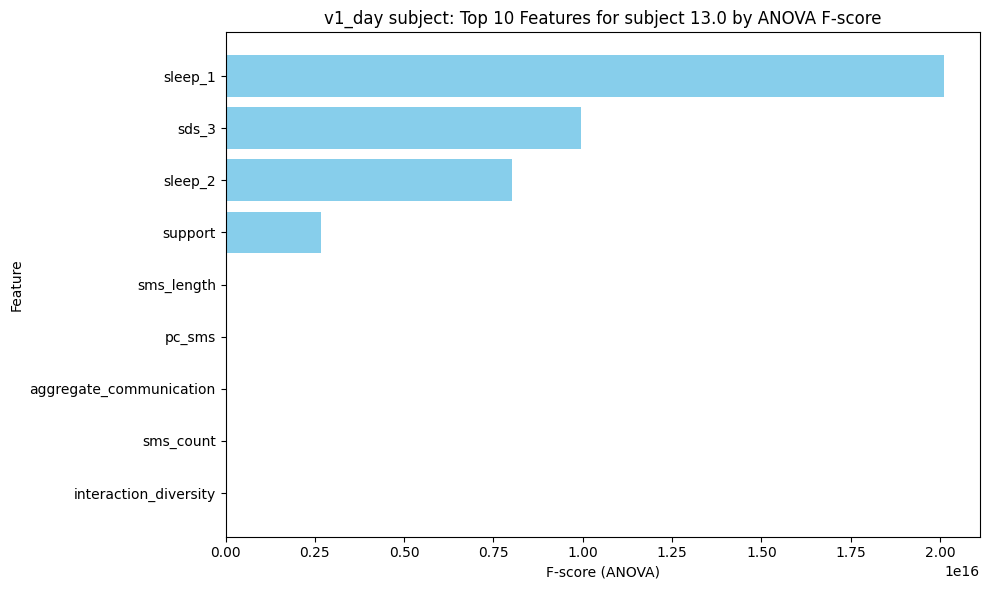

,mobility,mobility_radius,unreturned_calls,sms_count,aggregate_communication,call_duration,call_count,missed_interactions,sms_length,interaction_diversity,...,phq2_bin,phq9_category,income_lastyear,mood_1,pc_mobility,pc_calls,pc_unreturned_calls,pc_sms,pc_phq2,phq9_sum
31,2.306195,0.26825,-0.243433,-0.507714,-0.568199,-0.246027,-0.644551,-0.417007,-0.418630,-0.939191,...,1.0,high,6.0,0.74044,2.156541,-0.631383,-0.453963,-0.656631,2.538556,NaN
32,2.306195,0.26825,-0.243433,-0.507714,-0.568199,-0.246027,-0.644551,-0.417007,-0.418630,-0.939191,...,1.0,high,6.0,0.74044,2.156541,-0.631383,-0.453963,-0.656631,2.538556,NaN
33,2.306195,0.26825,-0.527078,-0.475153,-0.528979,-0.184631,-0.578802,-0.548976,-0.502945,-1.033784,...,1.0,high,6.0,0.74044,2.156541,-0.541471,-0.742176,-0.693152,3.134169,NaN
34,2.306195,0.26825,-0.527078,-0.475153,-0.528979,-0.184631,-0.578802,-0.548976,-0.502945,-1.033784,...,1.0,high,6.0,0.74044,2.156541,-0.541471,-0.742176,-0.693152,3.134169,NaN
35,2.306195,0.26825,-0.243433,-0.584506,-0.650104,-0.469839,-0.708735,-0.548976,-0.550846,-1.033784,...,1.0,high,6.0,0.74044,2.156541,-0.834784,-0.551784,-0.804388,2.538556,NaN
36,2.306195,0.26825,-0.243433,-0.584506,-0.650104,-0.469839,-0.708735,-0.548976,-0.550846,-1.033784,...,1.0,high,6.0,0.74044,2.156541,-0.834784,-0.551784,-0.804388,2.538556,NaN
37,2.306195,0.26825,-0.243433,-0.600128,-0.665245,-0.469839,-0.708735,-0.548976,-0.587252,-1.251873,...,1.0,high,6.0,0.74044,2.156541,-0.834784,-0.551784,-0.841163,0.183459,NaN
38,2.306195,0.26825,-0.243433,-0.600128,-0.665245,-0.469839,-0.708735,-0.548976,-0.587252,-1.251873,...,1.0,high,6.0,0.74044,2.156541,-0.834784,-0.551784,-0.841163,0.183459,NaN
39,2.306195,0.26825,0.119001,-0.584506,-0.634964,-0.460460,-0.578802,-0.110840,-0.554679,-0.815694,...,NaN,high,6.0,0.74044,2.156541,-0.736093,0.016260,-0.807095,0.309651,NaN
40,2.306195,0.26825,0.119001,-0.584506,-0.634964,-0.460460,-0.578802,-0.110840,-0.554679,-0.815694,...,NaN,high,6.0,0.74044,2.156541,-0.736093,0.016260,-0.807095,0.309651,NaN


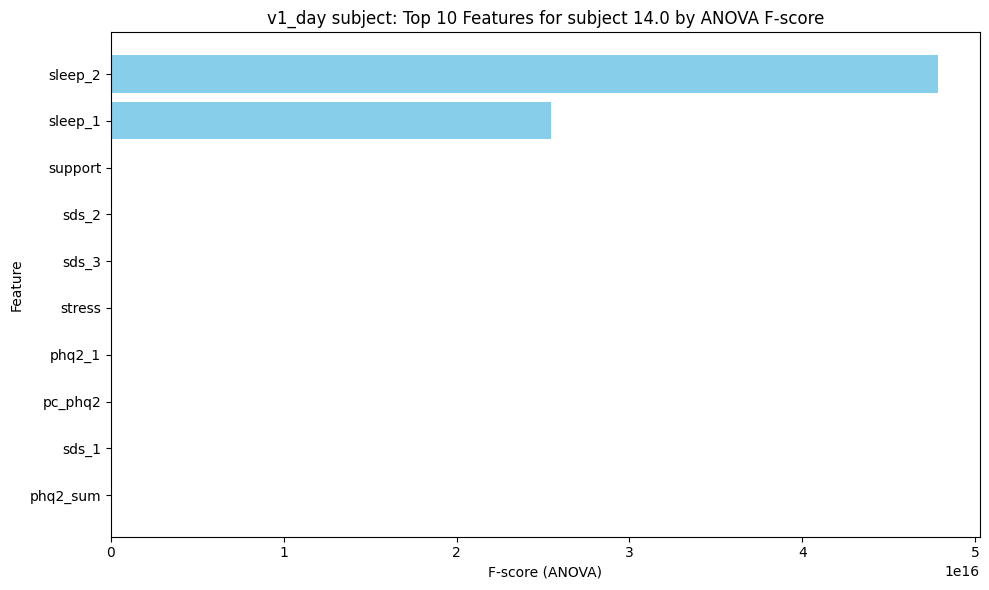

,mobility,mobility_radius,unreturned_calls,sms_count,aggregate_communication,call_duration,call_count,missed_interactions,sms_length,interaction_diversity,...,phq2_bin,phq9_category,income_lastyear,mood_1,pc_mobility,pc_calls,pc_unreturned_calls,pc_sms,pc_phq2,phq9_sum
116,0.448694,0.06147,-0.427681,0.968763,0.889187,-0.261991,-0.417932,-0.402931,0.925018,-0.234122,...,1.0,med-high,6.0,0.465707,0.484595,-0.482060,-0.567203,1.337583,1.952062,NaN
117,0.448694,0.06147,0.119001,0.509031,0.440017,-0.445869,-0.448868,-0.110840,0.761346,-0.379515,...,1.0,med-high,6.0,0.465707,0.484595,-0.633725,0.016260,0.896579,0.769954,NaN
118,0.448694,0.06147,-0.527078,-0.178336,-0.211027,-0.347210,-0.318935,-0.110840,-0.079492,0.492843,...,1.0,med-high,6.0,0.465707,0.484595,-0.472038,-0.417411,-0.183925,-0.412154,NaN
119,0.448694,0.06147,-0.527078,4.711338,4.527971,0.412883,-0.318935,-0.548976,7.071622,0.492843,...,0.0,med-high,6.0,0.465707,0.484595,0.064275,-0.742176,8.328738,-1.594261,NaN
120,0.448694,0.06147,-0.527078,4.070837,3.892067,-0.454901,-0.448868,-0.548976,5.019505,-0.597605,...,0.0,med-high,6.0,0.465707,0.484595,-0.640098,-0.742176,6.425679,-1.594261,NaN
121,0.448694,0.06147,0.119001,0.821470,0.788250,-0.270089,-0.059069,-0.110840,0.799348,0.274753,...,1.0,med-high,6.0,0.465707,0.484595,-0.233476,0.016260,1.144555,-0.412154,NaN
122,0.448694,0.06147,-0.527078,0.727738,0.667126,-0.449691,-0.318935,-0.548976,0.759430,0.274753,...,1.0,med-high,6.0,0.465707,0.484595,-0.544348,-0.742176,1.050015,-0.412154,NaN
123,0.448694,0.06147,0.119001,7.663888,7.344118,-0.469839,-0.708735,-0.110840,6.390457,0.056664,...,0.0,med-high,6.0,0.190975,0.484595,-0.834784,0.016260,9.937187,-1.594261,0.155439
124,0.448694,0.06147,-0.527078,5.226862,4.997329,-0.316292,-0.578802,-0.548976,4.324289,-0.379515,...,0.0,med-high,6.0,0.190975,0.484595,-0.634370,-0.742176,6.752711,-1.594261,0.155439
125,0.448694,0.06147,-0.427681,4.851935,4.618815,-0.469839,-0.708735,-0.548976,4.329718,0.274753,...,1.0,med-high,6.0,0.190975,0.484595,-0.834784,-0.675458,6.491192,-0.412154,0.155439


/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning:

divide by zero encountered in divide



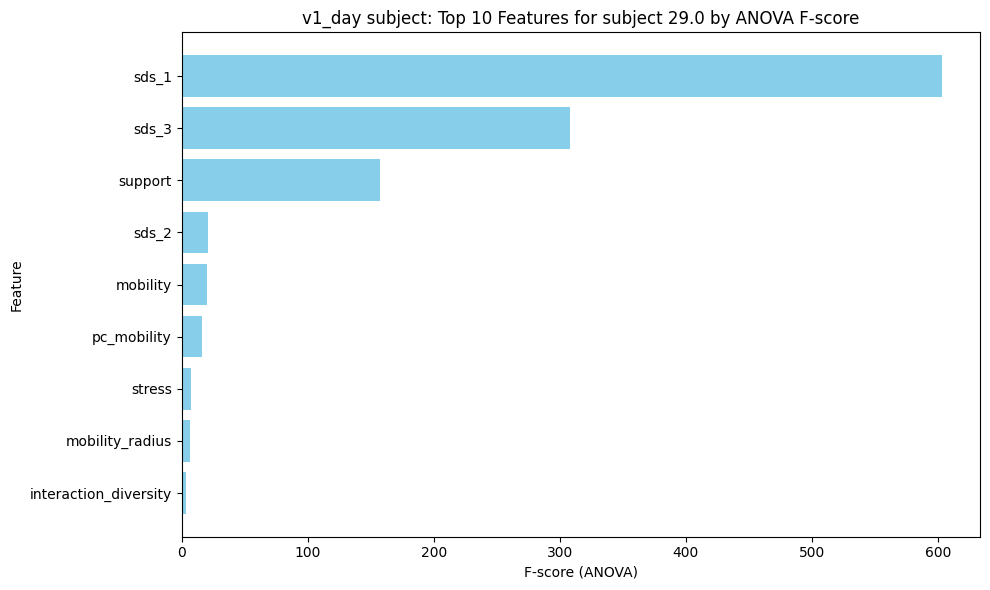

,mobility,mobility_radius,unreturned_calls,sms_count,aggregate_communication,call_duration,call_count,missed_interactions,sms_length,interaction_diversity,...,phq2_bin,phq9_category,income_lastyear,mood_1,pc_mobility,pc_calls,pc_unreturned_calls,pc_sms,pc_phq2,phq9_sum
201,-0.693058,-0.569776,0.119001,-0.475153,-0.513839,-0.445174,-0.448868,-0.110840,-0.431092,-0.379515,...,NaN,high,6.0,-0.633221,-0.816923,-0.633234,0.016260,-0.642390,1.865061,NaN
202,-0.693058,-0.569776,0.119001,-0.475153,-0.513839,-0.445174,-0.448868,-0.110840,-0.431092,-0.379515,...,NaN,high,6.0,-0.633221,-0.816923,-0.633234,0.016260,-0.642390,1.865061,NaN
203,-0.693058,-0.569776,3.349397,-0.522019,-0.392714,-0.231181,0.980396,2.079836,-0.530408,0.710933,...,1.0,high,6.0,-0.633221,-0.816923,0.530563,3.808441,-0.745723,3.134169,NaN
204,-0.693058,-0.569776,3.349397,-0.522019,-0.392714,-0.231181,0.980396,2.079836,-0.530408,0.710933,...,1.0,high,6.0,-0.633221,-0.816923,0.530563,3.808441,-0.745723,3.134169,NaN
205,-0.693058,-0.569776,0.119001,-0.522019,-0.559261,-0.328798,-0.448868,2.517972,-0.401712,0.056664,...,1.0,high,6.0,-0.633221,-0.816923,-0.551121,1.964854,-0.654804,2.547675,NaN
206,-0.693058,-0.569776,0.119001,-0.522019,-0.559261,-0.328798,-0.448868,2.517972,-0.401712,0.056664,...,1.0,high,6.0,-0.633221,-0.816923,-0.551121,1.964854,-0.654804,2.547675,NaN
207,-0.693058,-0.569776,2.057239,-0.568885,-0.498698,-0.313513,0.460663,1.203566,-0.510290,-0.161426,...,1.0,high,6.0,-0.633221,-0.816923,0.104178,2.291569,-0.764679,0.769954,NaN
208,-0.693058,-0.569776,2.057239,-0.568885,-0.498698,-0.313513,0.460663,1.203566,-0.510290,-0.161426,...,1.0,high,6.0,-0.633221,-0.816923,0.104178,2.291569,-0.764679,0.769954,0.528735
209,-0.693058,-0.569776,3.995476,-0.475153,-0.513839,-0.376043,-0.448868,2.517972,-0.337843,-0.379515,...,1.0,high,6.0,-0.633221,-0.816923,-0.584456,4.566877,-0.576513,1.952062,0.528735
210,-0.693058,-0.569776,3.995476,-0.475153,-0.513839,-0.376043,-0.448868,2.517972,-0.337843,-0.379515,...,1.0,high,6.0,-0.633221,-0.816923,-0.584456,4.566877,-0.576513,1.952062,0.528735


/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning:

divide by zero encountered in divide

/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning:

divide by zero encountered in divide

/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning:

divide by zero encountered in divide

/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning:

Features [16] are constant.

/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning:

divide by zero encountered in divide

/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning:

divide by zero encountered in divide

/Users/klj9278/m

/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning:

divide by zero encountered in divide

/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning:

divide by zero encountered in divide

/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning:

divide by zero encountered in divide

/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning:

divide by zero encountered in divide

/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning:

divide by zero encountered in divide

/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning:

divide by zero encountered in divide

/Use

################ v2_day ###############


/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning:

divide by zero encountered in divide



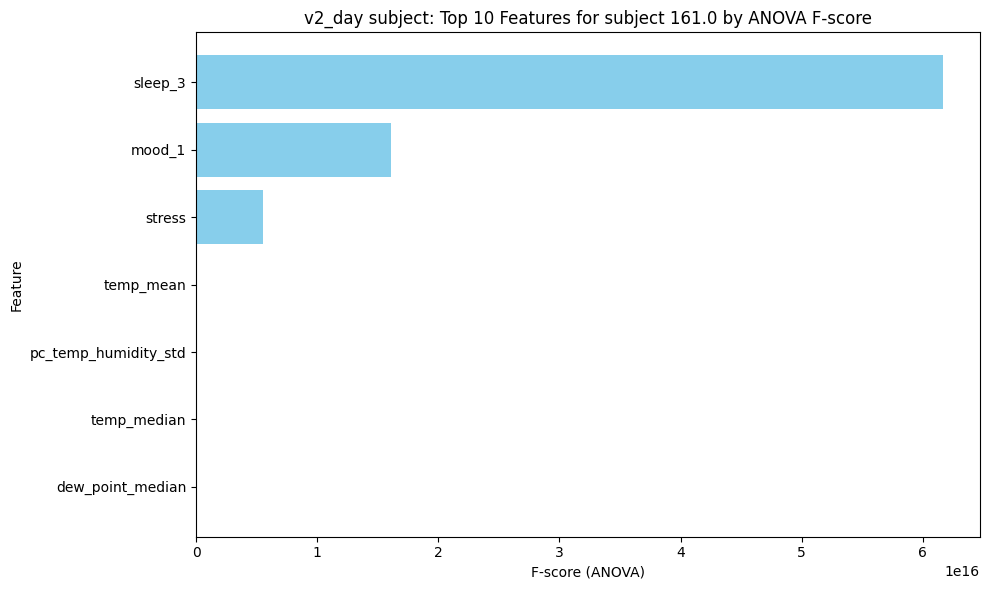

,hours_walking,distance_high_speed_transportation_hr,distance_active,distance_powered_vehicle_hr,distance_active_hr,hours_accounted_for,location_variance_hr,distance_walking,hours_high_speed_transportation_hr,hours_high_speed_transportation,...,pc_commute,pc_active_mobility,pc_cloud_cover_std,pc_weather_means,pc_temp_humidity_std,pc_dew_point,pc_dew_point_std,pc_temp,pc_phq2,phq9_sum
0,0.354998,0.330044,0.234812,0.237594,0.283147,-0.565722,0.182047,0.399520,0.585301,0.357622,...,0.456205,0.783720,0.138818,-0.318551,1.781262,-0.333336,1.743657,1.220219,-1.175420,-0.404742
1,0.354998,0.330044,0.234812,0.237594,0.283147,-0.565722,0.182047,0.399520,0.585301,0.357622,...,0.456205,0.783720,0.138818,-0.318551,1.781262,-0.333336,1.743657,1.220219,-1.175420,-0.404742
2,0.354998,0.330044,0.234812,0.237594,0.283147,-0.565722,0.182047,0.399520,0.585301,0.357622,...,0.456205,0.783720,0.138818,-0.318551,1.781262,-0.333336,1.743657,1.220219,-1.175420,NaN
3,0.354998,0.330044,0.234812,0.237594,0.283147,-0.565722,0.182047,0.399520,0.585301,0.357622,...,0.456205,0.783720,0.138818,-0.318551,1.781262,-0.333336,1.743657,1.220219,-1.175420,-0.890900
4,0.354998,0.330044,0.234812,0.237594,0.283147,-0.565722,0.182047,0.399520,0.585301,0.357622,...,0.456205,0.783720,0.138818,-0.318551,1.781262,-0.333336,1.743657,1.220219,-1.175420,-0.890900
5,0.354998,0.330044,0.234812,0.237594,0.283147,-0.565722,0.182047,0.399520,0.585301,0.357622,...,0.456205,0.783720,0.138818,-0.318551,1.781262,-0.333336,1.743657,1.220219,-1.175420,-1.052953
6,0.804208,0.330044,-0.503367,0.237594,0.283147,-0.565722,0.182047,0.769125,0.585301,-0.193354,...,0.085464,-0.423223,-0.340271,-1.290710,2.267533,-0.261753,2.045740,2.627657,-1.175420,-1.052953
7,0.494229,-0.218340,-0.068230,1.380313,-0.551485,-1.166539,0.289037,0.644755,-0.193123,-0.193354,...,-0.273218,1.707409,0.538018,-0.795199,2.539571,-0.957846,2.359082,1.914649,-0.550249,-1.052953
8,1.187970,4.580015,0.939833,1.963017,0.800808,-0.247610,2.271359,0.984713,7.515741,6.239921,...,6.850722,4.355004,0.344263,0.077919,2.432220,-1.121349,2.461274,1.027867,0.644758,-1.052953
9,0.736042,-0.218340,-0.135402,-0.608071,-0.893918,-0.511139,-1.069954,0.712747,-0.193123,-0.193354,...,-0.273218,-0.798890,0.098806,-0.684072,2.544637,-1.140492,2.427559,2.017841,-1.693495,-1.052953


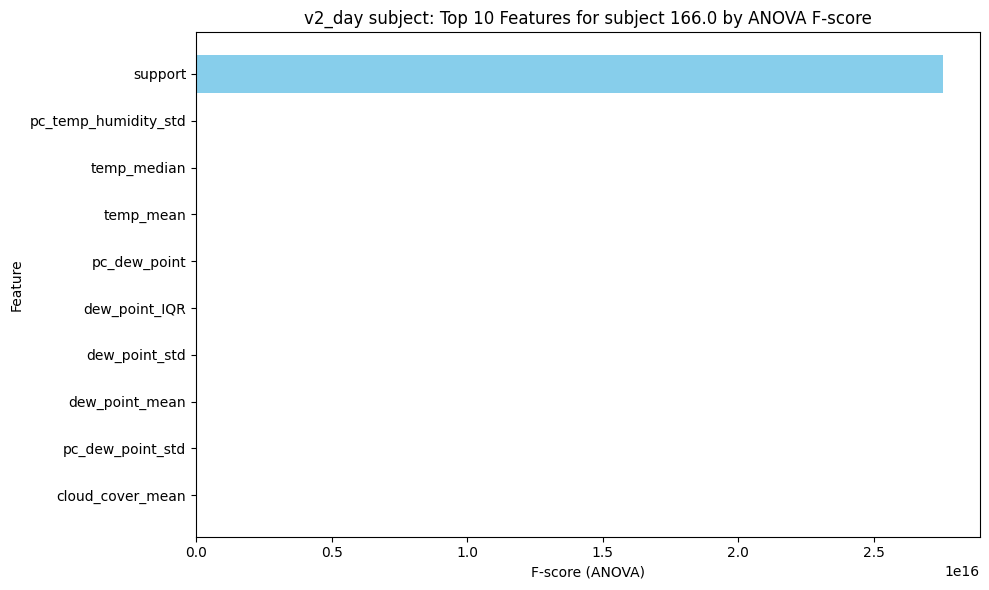

,hours_walking,distance_high_speed_transportation_hr,distance_active,distance_powered_vehicle_hr,distance_active_hr,hours_accounted_for,location_variance_hr,distance_walking,hours_high_speed_transportation_hr,hours_high_speed_transportation,...,pc_commute,pc_active_mobility,pc_cloud_cover_std,pc_weather_means,pc_temp_humidity_std,pc_dew_point,pc_dew_point_std,pc_temp,pc_phq2,phq9_sum
49,0.237762,-0.21834,0.343739,0.768026,-0.016947,-0.073220,0.298866,0.307113,-0.193123,-0.193354,...,-0.273218,1.192540,-0.111824,-2.161753,1.355386,0.222511,0.190029,1.384374,-0.899420,0.405523
50,0.237762,-0.21834,0.343739,0.768026,-0.016947,-0.073220,0.298866,0.307113,-0.193123,-0.193354,...,-0.273218,1.192540,-0.111824,-2.161753,1.355386,0.222511,0.190029,1.384374,-0.899420,-1.052953
51,-0.361352,-0.21834,0.426191,0.687789,-0.145079,-0.015175,0.169334,0.076284,-0.193123,-0.193354,...,-0.273218,0.846079,1.054554,0.700602,1.077164,-1.181310,1.066218,0.346442,-0.899420,-1.052953
52,1.224871,-0.21834,0.800272,1.164700,0.853888,-0.813717,0.221152,0.971229,-0.193123,-0.193354,...,-0.273218,2.340995,1.596955,0.552262,0.852909,-1.160613,0.796065,-0.618328,-1.693495,-0.242689
53,0.178128,-0.21834,0.095040,0.750740,-0.251376,-1.166539,-0.659262,0.536498,-0.193123,-0.193354,...,-0.273218,0.723714,-0.017558,-1.763998,1.011699,-0.666090,0.613283,3.478272,-0.899420,-0.242689
54,1.121214,-0.21834,0.614899,0.955487,0.530477,-0.813717,0.061765,0.889347,-0.193123,-0.193354,...,-0.273218,1.892383,-1.554261,-2.669812,1.239222,-0.129797,0.205480,2.874882,-1.693495,-0.242689
55,-0.620590,-0.21834,0.513243,1.480566,0.511458,-1.166539,0.061586,0.132305,-0.193123,-0.193354,...,-0.273218,1.710896,-1.450964,-2.652170,1.335209,0.278201,0.259406,2.498591,-0.899420,-0.242689
56,0.330362,-0.21834,0.250561,0.397588,-0.919790,1.205508,0.796136,0.565155,-0.193123,-0.193354,...,-0.273218,0.963016,-0.676241,-2.778487,1.677783,0.022358,0.357975,2.690582,-0.524368,-0.242689
57,-0.247686,-0.21834,0.476894,0.794183,-0.154435,0.192001,0.628281,0.236075,-0.193123,-0.193354,...,-0.273218,1.348055,-1.089292,-3.587849,2.277889,1.331946,-0.066197,2.534844,-1.121872,-0.242689
58,1.270842,-0.21834,0.802428,0.675165,-0.149723,1.205508,0.845379,0.987049,-0.193123,-0.193354,...,-0.273218,1.871478,-0.727754,-3.284512,2.128624,1.986096,0.388971,0.600020,-0.899420,-0.242689


/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning:

divide by zero encountered in divide



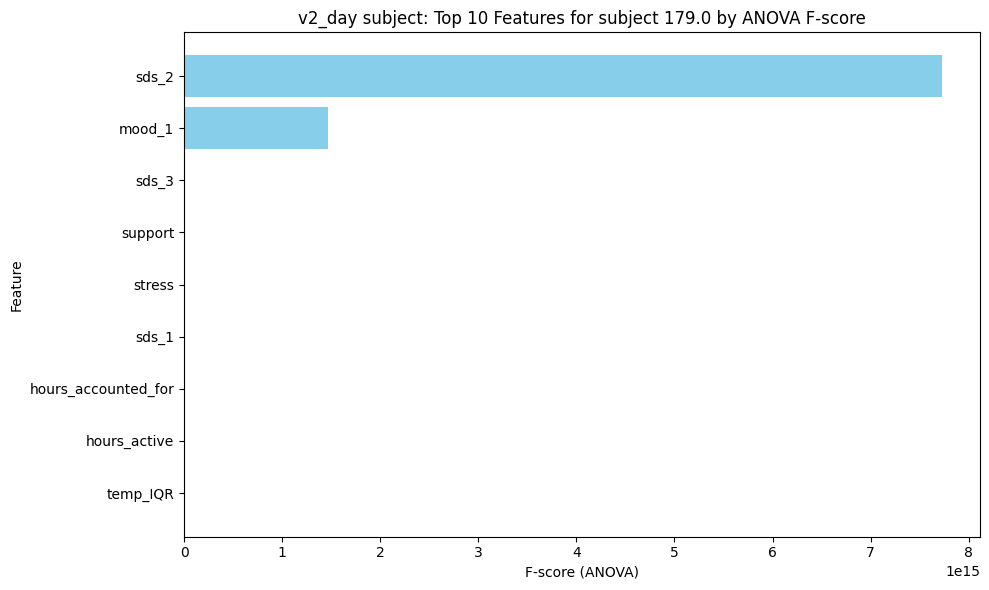

,hours_walking,distance_high_speed_transportation_hr,distance_active,distance_powered_vehicle_hr,distance_active_hr,hours_accounted_for,location_variance_hr,distance_walking,hours_high_speed_transportation_hr,hours_high_speed_transportation,...,pc_commute,pc_active_mobility,pc_cloud_cover_std,pc_weather_means,pc_temp_humidity_std,pc_dew_point,pc_dew_point_std,pc_temp,pc_phq2,phq9_sum
226,1.268579,-0.21834,0.232936,-0.731789,-0.796077,1.061862,0.390085,1.030673,-0.193123,-0.193354,...,-0.273218,0.038730,0.205390,1.397696,0.281757,-0.552649,0.654889,-0.642203,-0.878615,-0.080636
227,1.268579,-0.21834,0.232936,-0.731789,-0.796077,1.061862,0.390085,1.030673,-0.193123,-0.193354,...,-0.273218,0.038730,0.205390,1.397696,0.281757,-0.552649,0.654889,-0.642203,-0.878615,-0.890900
228,-1.096248,-0.21834,-1.692179,-0.731789,-0.796077,1.061862,0.390085,-1.320046,-0.193123,-0.193354,...,-0.273218,-2.043357,0.205390,1.397696,0.281757,-0.552649,0.654889,-0.642203,-0.878615,-0.890900
229,1.200779,-0.21834,0.223113,-1.004988,-0.473813,-0.015175,-0.484861,0.936324,-0.193123,-0.193354,...,-0.273218,-0.455446,-1.554261,-1.747915,0.793102,-0.308520,0.626820,1.858198,-1.121872,-0.890900
230,0.363929,-0.21834,-0.104172,-0.334605,-0.839995,-0.511139,-0.799764,0.576357,-0.193123,-0.193354,...,-0.273218,-0.475427,-1.605909,-1.913723,0.863386,-0.817846,0.480771,2.244904,-1.121872,NaN
231,1.236898,-0.21834,0.108787,-1.539844,-1.231520,1.500437,0.428334,1.009957,-0.193123,-0.193354,...,-0.273218,-1.023185,-1.502612,-1.659881,0.907060,-0.521245,0.600329,3.556060,-1.121872,NaN
232,1.534473,-0.21834,0.604481,-0.222870,-0.189564,0.701119,0.354487,1.151741,-0.193123,-0.193354,...,-0.273218,0.940962,2.010222,-0.479190,0.606952,-0.587893,0.934260,0.445237,-1.121872,NaN
233,1.787540,-0.21834,0.438163,-1.539844,-0.746236,1.408318,0.570006,1.434264,-0.193123,-0.193354,...,-0.273218,-0.331033,0.460289,-0.304485,0.755611,0.231606,1.082032,1.589096,-0.878615,NaN
234,1.405061,-0.21834,1.510986,-0.451604,0.826742,1.205508,0.793561,1.018042,-0.193123,-0.193354,...,-0.273218,1.468005,-1.450964,2.985061,0.682762,-0.730047,1.221011,-1.732155,-1.693495,NaN
235,1.224871,-0.21834,-0.451423,-1.539844,-1.942198,1.310240,0.277503,0.923077,-0.193123,-0.193354,...,-0.273218,-1.501857,0.357047,1.064374,0.664633,-0.810670,1.029814,0.858678,-1.121872,NaN


/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning:

divide by zero encountered in divide

/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning:

divide by zero encountered in divide

/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning:

divide by zero encountered in divide

/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning:

divide by zero encountered in divide

/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning:

divide by zero encountered in divide

/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning:

divide by zero encountered in divide

/Use

################ v1_week ###############


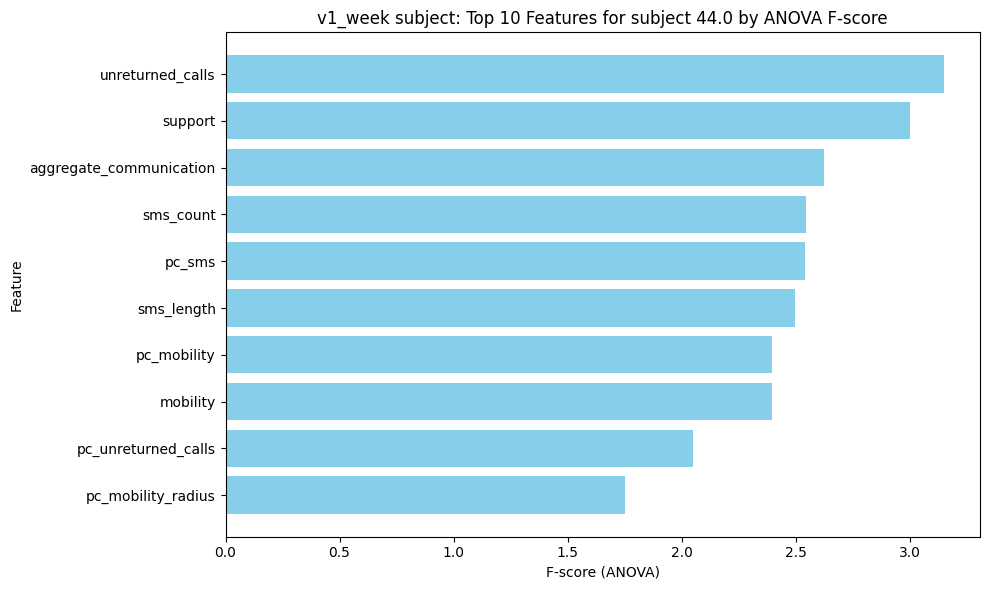

,mobility,mobility_radius,unreturned_calls,sms_count,aggregate_communication,call_duration,call_count,missed_interactions,sms_length,interaction_diversity,...,phq9_category,income_lastyear,mood_1,pc_unreturned_calls,pc_calls,pc_mobility,pc_phq2,pc_sms,pc_mobility_radius,phq9_sum
57,0.551075,0.381208,-0.554467,3.401455,3.274721,2.097851,-0.264965,-0.679656,2.378294,0.578815,...,med,6.0,0.455795,-0.869944,1.296175,0.581672,-0.727057,4.087164,0.434265,NaN
58,0.063117,0.134201,-0.172639,3.297247,3.198917,1.218430,-0.024679,-0.130723,2.049344,0.122970,...,med,6.0,0.176854,-0.210998,0.844230,0.093714,-1.391735,3.780874,0.187258,0.033188
59,0.611390,0.220911,-0.554467,0.737372,0.693291,-0.159548,-0.204893,-0.695339,0.420843,0.943492,...,med,6.0,0.455795,-0.881110,-0.257587,0.641987,-1.594004,0.819248,0.273968,-1.061403
60,0.220254,0.461048,-0.240020,-0.033675,-0.080184,0.645252,-0.436597,-0.413031,-0.209098,0.162042,...,med,6.0,0.455795,-0.459307,0.147660,0.250851,-1.369618,-0.171399,0.514105,NaN
61,-0.490380,0.057541,0.096887,3.384165,3.375945,3.628528,0.850646,0.904406,1.991841,0.669984,...,med,6.0,0.176854,0.715242,3.167386,-0.459784,-0.985479,3.801673,0.110598,-0.331676
62,-0.177188,0.148966,-0.037876,4.455219,4.340066,0.972365,0.129790,-0.224826,3.024241,0.357405,...,med,6.0,1.013677,-0.183363,0.779459,-0.146592,-1.187748,5.289040,0.202023,-0.331676
63,0.269992,0.191380,-0.397244,2.579473,2.490805,0.694496,-0.127659,-0.601237,1.512070,0.357405,...,med,6.0,0.455795,-0.703708,0.400932,0.300588,-1.500510,2.893421,0.244437,-0.878971
64,-0.369578,0.209388,-0.442165,2.893499,2.771326,0.377677,-0.359362,-0.318929,2.353476,0.318332,...,med,6.0,0.455795,-0.534259,0.013067,-0.338981,-1.161447,3.710437,0.262445,NaN
65,-0.367038,0.203575,-0.240020,1.690666,1.695542,1.288954,0.515963,-0.318929,0.886766,1.021637,...,med,6.0,0.455795,-0.392310,1.276386,-0.336441,-0.482386,1.822784,0.256632,-0.878971
66,0.101379,-0.045392,-0.554467,0.039224,-0.031161,-0.176756,-0.642556,-0.695339,-0.165805,0.122970,...,med,6.0,0.455795,-0.881110,-0.579227,0.131976,-1.594004,-0.089240,0.007665,NaN


/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning:

divide by zero encountered in divide



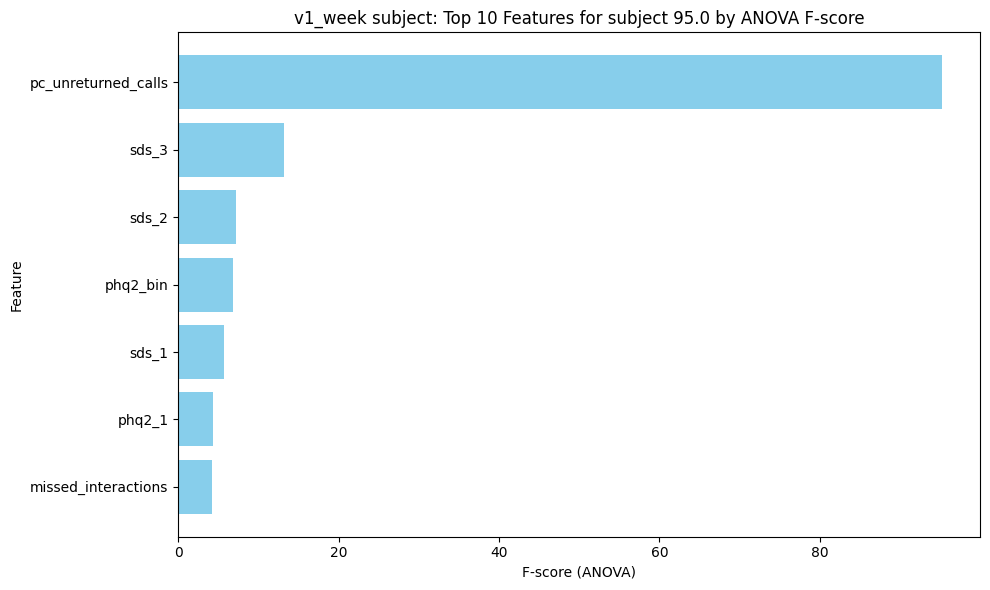

,mobility,mobility_radius,unreturned_calls,sms_count,aggregate_communication,call_duration,call_count,missed_interactions,sms_length,interaction_diversity,...,phq9_category,income_lastyear,mood_1,pc_unreturned_calls,pc_calls,pc_mobility,pc_phq2,pc_sms,pc_mobility_radius,phq9_sum
122,-0.099928,-0.096811,-0.172639,-0.243960,-0.229977,-0.250814,0.078300,-0.036621,-0.295081,0.005752,...,med-high,5.0,-0.938909,-0.144000,-0.121877,-0.069332,0.933494,-0.380892,-0.043754,NaN
123,-0.187587,2.786535,-0.307402,-0.106574,-0.055673,0.085595,0.464473,0.527996,-0.351439,0.357405,...,med-high,5.0,-1.496791,0.163353,0.389066,-0.156991,-1.560006,-0.323598,2.839592,0.580483
124,-1.606845,-1.957423,0.130578,-0.684158,-0.763784,-0.656210,-0.925750,-0.789442,-0.706210,-1.518074,...,med-high,5.0,-0.938909,-0.467058,-1.118501,-1.576248,0.611411,-0.982871,-1.904366,1.310210
125,-1.503008,-1.957013,0.130578,-0.684158,-0.763784,-0.656210,-0.925750,-0.789442,-0.706210,-1.518074,...,med-high,5.0,-0.938909,-0.467058,-1.118501,-1.472412,-0.823822,-0.982871,-1.903956,NaN
126,-1.653071,-1.960301,0.130578,-0.684158,-0.763784,-0.656210,-0.925750,-0.789442,-0.706210,-1.518074,...,med-high,5.0,-0.938909,-0.467058,-1.118501,-1.622474,-0.748519,-0.982871,-1.907244,NaN
127,-0.156984,0.091620,0.231650,-0.255176,-0.232701,-0.311351,0.155535,0.151585,-0.400452,0.279260,...,med-high,5.0,-0.659968,0.273893,-0.110070,-0.126387,-1.797992,-0.463332,0.144677,0.215620
128,-1.084114,-0.594692,-0.037876,-0.328075,-0.303512,-0.332631,0.155535,0.810304,-0.377572,0.435550,...,med-high,5.0,-0.659968,0.553612,-0.125118,-1.053518,-0.988917,-0.498700,-0.541635,-0.149244
129,-0.557780,-0.145417,-0.576928,-0.241157,-0.219083,0.157117,0.155535,-0.224826,-0.423152,0.122970,...,med-high,5.0,-0.938909,-0.561894,0.221190,-0.527183,0.801799,-0.469471,-0.092360,-0.331676
130,-0.333034,-0.188965,-0.442165,-0.173865,-0.082908,0.305693,0.824902,-0.130723,-0.360712,0.709057,...,med-high,5.0,-0.938909,-0.400263,0.799559,-0.302438,-1.797992,-0.377737,-0.135908,NaN
131,-0.465657,-0.822827,0.231650,-0.168258,-0.096525,0.856132,0.644687,1.186714,-0.218732,0.982564,...,med-high,5.0,-0.938909,1.010868,1.061352,-0.435060,-1.797992,-0.273376,-0.769770,-0.696540


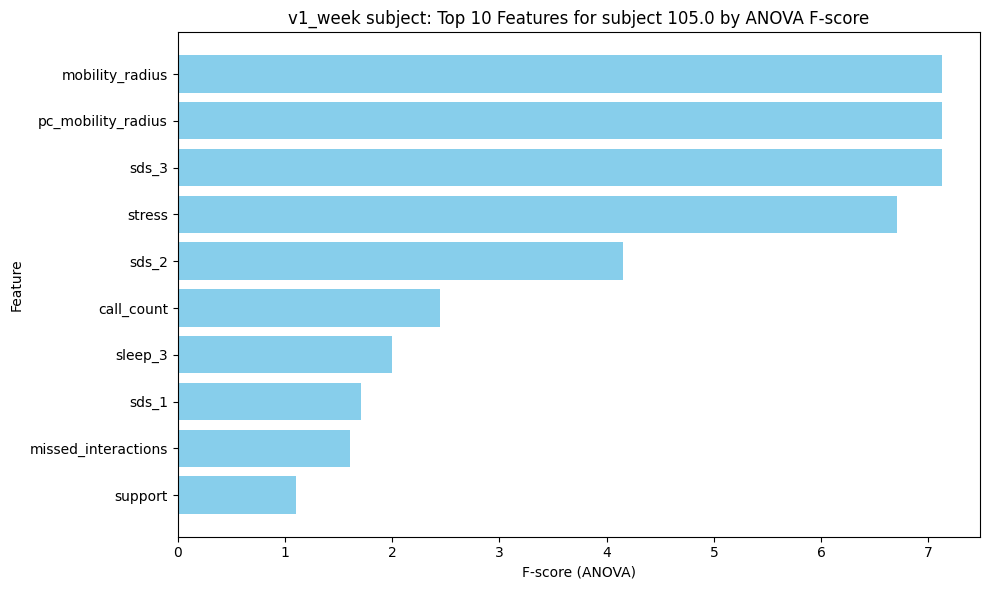

,mobility,mobility_radius,unreturned_calls,sms_count,aggregate_communication,call_duration,call_count,missed_interactions,sms_length,interaction_diversity,...,phq9_category,income_lastyear,mood_1,pc_unreturned_calls,pc_calls,pc_mobility,pc_phq2,pc_sms,pc_mobility_radius,phq9_sum
135,-1.328673,-0.723994,-0.145686,-0.402843,-0.423800,-0.293668,-0.295000,-0.460083,-0.170783,-0.013784,...,med-high,1.0,-0.938909,-0.426563,-0.416140,-1.298077,2.592440,-0.405346,-0.670936,NaN
136,-0.307458,-0.745975,-0.442165,-0.386955,-0.371599,0.059859,0.052555,-0.224826,-0.225957,0.513694,...,med-high,1.0,-1.496791,-0.467261,0.079600,-0.276862,1.829449,-0.433126,-0.692918,0.580483
137,1.219195,-0.269537,0.074427,-0.437423,-0.423346,-0.041394,0.026811,-0.318929,-0.441517,0.240187,...,med-high,1.0,-0.938909,-0.171500,-0.010201,1.249792,1.033769,-0.621237,-0.216480,NaN
138,1.588648,-1.658669,-0.397244,-0.521537,-0.494157,0.311378,0.129790,-0.601237,-0.434111,0.201115,...,med-high,1.0,-0.938909,-0.703708,0.312066,1.619244,0.331845,-0.675478,-1.605612,NaN
139,1.959519,2.366121,-0.397244,-0.316859,-0.259936,0.230176,0.464473,-0.413031,-0.201089,0.943492,...,med-high,1.0,-0.938909,-0.569712,0.491301,1.990115,0.328837,-0.365977,2.419179,-0.878971
140,0.268644,0.848861,-0.442165,-0.414993,-0.377046,0.397344,0.258514,-0.318929,-0.379619,0.709057,...,med-high,1.0,-0.659968,-0.534259,0.463874,0.299241,1.566228,-0.561608,0.901918,1.492642
141,0.471882,-1.736600,-0.711691,-0.342094,-0.319853,0.217731,0.129790,-0.695339,-0.245165,0.826274,...,med-high,1.0,-0.659968,-0.991515,0.245846,0.502479,2.092671,-0.414987,-1.683543,0.398051
142,2.130017,0.027745,-0.442165,-0.350505,-0.360705,-0.441105,-0.179148,-0.318929,-0.249621,0.083897,...,med-high,1.0,-0.938909,-0.534259,-0.438476,2.160614,0.750593,-0.424085,0.080802,0.580483
143,1.857275,-0.470970,1.309754,-0.187884,-0.150995,0.179473,0.310004,1.092612,0.106234,0.982564,...,med-high,1.0,-0.938909,1.700932,0.346223,1.887871,0.058095,-0.057467,-0.417913,NaN
144,2.295901,-1.748564,0.635939,-0.468265,-0.436964,0.247692,0.181280,0.339790,-0.463976,0.474622,...,med-high,1.0,-0.938909,0.691787,0.303441,2.326497,0.324625,-0.658927,-1.695507,0.580483


/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning:

divide by zero encountered in divide

/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning:

divide by zero encountered in divide

/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning:

divide by zero encountered in divide

/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning:

divide by zero encountered in divide

/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning:

divide by zero encountered in divide

/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning:

divide by zero encountered in divide

/Use

################ v2_week ###############


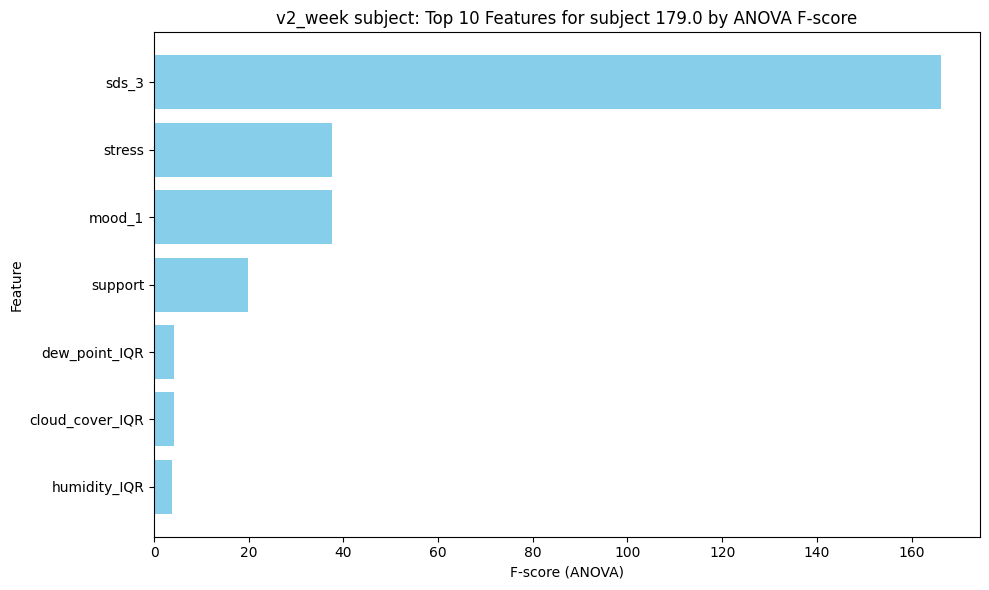

,hours_walking,distance_high_speed_transportation_hr,distance_active,distance_powered_vehicle_hr,distance_active_hr,hours_accounted_for,location_variance_hr,distance_walking,hours_high_speed_transportation_hr,hours_high_speed_transportation,...,pc_active_mobility,pc_commute,pc_temp_dew_point,pc_humidity_cloud_mean,pc_cloud_cover_std,pc_dew_point_std,pc_phq2,pc_temp_humidity_std,pc_precip,phq9_sum
40,1.368333,-0.462517,0.069669,-0.797074,-0.814423,1.302285,0.544743,1.326182,-0.2936,-0.326715,...,-0.006440,-0.63811,0.751528,1.415964,-1.063862,0.050760,-0.988418,-0.866725,1.006401,-0.044119
41,0.283931,-0.462517,-0.712951,-1.622639,-0.620550,0.037855,-0.457684,0.192689,-0.2936,-0.326715,...,-1.801084,-0.63811,1.135587,-2.251104,-0.623332,-3.046364,-1.313695,2.879688,-0.971556,-0.883731
42,1.627041,-0.462517,0.908705,-1.108781,-0.272835,1.789183,0.813779,1.657980,-0.2936,-0.326715,...,0.424661,-0.63811,0.940593,1.501142,-0.564756,1.533722,-0.609850,-2.033638,0.924725,NaN
43,1.860842,-0.462517,0.345556,-1.074844,-0.687921,1.732945,0.671649,2.055530,-0.2936,-0.326715,...,0.246094,-0.63811,0.061172,2.150184,-1.327523,-0.120983,-0.433889,-2.115217,1.639830,NaN
44,1.064271,-0.462517,0.024932,0.297587,-1.079457,1.718502,0.589498,0.944145,-0.2936,-0.326715,...,0.551009,-0.63811,-0.042544,3.083492,-1.484955,-1.113439,-0.821079,-2.979398,1.948387,NaN
45,1.436778,-0.462517,0.329572,-1.204359,-0.603311,1.373591,0.469582,1.296023,-0.2936,-0.326715,...,-0.285578,-0.63811,1.290758,0.176147,-1.088270,-0.178983,-1.454264,1.345983,0.422182,-0.883731
46,1.748591,-0.462517,0.292811,-0.481590,-0.717479,1.316730,0.794001,1.739205,-0.2936,-0.326715,...,0.827820,-0.63811,1.166072,0.313576,-0.749359,1.291877,-0.727367,0.664543,-0.917071,-0.715809
47,1.720281,-0.462517,-0.096475,-0.894968,-0.934169,0.995457,0.378827,1.733670,-0.2936,-0.326715,...,0.016073,-0.63811,0.778615,0.652366,-0.760452,1.246419,-0.988418,0.246102,-0.176918,NaN
48,1.046211,-0.462517,-0.538039,-1.474574,-1.413757,1.316730,0.374745,0.880826,-0.2936,-0.326715,...,-1.414705,-0.63811,0.887670,2.637113,-1.380604,-0.172630,-0.610017,-1.539936,1.662143,NaN
49,1.497641,-0.462517,0.125178,-0.972688,-0.815764,1.354879,0.683099,1.480808,-0.2936,-0.326715,...,0.040438,-0.63811,0.590077,1.868675,-1.264269,-1.486745,-1.079415,-1.431654,1.993706,-0.547886


/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning:

divide by zero encountered in divide



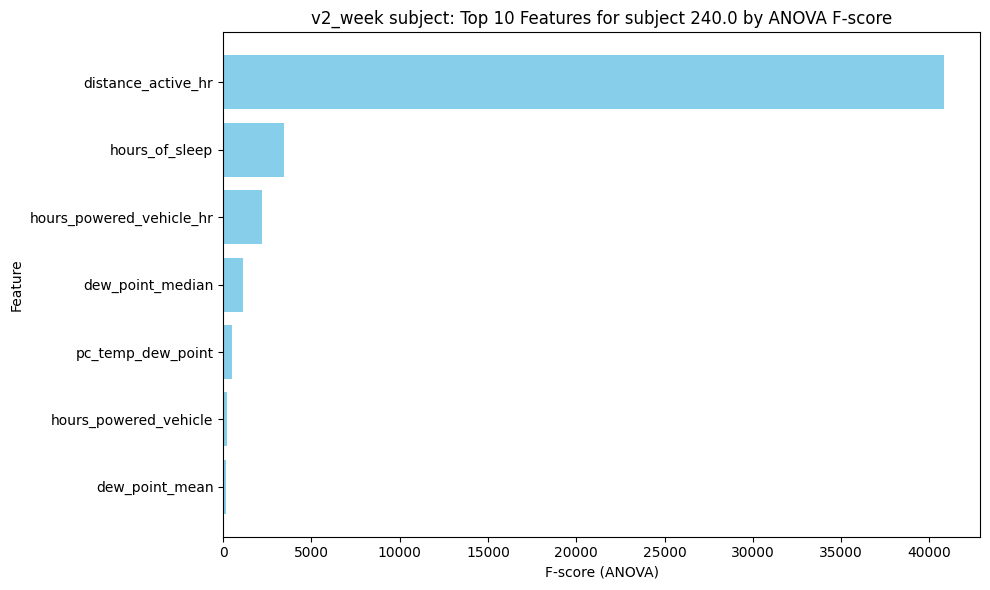

,hours_walking,distance_high_speed_transportation_hr,distance_active,distance_powered_vehicle_hr,distance_active_hr,hours_accounted_for,location_variance_hr,distance_walking,hours_high_speed_transportation_hr,hours_high_speed_transportation,...,pc_active_mobility,pc_commute,pc_temp_dew_point,pc_humidity_cloud_mean,pc_cloud_cover_std,pc_dew_point_std,pc_phq2,pc_temp_humidity_std,pc_precip,phq9_sum
183,0.224649,-0.225826,-0.807877,-1.670956,-1.750277,1.710907,0.317672,0.240743,-0.273204,-0.264024,...,-2.404737,-0.365555,0.946963,0.534929,0.268900,0.305831,0.188520,-0.214122,0.434226,NaN
184,0.224649,-0.225826,-0.807877,-1.670956,-1.750277,1.710907,0.317672,0.240743,-0.273204,-0.264024,...,-2.404737,-0.365555,0.946963,0.534929,0.268900,0.305831,0.188520,-0.214122,0.434226,NaN
185,0.099206,-0.462517,-1.133139,-1.764586,-2.151342,1.894803,0.217364,0.147893,-0.293600,-0.326715,...,-2.999426,-0.638110,-0.159372,-1.013508,0.400167,-0.699950,0.328360,0.105381,-0.917071,NaN
186,0.172728,-0.462517,-0.517954,-1.130428,-1.142746,0.979541,-0.155431,0.163300,-0.293600,-0.326715,...,-1.726453,-0.638110,-0.212591,-0.090143,1.847441,0.633034,-0.187643,-0.211370,-0.250437,-0.715809
187,-0.046519,-0.462517,-1.399024,-1.757957,-2.374669,1.944474,0.373416,0.081286,-0.293600,-0.326715,...,-3.093782,-0.638110,-0.709811,2.614574,-0.369722,-0.191525,0.445291,-2.347728,1.590395,NaN
188,1.000315,-0.462517,0.008932,-1.407392,-1.066452,1.761366,0.792137,0.906159,-0.293600,-0.326715,...,-0.860754,-0.720621,2.430755,-0.537794,0.113725,0.347422,0.374881,1.095592,-0.759961,0.123804
189,0.839751,-0.462517,-0.807427,-2.029004,-1.836996,1.856214,0.604336,0.727524,-0.293600,-0.326715,...,-2.358635,-0.730828,2.373371,0.389486,0.576774,1.443722,-0.258178,-0.246010,0.422182,NaN
190,0.205398,-0.462517,-0.750347,-1.642971,-1.760461,1.703900,0.296944,0.183430,-0.293600,-0.326715,...,-2.395032,-0.729388,1.479009,2.452586,-1.265887,-1.831696,-0.257969,-2.160552,1.672748,-0.547886
191,0.797159,-0.462517,-0.743693,-1.745763,-1.752846,1.789183,0.471026,0.760012,-0.293600,-0.326715,...,-2.059451,-0.729388,1.481772,-0.051423,0.891897,1.494993,0.234815,0.583426,0.699181,-0.379964
192,0.464625,-0.462517,-0.681448,-2.029004,-1.763666,1.968581,0.456472,0.397787,-0.293600,-0.326715,...,-2.692829,-0.720621,1.539033,0.767466,0.128708,0.606358,-0.082154,0.696519,1.029767,-0.547886


/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning:

divide by zero encountered in divide



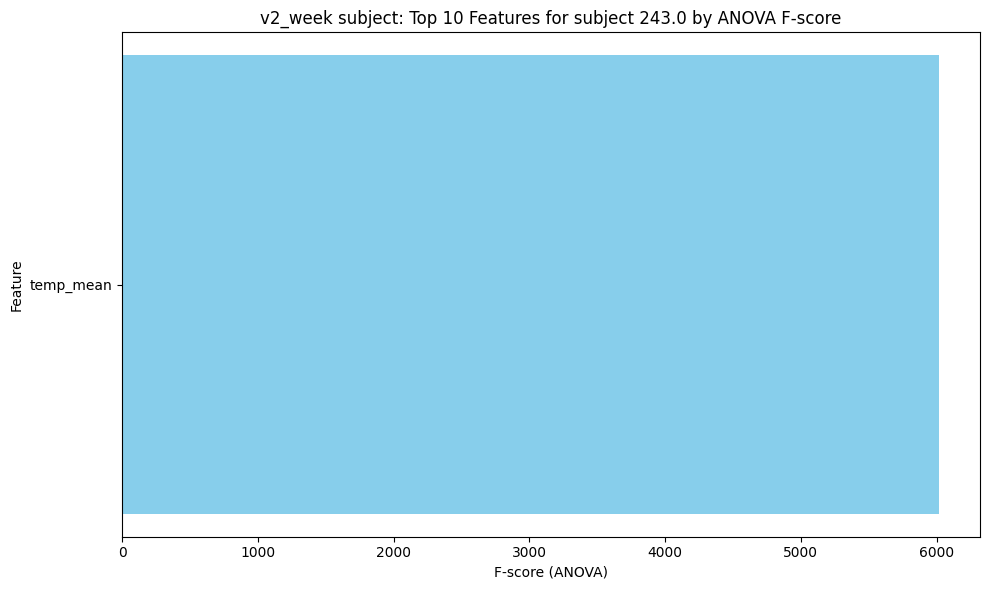

,hours_walking,distance_high_speed_transportation_hr,distance_active,distance_powered_vehicle_hr,distance_active_hr,hours_accounted_for,location_variance_hr,distance_walking,hours_high_speed_transportation_hr,hours_high_speed_transportation,...,pc_active_mobility,pc_commute,pc_temp_dew_point,pc_humidity_cloud_mean,pc_cloud_cover_std,pc_dew_point_std,pc_phq2,pc_temp_humidity_std,pc_precip,phq9_sum
209,-0.030482,-0.462517,-0.526796,-1.107455,-1.611535,1.971636,0.724776,-0.058517,-0.2936,-0.326715,...,-1.708630,-0.63811,1.629319,0.361390,0.139669,0.208316,0.827142,2.256705,0.009386,0.459649
210,-0.030482,-0.462517,-0.526796,-1.107455,-1.611535,1.971636,0.724776,-0.058517,-0.2936,-0.326715,...,-1.708630,-0.63811,1.629319,0.361390,0.139669,0.208316,0.827142,2.256705,0.009386,NaN
211,0.088048,-0.462517,-0.929029,-0.845288,-1.996772,1.992224,0.875650,0.017597,-0.2936,-0.326715,...,-1.568229,-0.63811,1.315824,0.422850,-0.399240,0.106867,1.641502,2.248219,-0.971556,NaN
212,-0.599964,-0.462517,-0.735035,-1.441886,-1.827186,1.992224,0.603546,-0.343995,-0.2936,-0.326715,...,-2.421393,-0.63811,0.892356,0.207279,1.003036,-0.108441,-1.171873,1.262680,1.341417,NaN
213,-0.065350,-0.462517,-0.134761,-0.594280,-1.304068,1.992224,0.876606,-0.168936,-0.2936,-0.326715,...,-0.923039,-0.63811,0.536443,-0.138660,1.558581,-0.043526,-1.547140,3.581913,-0.971556,-0.883731
214,-0.030482,-0.462517,-0.526796,-1.107455,-1.611535,1.971636,0.724776,-0.058517,-0.2936,-0.326715,...,-1.708630,-0.63811,1.629319,0.361390,0.139669,0.208316,0.827142,2.256705,0.009386,0.963416
215,-0.735555,-0.462517,-1.536528,-2.029004,-2.247743,1.907407,0.599885,-0.684367,-0.2936,-0.326715,...,-3.688687,-0.63811,1.700963,-2.149021,2.376401,-3.145648,0.827142,5.554558,-0.971556,1.970951
216,-0.338132,-0.462517,-0.669081,-1.252809,-1.713222,1.894803,0.528948,-0.326868,-0.2936,-0.326715,...,-2.204378,-0.63811,2.094367,-1.394264,-0.906282,2.153786,1.500181,4.380710,-0.971556,-0.212041
217,0.533897,-0.462517,0.155807,-1.477125,-1.051828,1.992224,0.606746,0.507348,-0.2936,-0.326715,...,-1.383086,-0.63811,2.576318,1.490873,-0.624563,1.673001,2.626233,1.352111,1.881051,-0.212041
218,0.309055,-0.462517,0.173642,-1.034769,-1.036366,1.992224,0.874128,0.161208,-0.2936,-0.326715,...,-0.925380,-0.63811,2.408071,-0.702143,-1.110885,-0.966341,1.400312,4.219423,-0.971556,-0.044119


/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning:

divide by zero encountered in divide

/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:108: RuntimeWarning:

invalid value encountered in divide

/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning:

divide by zero encountered in divide

/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning:

divide by zero encountered in divide

/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning:

divide by zero encountered in divide

/Users/klj9278/miniconda3/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning:

divide by zero encountered in divide

/User

Adding to v1_day for phq9_sum: ['support', 'sds_3', 'sds_2', 'stress', 'sds_1', 'mood_1', 'sleep_1', 'sleep_3', 'sleep_2', 'pc_phq2', 'phq2_sum', 'phq2_1', 'interaction_diversity', 'mobility', 'phq2_2']


Adding to v2_day for phq9_sum: ['support', 'mood_1', 'pc_temp_humidity_std', 'sds_3', 'sds_2', 'sds_1', 'stress', 'temp_mean', 'temp_median', 'dew_point_mean', 'pc_dew_point_std', 'dew_point_median', 'humidity_mean', 'sleep_1', 'humidity_median']


Adding to v1_week for phq9_sum: ['sds_2', 'sds_1', 'sds_3', 'support', 'missed_interactions', 'phq2_1', 'call_count', 'stress', 'call_duration', 'phq2_bin', 'pc_calls', 'mobility', 'sleep_3', 'unreturned_calls', 'pc_sms']


Adding to v2_week for phq9_sum: ['sds_3', 'stress', 'sds_2', 'support', 'dew_point_IQR', 'sds_1', 'pc_phq2', 'phq2_sum', 'distance_active_hr', 'distance_powered_vehicle', 'temp_std', 'cloud_cover_mean', 'pc_humidity_cloud_mean', 'mood_1', 'hours_powered_vehicle']


In [6]:
## Anova for feature analysis
print('Run on:', dt.datetime.today().strftime('%a %d %b %Y, %I:%M%p'))

from sklearn.feature_selection import SelectKBest, f_classif, VarianceThreshold
import pandas as pd
from collections import Counter

# ---- EDIT PARAMS ------
n_features = 10 # Choose number of features/scores to save from the ANOVA
n_subjects_show = 3 # Choose number of subjects' ANOVA scores to see in graphs
n_features_show = 10 # Choose number of features to see in graphs
show_means = True # Choose whether to visualize mean scores for features across all subjects
# --------------------

anova_features = {}
top_features = {}
	
for y_col in ['phq2_sum','phq9_sum']:
	anova_features[y_col] = {}
	top_features[y_col]={}

	for name in ['v1_day','v2_day','v1_week','v2_week']:
		subjects_shown_count=0
		top_features[y_col][name] = {}
		print(f'################ {name} ###############')
		df = pd.read_csv(os.path.join(brighten_dir, f'{name}_trainval_pca.csv'))
		for sub, sub_df in df.groupby('num_id'):
			
			sub_df_anova = sub_df.drop(columns=[col for col in sub_df.columns if 'Unnamed' in col or '_nan' in col or '_indicator' in col or col in ['day','week','month']+id_columns])
			sub_df_anova = sub_df_anova.drop(columns=[col for col in sub_df_anova.columns if any(item in col for item in baseline_cols) or 'season' in col or 'cohort' in col or 'dt' in col or 'user_phone_type' in col or 'base' in col])
			sub_df_anova = sub_df_anova.drop(columns=[col for col in sub_df_anova.columns if col in id_columns])


			df_cov = sub_df_anova.loc[:, sub_df_anova.notna().mean() > 0.7]
			df_cov = df_cov.copy()
			if y_col not in df_cov.columns:
				df_cov[y_col] = sub_df_anova[y_col].copy()
			#print(f'Not including these columns in X, not enough coverage: ', [col for col in sub_df_anova.columns if col not in df_cov.columns])
			df_full = df_cov.dropna()
			#print(f'Shape before dropna: {df_cov.shape}, shape afer dropna: {df_full.shape}')
			min_rows = 6 if 'week' in name else 15
			if len(df_full) <= min_rows:
				continue # skip small samples

			# Separate X and y
			selector = SelectKBest(score_func=f_classif, k=2)
			if 'phq2' in y_col:
				X = df_full.drop(columns=[col for col in df_full.columns if 'phq' in col])
			if 'phq9' in y_col:
				X = df_full.drop(columns=[col for col in df_full.columns if 'phq9' in col])
			X_num = X.select_dtypes(include=('int64','float64'))
			# print(f'Not including these columns in X, not numeric: ', [col for col in X.columns if col not in X_num.columns])
			
			y = df_full[y_col].copy()
			if y.nunique() < 2 or y.var() == 0:
				print(f'Warning: 0 variance in y for sub {sub}, y = {y.unique()}')
				continue
			if y.std() < 0.1:
				print(f'Warning: low variance in y for sub {sub}, std={y.std():.3f}, y = {y.unique()}')
				continue



			# --- Drop constant (zero-variance) features ---
			var_selector = VarianceThreshold(threshold=1e-10)
			X_var = pd.DataFrame(
				var_selector.fit_transform(X_num),
				columns=X_num.columns[var_selector.get_support()],
				index=X_num.index
			)

			if X_var.shape[1] < 2:
				continue

			X_new = selector.fit_transform(X_var, y)

			# Show scores
			anova_scores = pd.DataFrame({
				'feature': X_var.columns,
				'f_score': selector.scores_,
				'p_value': selector.pvalues_
			}).sort_values('f_score', ascending=False)

			#print(anova_scores)
			
			# --- Save Features --- 
			top_n = 10  # number of top features to save
			top_features_sub = anova_scores.head(top_n)
			top_features[y_col][name][sub] = top_features_sub['feature'].to_list()

			# --- Visualize Scores for Subjects ---
			if subjects_shown_count<n_subjects_show:
				plt.figure(figsize=(10, 6))
				plt.barh(top_features_sub['feature'], top_features_sub['f_score'], color='skyblue')
				plt.xlabel('F-score (ANOVA)')
				plt.ylabel('Feature')
				plt.title(f'{name} subject: Top {top_n} Features for subject {sub} by ANOVA F-score')
				plt.gca().invert_yaxis()  # highest on top
				plt.tight_layout()
				plt.show()

				display(df_cov.head(10))
				subjects_shown_count+=1

	# --- Summarize across subjects ---
	for name in top_features[y_col].keys():
		all_feats = [feat for sublist in top_features[y_col][name].values() for feat in sublist]
		counts = Counter(all_feats)
		top_common = pd.DataFrame(counts.most_common(15), columns=['feature', 'count'])
		
		# --- Visualize Mean Scores Across Subjects ---
		if show_means:
			fig = px.bar(top_common, x='feature', y='count', title=f'Top 15 sig. features to {y_col}  for {name}')
			fig.show()

		print(f'Adding to {name} for {y_col}: {top_common['feature'].to_list()}')
		anova_features[y_col][name] = top_common['feature'].to_list()
	


In [71]:
print(len(top_features['phq2_sum']['v1_day'].keys()))
print(len(top_features['phq9_sum']['v1_day'].keys()))

print(len(top_features['phq2_sum']['v2_day'].keys()))
print(len(top_features['phq9_sum']['v2_day'].keys()))

print(len(top_features['phq2_sum']['v1_week'].keys()))
print(len(top_features['phq9_sum']['v1_week'].keys()))

print(len(top_features['phq2_sum']['v2_week'].keys()))
print(len(top_features['phq9_sum']['v2_week'].keys()))


161
145
150
84
140
47
124
20


my pipeline: 
1. remove outliers
4. apply log transform to skewed or wide-tailed data
5. remove too-skewed data
6. Impute
7. Scale
8. Drop columns with too few unique values or too little variance

# Trying to predict each person based on all features, predicting PHQ2 score

v1_day
Length of DF originally: 13944 
And after dropping NA target columns: 13944
Training sample size: 10998
Test sample size: 2946
Number of features: 57


,feature,importance_mean,importance_std
18,sds_2,0.196033,0.007908
16,sds_3,0.047363,0.003308
20,cohort_Akili,0.014306,0.002396
10,sleep_1,0.012143,0.001652
52,bin_clin,0.010732,0.003961
4,aggregate_communication,0.008096,0.002567
27,marital_status_2.0,0.006569,0.000569
9,interaction_diversity,0.006535,0.003012


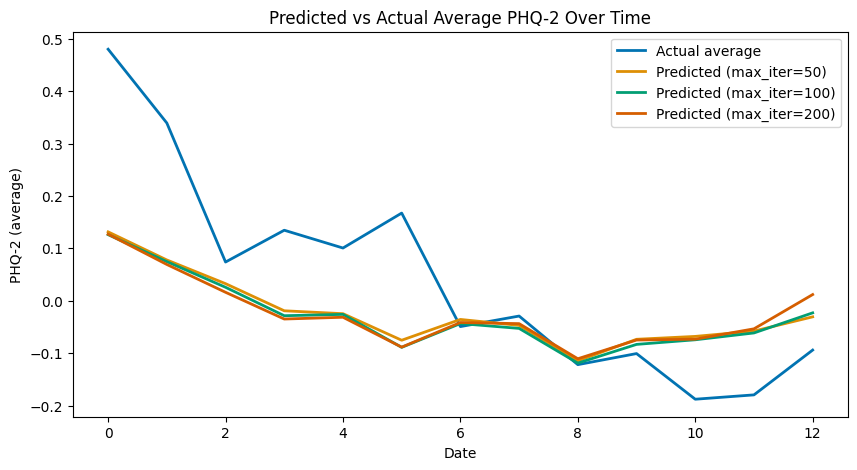

Using features: ['mobility', 'mobility_radius', 'unreturned_calls', 'sms_count', 'aggregate_communication', 'call_duration', 'call_count', 'missed_interactions', 'sms_length', 'interaction_diversity', 'sleep_1', 'sds_1', 'stress', 'education', 'sleep_3', 'support', 'sds_3', 'income_satisfaction', 'sds_2', 'sleep_2', 'cohort_Akili', 'cohort_Health tips', 'cohort_PST', 'gender_0.0', 'gender_1.0', 'marital_status_0.0', 'marital_status_1.0', 'marital_status_2.0', 'race_0.0', 'race_1.0', 'race_2.0', 'race_3.0', 'race_4.0', 'race_5.0', 'race_6.0', 'season_fall', 'season_spring', 'season_summer', 'season_winter', 'season_num_1.0', 'season_num_2.0', 'season_num_3.0', 'season_num_4.0', 'dt_phone_v2', 'dt_weather_v2', 'hours_stationary', 'hours_stationary_nhw', 'dt_mobility_v2', 'screen_1', 'screen_2', 'screen_3', 'screen_4', 'bin_clin', 'working', 'income_lastyear', 'age_category', 'mood_1']
v2_day
Length of DF originally: 10297 
And after dropping NA target columns: 10101
Training sample size:

,feature,importance_mean,importance_std
75,sds_1,0.149771,0.008867
81,sds_2,0.115066,0.005395
74,sleep_1,0.042678,0.012855
38,education,0.025045,0.002042
78,sleep_3,0.017719,0.006392
77,mood_1,0.017675,0.003231
33,humidity_mean,0.008169,0.001295
7,distance_walking,0.007127,0.001634


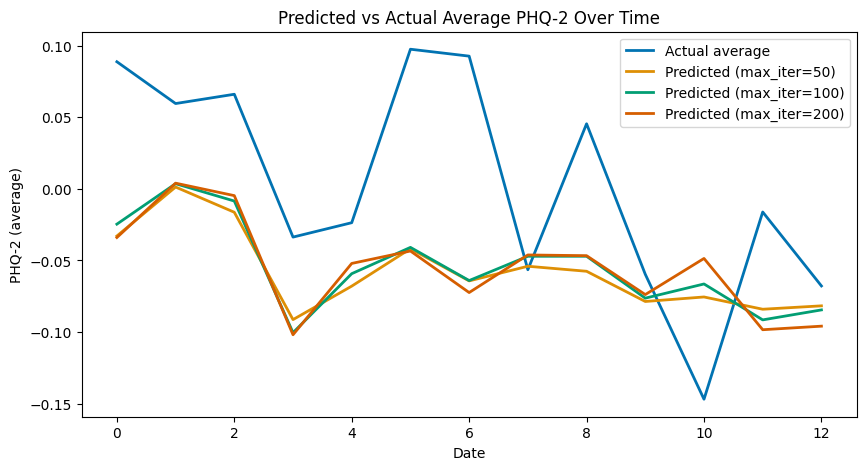

Using features: ['hours_walking', 'distance_high_speed_transportation_hr', 'distance_active', 'distance_powered_vehicle_hr', 'distance_active_hr', 'hours_accounted_for', 'location_variance_hr', 'distance_walking', 'hours_high_speed_transportation_hr', 'hours_high_speed_transportation', 'came_to_work', 'distance_powered_vehicle', 'location_variance', 'hours_active_hr', 'hours_powered_vehicle_hr', 'distance_walking_hr', 'precip_sum', 'distance_high_speed_transportation', 'hours_powered_vehicle', 'hours_active', 'hours_of_sleep_hr', 'humidity_median', 'dew_point_median', 'cloud_cover_mean', 'hours_of_sleep', 'cloud_cover_median', 'humidity_IQR', 'humidity_std', 'dew_point_IQR', 'cloud_cover_std', 'cloud_cover_IQR', 'dew_point_std', 'temp_mean', 'humidity_mean', 'temp_IQR', 'dew_point_mean', 'temp_median', 'temp_std', 'education', 'income_satisfaction', 'hours_of_sleep_hr.1', 'gender_0.0', 'gender_1.0', 'marital_status_0.0', 'marital_status_1.0', 'marital_status_2.0', 'race_0.0', 'race_1.0

,feature,importance_mean,importance_std
18,sds_2,0.218854,0.024077
11,sds_1,0.068834,0.015205
16,sds_3,0.039463,0.008715
10,sleep_1,0.037004,0.012634
12,stress,0.024234,0.004875
3,sms_count,0.016083,0.005097
9,interaction_diversity,0.015915,0.006272
70,mood_1,0.015044,0.010898


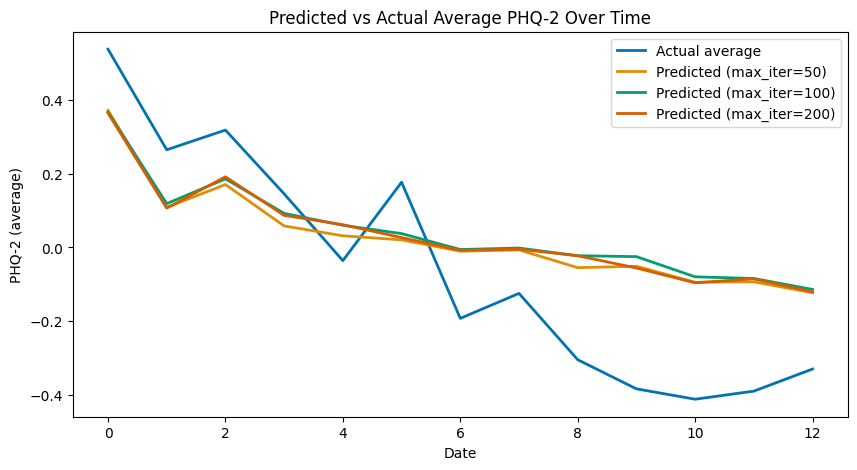

Using features: ['mobility', 'mobility_radius', 'unreturned_calls', 'sms_count', 'aggregate_communication', 'call_duration', 'call_count', 'missed_interactions', 'sms_length', 'interaction_diversity', 'sleep_1', 'sds_1', 'stress', 'education', 'sleep_3', 'support', 'sds_3', 'income_satisfaction', 'sds_2', 'sleep_2', 'cohort_Akili', 'cohort_Health tips', 'cohort_PST', 'gender_0.0', 'gender_1.0', 'marital_status_0.0', 'marital_status_1.0', 'marital_status_2.0', 'race_0.0', 'race_1.0', 'race_2.0', 'race_3.0', 'race_4.0', 'race_5.0', 'race_6.0', 'season_fall', 'season_spring', 'season_summer', 'season_winter', 'season_num_1.0', 'season_num_1.1428571428571428', 'season_num_1.2857142857142858', 'season_num_1.4285714285714286', 'season_num_1.5714285714285714', 'season_num_1.7142857142857142', 'season_num_1.8571428571428572', 'season_num_2.0', 'season_num_2.1666666666666665', 'season_num_2.2857142857142856', 'season_num_2.4285714285714284', 'season_num_2.5714285714285716', 'season_num_2.714285

,feature,importance_mean,importance_std
95,stress,0.059896,0.015354
94,sds_1,0.041178,0.010777
97,sleep_3,0.040547,0.007307
93,sleep_1,0.039713,0.009300
100,sds_2,0.031506,0.012023
31,dew_point_std,0.013058,0.003443
96,mood_1,0.012859,0.008643
38,education,0.012089,0.007828


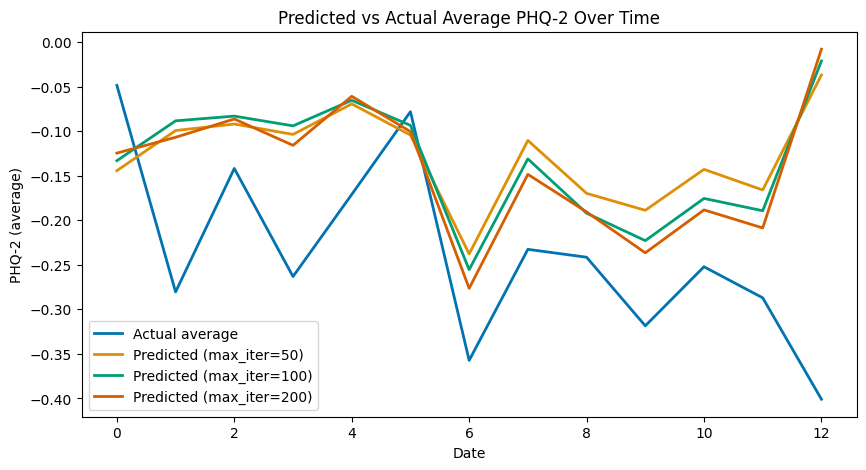

Using features: ['hours_walking', 'distance_high_speed_transportation_hr', 'distance_active', 'distance_powered_vehicle_hr', 'distance_active_hr', 'hours_accounted_for', 'location_variance_hr', 'distance_walking', 'hours_high_speed_transportation_hr', 'hours_high_speed_transportation', 'came_to_work', 'distance_powered_vehicle', 'location_variance', 'hours_active_hr', 'hours_powered_vehicle_hr', 'distance_walking_hr', 'precip_sum', 'distance_high_speed_transportation', 'hours_powered_vehicle', 'hours_active', 'hours_of_sleep_hr', 'humidity_median', 'dew_point_median', 'cloud_cover_mean', 'hours_of_sleep', 'cloud_cover_median', 'humidity_IQR', 'humidity_std', 'dew_point_IQR', 'cloud_cover_std', 'cloud_cover_IQR', 'dew_point_std', 'temp_mean', 'humidity_mean', 'temp_IQR', 'dew_point_mean', 'temp_median', 'temp_std', 'education', 'income_satisfaction', 'hours_of_sleep_hr.1', 'gender_0.0', 'gender_1.0', 'marital_status_0.0', 'marital_status_1.0', 'marital_status_2.0', 'race_0.0', 'race_1.0

In [72]:
from sklearn.model_selection import GroupShuffleSplit
from sklearn.inspection import permutation_importance
import seaborn as sns

max_iter_list = [50, 100, 200]
colors = sns.color_palette("colorblind")
target = 'phq2_sum'

for name in ['v1_day','v2_day','v1_week','v2_week']:
	print(name)
	df=pd.read_csv(os.path.join(brighten_dir, f'{name}_trainval_imputed.csv'))
	clean_df = df.dropna(subset=target)
	X = clean_df.drop(columns=[col for col in clean_df.columns if 'phq' in col or col in id_columns or 'Unnamed' in col])
	X = X.select_dtypes(include=('int64', 'float64'))
	y = clean_df[target]
	print(f'Length of DF originally: {len(df)} \nAnd after dropping NA target columns: {len(clean_df)}')
	
	
	splitter = GroupShuffleSplit(test_size=0.2, n_splits=1, random_state=42)
	train_idx, test_idx = next(splitter.split(X, y, groups=clean_df['num_id']))

	X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
	y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]


	print(f"Training sample size: {X_train.shape[0]}")
	print(f"Test sample size: {X_test.shape[0]}")
	print(f"Number of features: {X_train.shape[1]}")

	fig, ax = plt.subplots(figsize=(10, 5))

	# baseline (actual average PHQ2)
	df_actual = df.loc[X_test.index].copy()
	avg_actual = df_actual.groupby("week")[target].mean()
	avg_actual.plot(color=colors[0], label="Actual average", linewidth=2, ax=ax)

	for idx, max_iter in enumerate(max_iter_list):
		hgbt = HistGradientBoostingRegressor(max_iter=max_iter, random_state=42)
		hgbt.fit(X_train, y_train)
		y_pred = hgbt.predict(X_test)

		df_pred = df.loc[X_test.index].copy()
		df_pred["y_pred"] = y_pred

		avg_pred = df_pred.groupby("week")["y_pred"].mean()
		avg_pred.plot(
			color=colors[idx + 1],
			label=f"Predicted (max_iter={max_iter})",
			linewidth=2,
			ax=ax,
		)

		if max_iter == max(max_iter_list):
			result = permutation_importance(
				hgbt, X_test, y_test, 
				n_repeats=10, 
				random_state=42,
				n_jobs=-1
			)
			feat_importance_df = pd.DataFrame({
				'feature': X_test.columns,
				'importance_mean': result.importances_mean,
				'importance_std': result.importances_std
			}).sort_values('importance_mean', ascending=False)

			save_path = os.path.join(brighten_dir, f'{name}_feature_importances_maxIter{max_iter}.csv')
			feat_importance_df.to_csv(save_path, index=False)
			display(feat_importance_df.head(8))


	ax.set(
		title="Predicted vs Actual Average PHQ-2 Over Time",
		xlabel="Date",
		ylabel="PHQ-2 (average)",
	)
	ax.legend()
	plt.show()
	print(f'Using features: {X.columns.to_list()}')


# Trying only using only strongly correlated features

v1_day
Length of DF originally: 11036 
And after dropping NA target columns: 11036
Training sample size: 8732
Test sample size: 2304
Number of features: 15


,feature,importance_mean,importance_std
5,bin_clin,0.117482,0.011534
1,sds_2,0.040153,0.005950
9,day,0.020321,0.008487
2,sds_3,0.020131,0.003319
0,num_id,0.012978,0.008711
8,screen_3,0.005263,0.002206


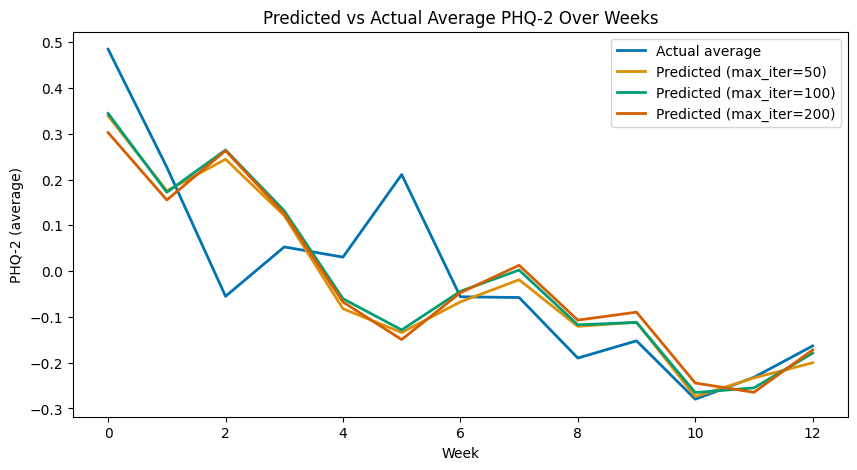

v2_day
Length of DF originally: 4843 
And after dropping NA target columns: 4843
Training sample size: 3998
Test sample size: 845
Number of features: 16


,feature,importance_mean,importance_std
13,day,0.031230,0.017733
1,sds_2,0.021974,0.007717
3,sds_1,0.017352,0.010027
15,race_6.0,0.013219,0.007465
4,sleep_1,0.009660,0.005278
0,num_id,0.001249,0.025079


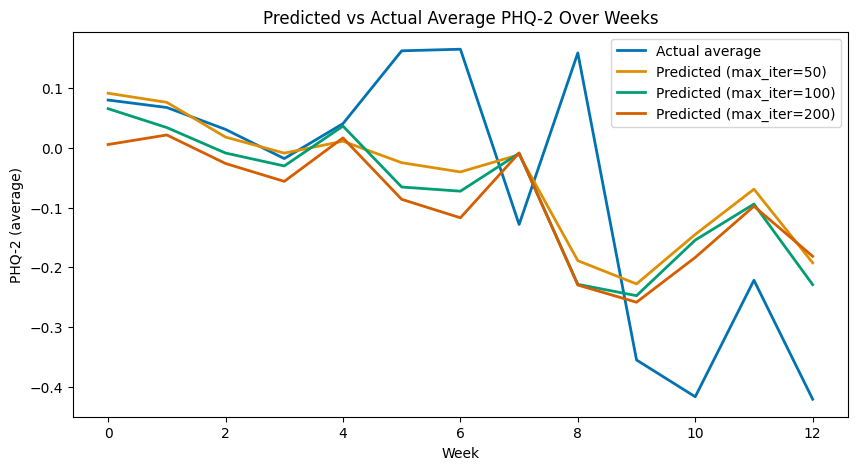

v1_week
Length of DF originally: 1994 
And after dropping NA target columns: 1994
Training sample size: 1595
Test sample size: 399
Number of features: 20


,feature,importance_mean,importance_std
5,bin_clin,0.166453,0.021919
10,day,0.083846,0.017317
1,sds_2,0.058961,0.013462
4,stress,0.046917,0.011535
18,interaction_diversity,0.042479,0.028991
9,screen_2,0.041166,0.005684


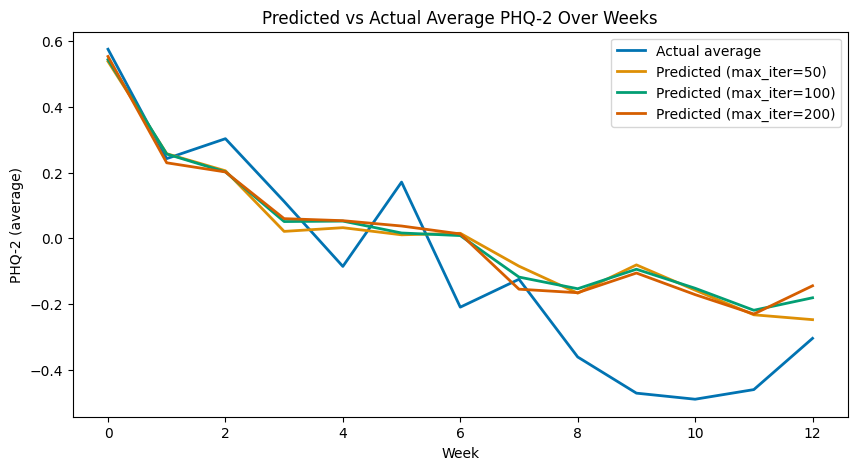

v2_week
Length of DF originally: 1351 
And after dropping NA target columns: 1351
Training sample size: 1070
Test sample size: 281
Number of features: 14


,feature,importance_mean,importance_std
11,month,0.044100,0.040096
8,marital_status_0.0,0.043815,0.013391
4,stress,0.040890,0.010448
7,screen_4,0.024433,0.014787
3,sds_1,0.014615,0.020489
2,sds_3,0.014156,0.016337


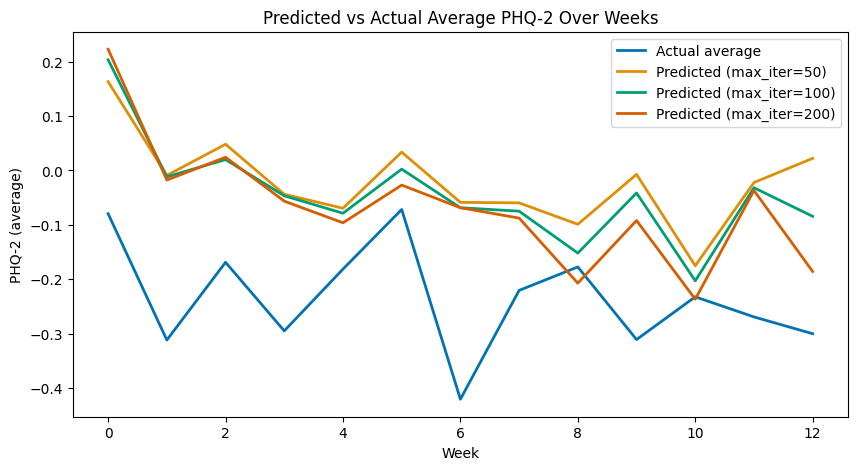

In [73]:
max_iter_list = [50, 100, 200]
colors = sns.color_palette("colorblind")

strong_corrs = {}
y_col = 'phq2_sum'
similar_y_col = 'phq'
for name in ['v1_day','v2_day','v1_week','v2_week']:
	print(name)
	df=pd.read_csv(os.path.join(brighten_dir, f'{name}_trainval_transformed.csv'))
	df = df.dropna(subset=y_col)
	corr_df = df.corr(numeric_only=True)[y_col].abs().sort_values(ascending=False)
	corr_df = pd.DataFrame(corr_df).reset_index(names=['column'])
	corr_df[y_col] = pd.to_numeric(corr_df[y_col])
	strong_corr = corr_df.where(corr_df[y_col] > 0.1).dropna(how='all')
	strong_corrs[name] = strong_corr['column'].to_list()
	X_cols = [col for col in strong_corrs[name] if similar_y_col not in col and 'Unnamed' not in col]
	X = df[['num_id']+X_cols]
	y = df[y_col]
	print(f'Length of DF originally: {len(df)} \nAnd after dropping NA target columns: {len(df)}')
	
	
	splitter = GroupShuffleSplit(test_size=0.2, n_splits=1, random_state=42)
	train_idx, test_idx = next(splitter.split(X, y, groups=df['num_id']))

	X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
	y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]


	print(f"Training sample size: {X_train.shape[0]}")
	print(f"Test sample size: {X_test.shape[0]}")
	print(f"Number of features: {X_train.shape[1]}")

	fig, ax = plt.subplots(figsize=(10, 5))

	# baseline (actual average PHQ2)
	df_actual = df.loc[X_test.index].copy()
	avg_actual = df_actual.groupby("week")[y_col].mean()
	avg_actual.plot(color=colors[0], label="Actual average", linewidth=2, ax=ax)

	for idx, max_iter in enumerate(max_iter_list):
		hgbt = HistGradientBoostingRegressor(max_iter=max_iter, random_state=42)
		hgbt.fit(X_train, y_train)
		y_pred = hgbt.predict(X_test)

		df_pred = df.loc[X_test.index].copy()
		df_pred["y_pred"] = y_pred

		avg_pred = df_pred.groupby("week")["y_pred"].mean()
		avg_pred.plot(
			color=colors[idx + 1],
			label=f"Predicted (max_iter={max_iter})",
			linewidth=2,
			ax=ax,
		)

		
		if max_iter == max(max_iter_list):
			result = permutation_importance(
				hgbt, X_test, y_test, 
				n_repeats=10, 
				random_state=42,
				n_jobs=-1
			)
			feat_importance_df = pd.DataFrame({
				'feature': X_test.columns,
				'importance_mean': result.importances_mean,
				'importance_std': result.importances_std
			}).sort_values('importance_mean', ascending=False)

			save_path = os.path.join(brighten_dir, f'{name}_feature_importances_maxIter{max_iter}.csv')
			feat_importance_df.to_csv(save_path, index=False)
			display(feat_importance_df.head(6))




	ax.set(
		title="Predicted vs Actual Average PHQ-2 Over Weeks",
		xlabel="Week",
		ylabel="PHQ-2 (average)",
	)
	ax.legend()
	plt.show()

# Try doing by-subject with top correlated columns

For 13.0, X-cols: ['sleep_2', 'sleep_1', 'sds_3', 'season_fall', 'season_num_1.0', 'season_num_4.0', 'season_summer', 'mobility_radius', 'sms_length', 'stress']


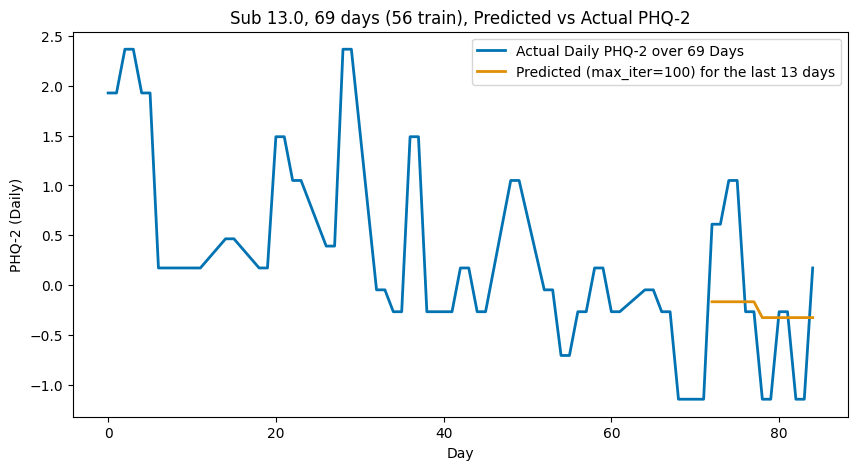

For 14.0, X-cols: ['sds_2', 'sds_3', 'sleep_2', 'mobility', 'stress', 'sds_1', 'mood_1', 'cohort_PST', 'mobility_radius', 'interaction_diversity']


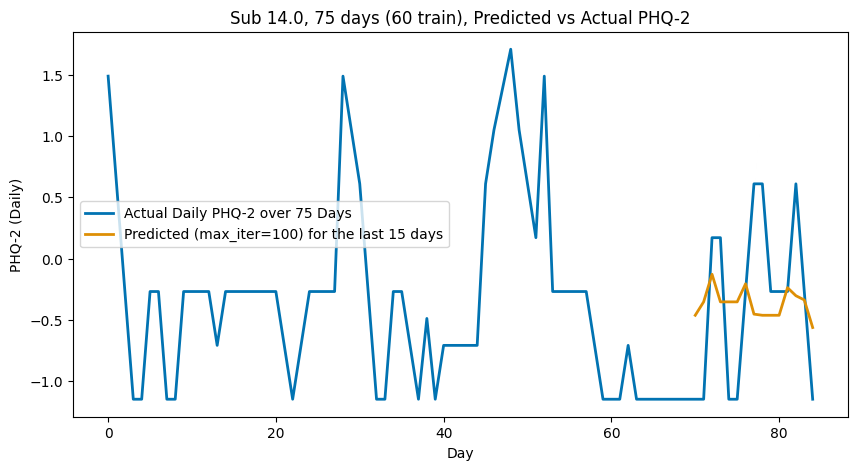

For 17.0, X-cols: ['sds_3', 'sds_1', 'support', 'sds_2', 'aggregate_communication', 'interaction_diversity', 'sms_count', 'sms_length', 'season_fall', 'season_num_1.0']


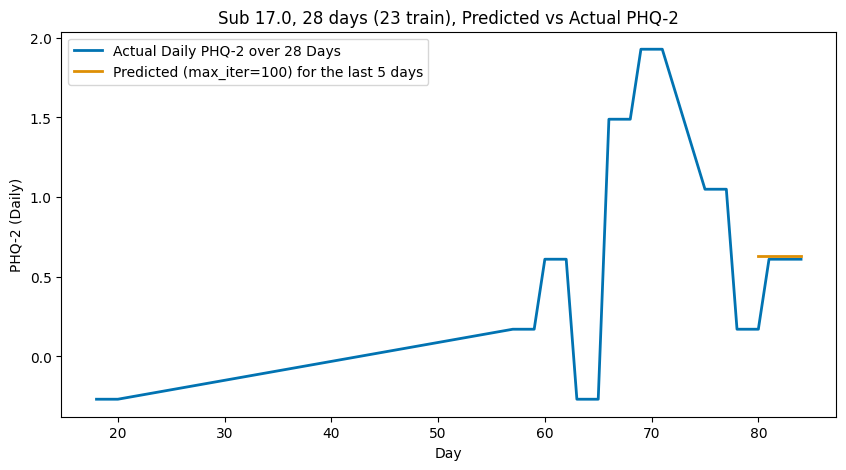

For 29.0, X-cols: ['sds_1', 'sms_length', 'sleep_2', 'sleep_3', 'stress', 'sms_count', 'mobility_radius', 'call_count', 'interaction_diversity', 'mobility']


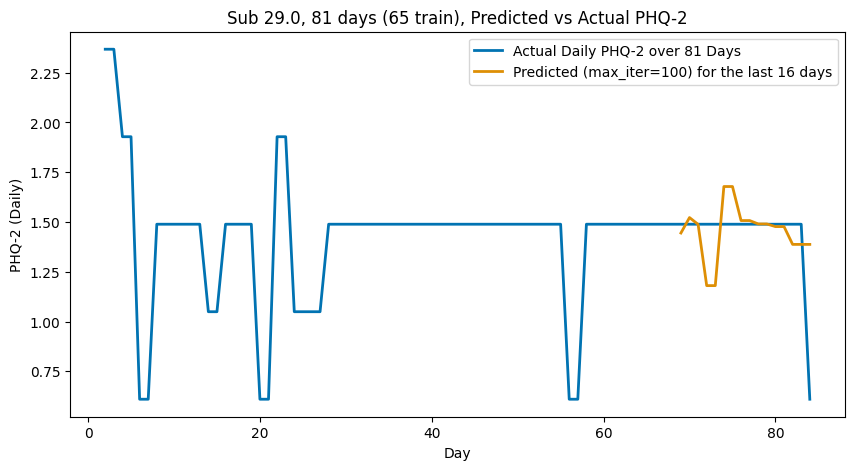

For 166.0, X-cols: ['hours_walking', 'dew_point_mean', 'distance_walking', 'dew_point_median', 'humidity_median', 'hours_active_hr', 'dew_point_std', 'cloud_cover_IQR', 'distance_active_hr', 'distance_walking_hr']


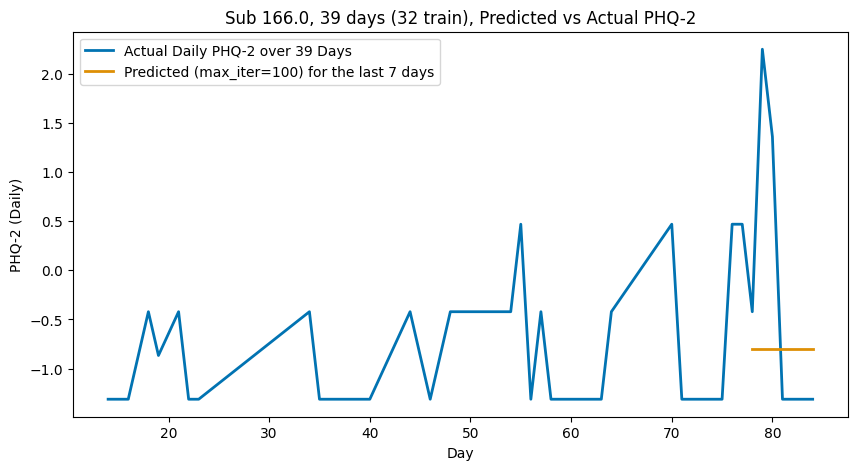

For 179.0, X-cols: ['sds_1', 'sds_2', 'sds_3', 'temp_std', 'humidity_IQR', 'temp_IQR', 'sleep_1', 'sleep_3', 'cloud_cover_mean', 'humidity_std']


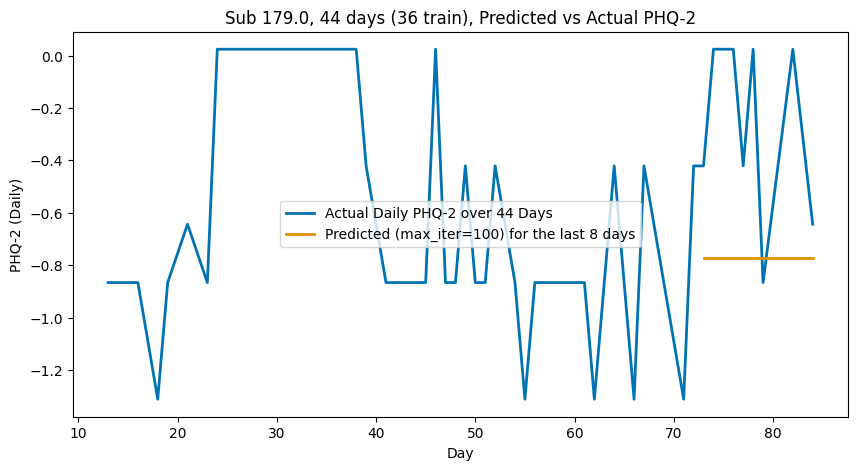

For 180.0, X-cols: ['cloud_cover_std', 'dew_point_std', 'hours_of_sleep_hr.3', 'hours_of_sleep_hr.1', 'hours_of_sleep_hr', 'hours_of_sleep_hr.2', 'sds_3', 'cloud_cover_IQR', 'location_variance_hr', 'sds_2']


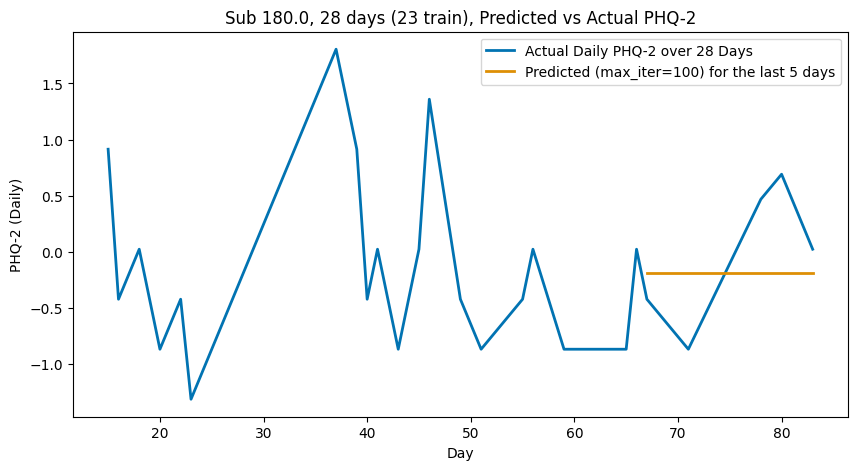

For 187.0, X-cols: ['hours_of_sleep_hr', 'hours_of_sleep_hr.2', 'hours_accounted_for', 'distance_walking_hr', 'hours_of_sleep_hr.1', 'hours_of_sleep_hr.3', 'distance_walking', 'hours_walking', 'hours_high_speed_transportation_hr', 'hours_high_speed_transportation']


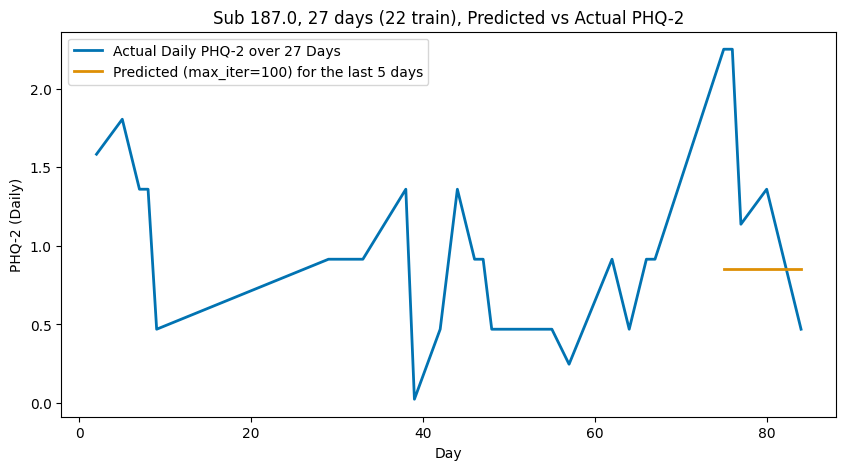

In [74]:
max_iter_list = [100]
colors = sns.color_palette("colorblind")

test_perc = 0.2

strong_corrs = {}
y_col = 'phq2_sum'
similar_y_col = 'phq'
for name in ['v1_day','v2_day']:
	sub_count=0
	df=pd.read_csv(os.path.join(brighten_dir, f'{name}_trainval_transformed.csv'))
	for sub, sub_df in df.groupby('num_id'):
		if sub=='1735.0' or sub==1735.0:
			continue
		sub_df_clean = sub_df.dropna(subset=[y_col])
		sub_df_clean = sub_df_clean.sort_values('day', ascending=True)
		days = len(sub_df_clean)
		if days > 20:
			sub_count+=1
			corr_df = sub_df_clean.corr(numeric_only=True)[y_col].abs().sort_values(ascending=False)
			corr_df = pd.DataFrame(corr_df).reset_index(names=['column'])
			corr_df[y_col] = pd.to_numeric(corr_df[y_col])
			strong_corr = corr_df.where(corr_df[y_col] > 0.1).dropna(how='all')
			clean_corr = [col for col in strong_corr['column'].to_list() if col not in id_columns and 'Unnamed' not in col and 'indicator' not in col and col not in ['week','month','day']]
			strong_corrs[sub] = clean_corr
			X_cols = [col for col in strong_corrs[sub] if similar_y_col not in col]
			X = sub_df_clean[X_cols[:10]]

			y = sub_df_clean[y_col]
		
			test_num = int(days*test_perc)
			train_num = days - test_num
			X_train = X[:train_num]
			X_test = X[train_num:]
			y_train = y[:train_num]
			y_test = y[train_num:]

			train_days_for_graphing = sub_df_clean['day'][:train_num]
			test_days_for_graphing = sub_df_clean['day'][train_num:]



			# build your actual_df as before
			actual_df = pd.DataFrame({
				'day': sub_df_clean['day'],
				y_col: y
			})
			
			if sub_count<5:
				fig, ax = plt.subplots(figsize=(10, 5))
				actual_df.plot(
					x='day',
					y=y_col,
					color=colors[0],
					label=f"Actual Daily PHQ-2 over {days} Days",
					linewidth=2,
					ax=ax
				)

			for idx, max_iter in enumerate(max_iter_list):
				hgbt = HistGradientBoostingRegressor(max_iter=max_iter, random_state=42)
				hgbt.fit(X_train, y_train)
				y_pred = hgbt.predict(X_test)

				pred_df = pd.DataFrame({
					'day': test_days_for_graphing,
					y_col : y_pred
				})

				if sub_count<5:
					pred_df.plot(
						x = 'day',
						y = y_col,
						color=colors[idx + 1],
						label=f"Predicted (max_iter={max_iter}) for the last {test_num} days",
						linewidth=2,
						ax=ax,
					)


				
			
			if sub_count<5:
				ax.set(
					title=f"Sub {sub}, {days} days ({train_num} train), Predicted vs Actual PHQ-2",
					xlabel="Day",
					ylabel="PHQ-2 (Daily)",
				)
				print(f'For {sub}, X-cols: {X.columns.to_list()}')
				ax.legend()
				plt.show()

				
			


# Try doing by-subject top-10 ANOVA

Run on: Sun 12 Apr 2026, 11:16PM
For 1.0, X-cols: ['mobility', 'mobility_radius', 'unreturned_calls', 'sms_count', 'aggregate_communication', 'call_duration', 'call_count', 'missed_interactions', 'sms_length', 'interaction_diversity', 'sleep_1', 'sds_1', 'stress', 'phq9_9_base', 'phq9_1_base', 'phq9_5_base', 'education', 'sleep_3', 'phq9_4_base', 'support', 'phq9_8_base', 'phq9_7_base', 'phq9_3_base', 'sds_3', 'income_satisfaction', 'phq9_2_base', 'phq9_6_base', 'sds_2', 'sleep_2', 'phq2_1', 'phq2_2', 'phq2_sum', 'phq9_1', 'phq9_2', 'phq9_3', 'phq9_4', 'phq9_5', 'phq9_6', 'phq9_7', 'phq9_8', 'phq9_9', 'phq9_sum', 'Unnamed: 0', 'num_id', 'date', 'month', 'week', 'day', 'id_week', 'id_day', 'v', 'day_of_week', 'cohort_Akili', 'cohort_Health tips', 'cohort_PST', 'gender_0.0', 'gender_1.0', 'marital_status_0.0', 'marital_status_1.0', 'marital_status_2.0', 'race_0.0', 'race_1.0', 'race_2.0', 'race_3.0', 'race_4.0', 'race_5.0', 'race_6.0', 'season_fall', 'season_spring', 'season_summer', 'se

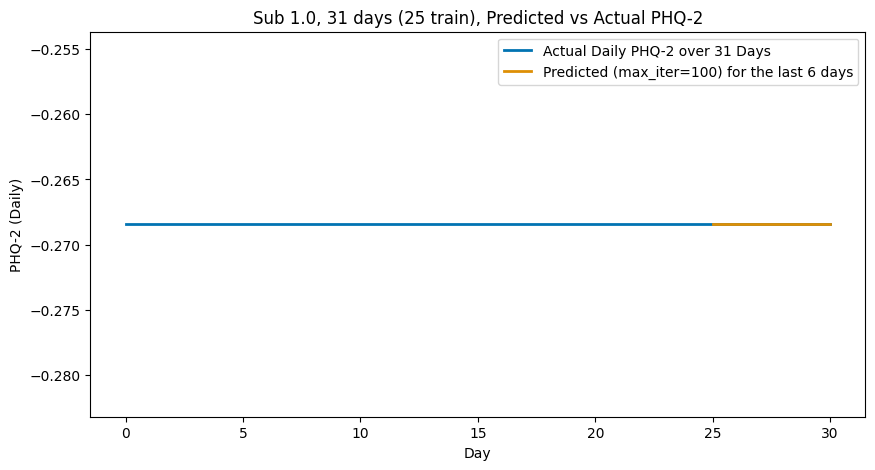

For 13.0, X-cols: ['missed_interactions', 'sleep_1', 'sleep_2', 'pc_unreturned_calls', 'sds_3', 'unreturned_calls', 'sms_count', 'aggregate_communication', 'pc_sms', 'sms_length']


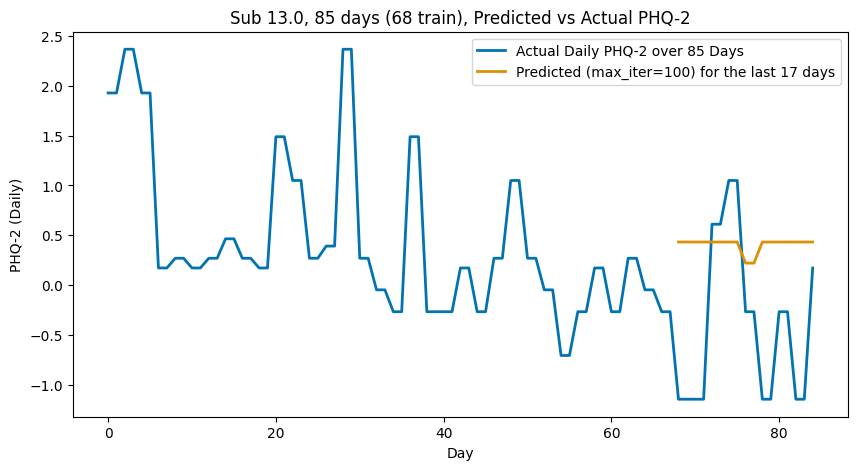

For 14.0, X-cols: ['sleep_2', 'sds_3', 'call_duration', 'pc_mobility', 'sds_2', 'mobility', 'pc_calls', 'mobility_radius', 'mood_1', 'sds_1']


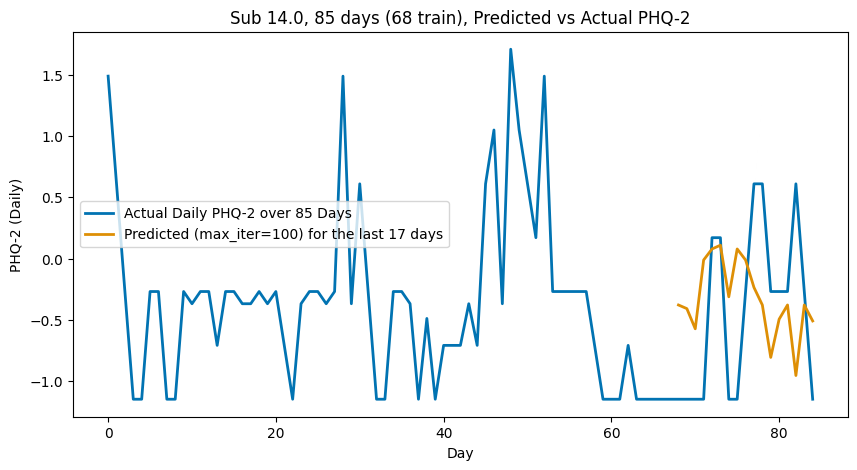

For 29.0, X-cols: ['stress', 'sds_1', 'sleep_2', 'sleep_3', 'sms_length', 'pc_sms', 'mobility_radius', 'call_count', 'pc_calls', 'pc_mobility']


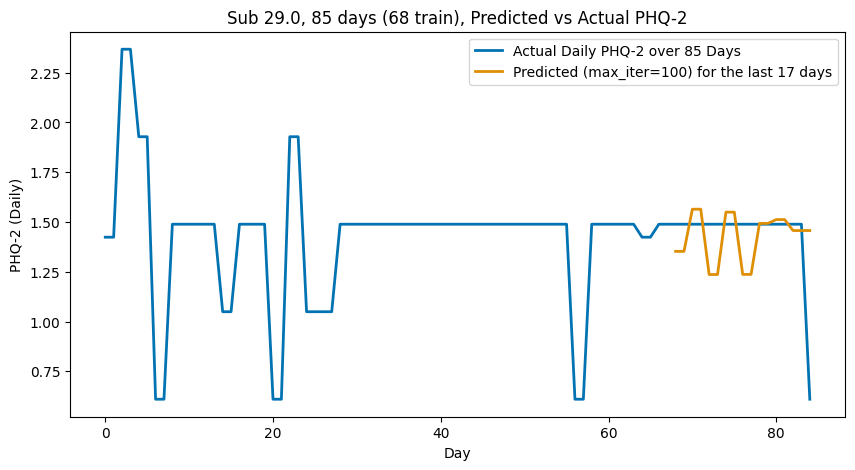

For 161.0, X-cols: ['precip_sum', 'hours_of_sleep_hr', 'hours_powered_vehicle', 'hours_powered_vehicle_hr', 'pc_weather_means', 'sleep_3', 'temp_IQR', 'mood_1', 'humidity_mean', 'dew_point_IQR']


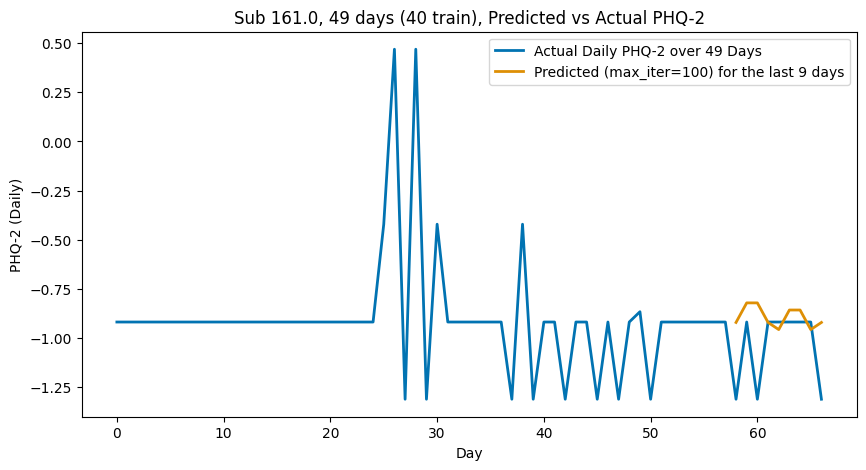

For 166.0, X-cols: ['dew_point_std', 'pc_dew_point', 'temp_mean', 'pc_temp_humidity_std', 'humidity_std', 'dew_point_mean', 'humidity_IQR', 'pc_dew_point_std', 'temp_median', 'dew_point_median']


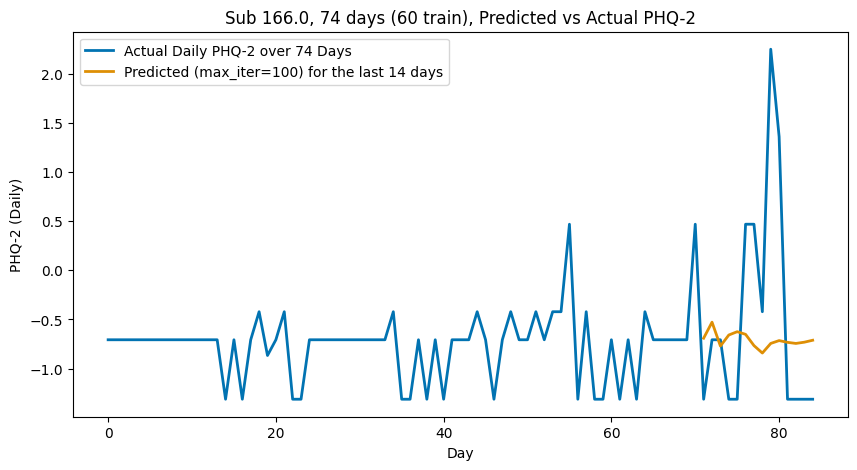

For 174.0, X-cols: ['humidity_IQR', 'temp_IQR', 'temp_median', 'pc_temp_humidity_std', 'hours_walking', 'pc_temp', 'temp_mean', 'hours_stationary', 'temp_std', 'humidity_std']


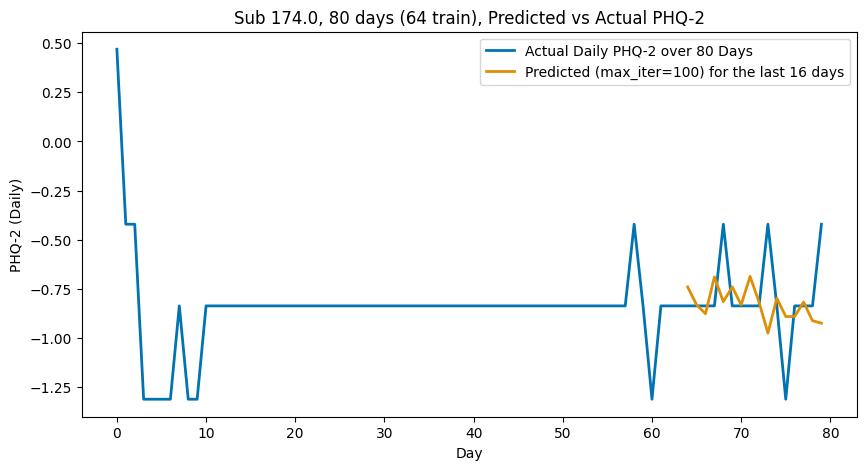

For 175.0, X-cols: ['location_variance_hr', 'hours_accounted_for', 'location_variance', 'mood_1', 'sds_3', 'sds_1', 'stress', 'sds_2', 'pc_weather_means', 'distance_powered_vehicle_hr']


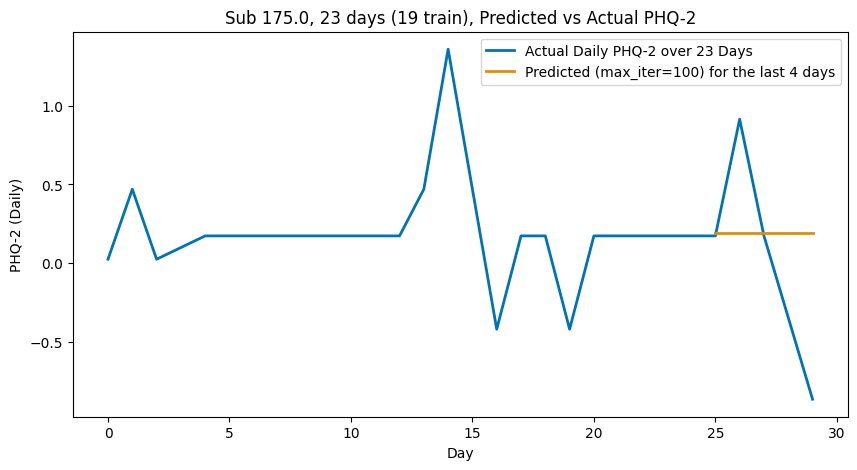

In [75]:
import seaborn as sns
print('Run on:', dt.datetime.today().strftime('%a %d %b %Y, %I:%M%p'))

max_iter_list = [100]
colors = sns.color_palette("colorblind")


test_perc = 0.2

strong_corrs = {}
y_col = 'phq2_sum'
similar_y_col = 'phq'
for name in ['v1_day','v2_day','v1_week','v2_week']:
	sub_count=0
	df=pd.read_csv(os.path.join(brighten_dir, f'{name}_trainval_pca.csv'))
	for sub, sub_df in df.groupby('num_id'):
		if sub=='1735.0' or sub==1735.0:
			continue
		
		try:
			top_features_sub = top_features[y_col][name][sub]
		except Exception as e:
			pass

		sub_df_clean = sub_df.dropna(subset=[y_col])
		sub_df_clean = sub_df_clean.sort_values('day', ascending=True)
		days = len(sub_df_clean)
		if days > 20:
			sub_count+=1
			X = sub_df_clean[top_features_sub]
			y = sub_df_clean[y_col]
		
			test_num = int(days*test_perc)
			train_num = days - test_num
			X_train = X[:train_num]
			X_test = X[train_num:]
			y_train = y[:train_num]
			y_test = y[train_num:]

			train_days_for_graphing = sub_df_clean['day'][:train_num]
			test_days_for_graphing = sub_df_clean['day'][train_num:]



			# build your actual_df as before
			actual_df = pd.DataFrame({
				'day': sub_df_clean['day'],
				y_col: y
			})
			
			if sub_count<5:
				fig, ax = plt.subplots(figsize=(10, 5))
				actual_df.plot(
					x='day',
					y=y_col,
					color=colors[0],
					label=f"Actual Daily PHQ-2 over {days} Days",
					linewidth=2,
					ax=ax
				)

			for idx, max_iter in enumerate(max_iter_list):
				hgbt = HistGradientBoostingRegressor(max_iter=max_iter, random_state=42)
				hgbt.fit(X_train, y_train)
				y_pred = hgbt.predict(X_test)

				pred_df = pd.DataFrame({
					'day': test_days_for_graphing,
					y_col : y_pred
				})

				if sub_count<5:
					pred_df.plot(
						x = 'day',
						y = y_col,
						color=colors[idx + 1],
						label=f"Predicted (max_iter={max_iter}) for the last {test_num} days",
						linewidth=2,
						ax=ax,
					)


				
			
			if sub_count<5:
				ax.set(
					title=f"Sub {sub}, {days} days ({train_num} train), Predicted vs Actual PHQ-2",
					xlabel="Day",
					ylabel="PHQ-2 (Daily)",
				)
				print(f'For {sub}, X-cols: {X.columns.to_list()}')
				ax.legend()
				plt.show()

				
			


# By subject using only top 15 ANOVA all-sub features for PHQ2

Run on: Sun 12 Apr 2026, 11:16PM
################### v1_day ###################
Using cols: ['mobility', 'mobility_radius', 'sms_count', 'aggregate_communication', 'call_count', 'missed_interactions', 'sms_length', 'interaction_diversity', 'sds_1', 'stress', 'support', 'sds_3', 'sds_2', 'dt_mobility_v2', 'pc_mobility', 'pc_unreturned_calls', 'pc_sms']


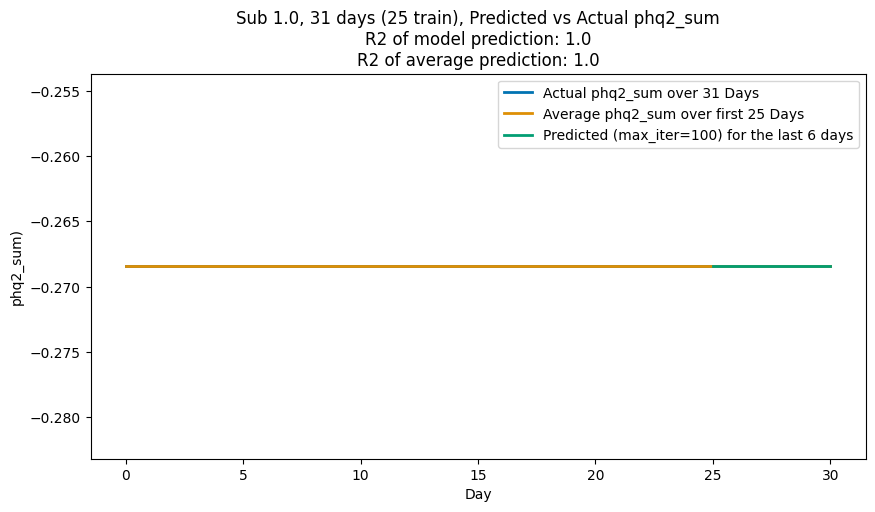

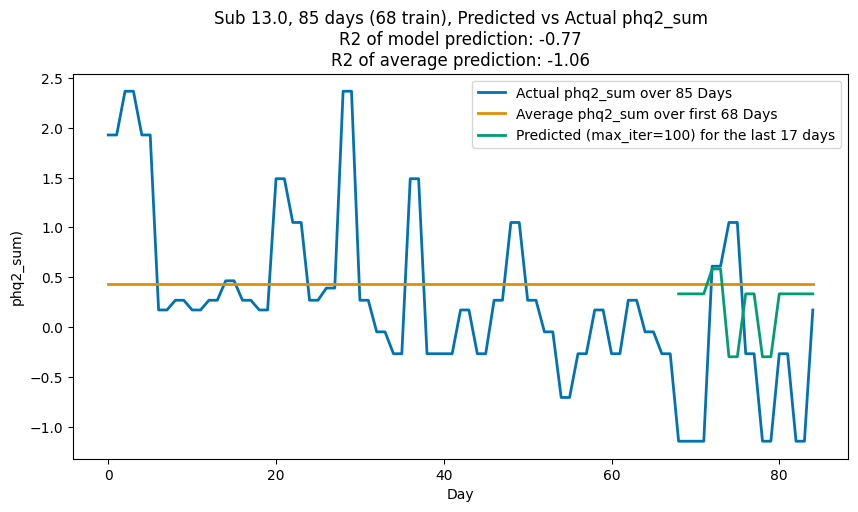

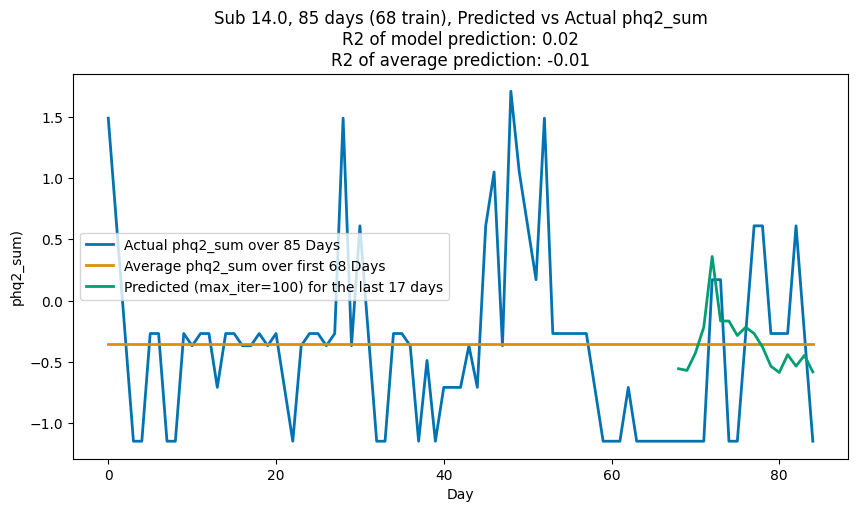

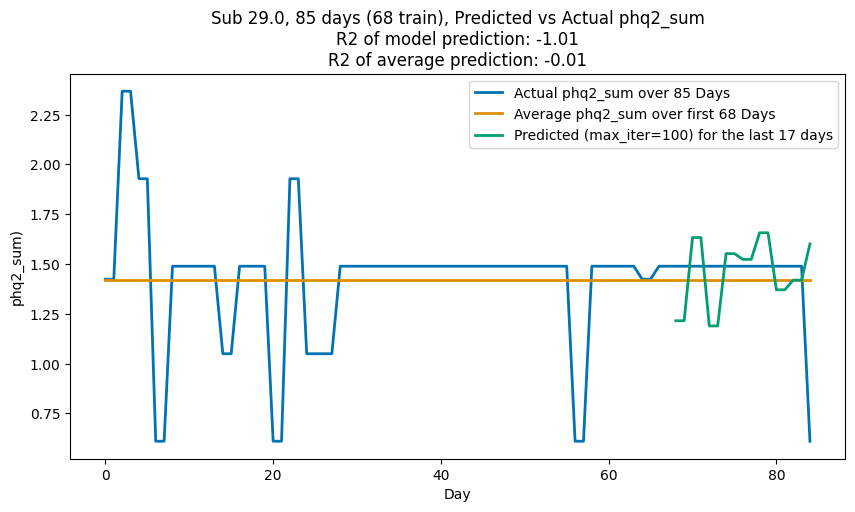

################### v2_day ###################
Using cols: ['distance_active_hr', 'location_variance_hr', 'location_variance', 'hours_active_hr', 'hours_of_sleep_hr', 'hours_of_sleep', 'humidity_IQR', 'humidity_std', 'temp_mean', 'temp_IQR', 'dew_point_mean', 'temp_median', 'hours_of_sleep_hr.1', 'hours_of_sleep_hr.2', 'hours_of_sleep_hr.3', 'pc_active_mobility', 'pc_temp_humidity_std', 'pc_dew_point_std', 'pc_temp']


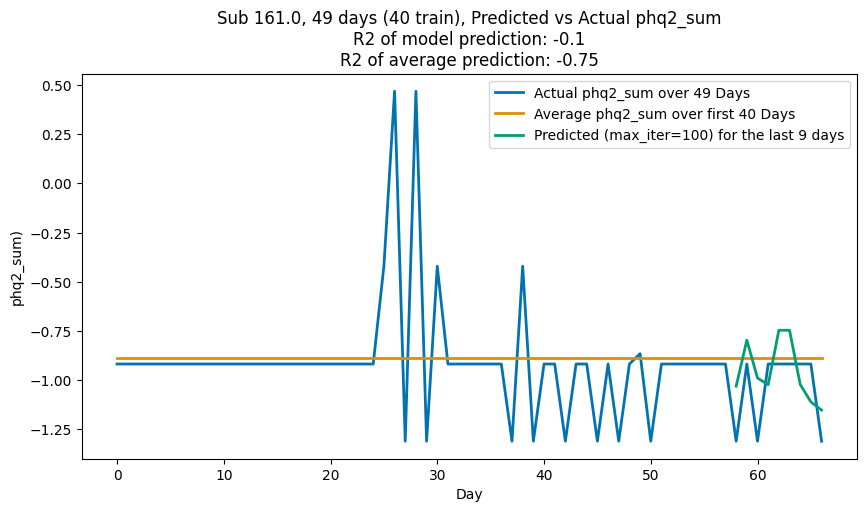

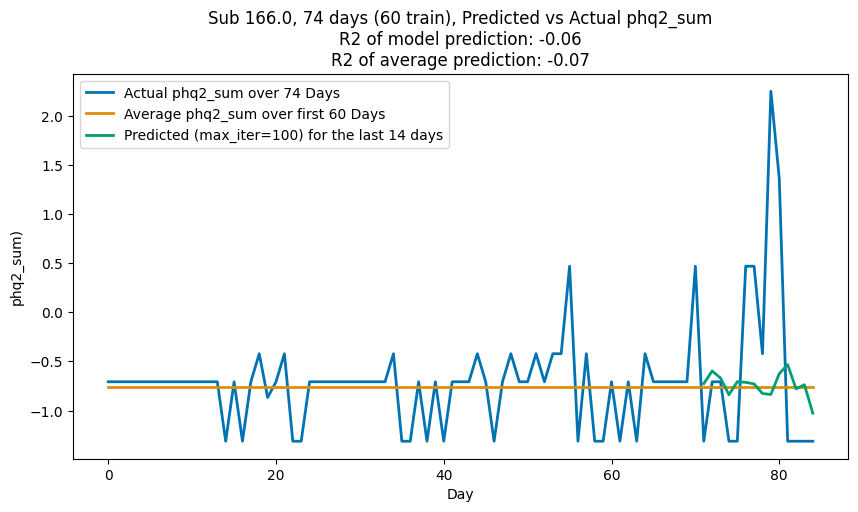

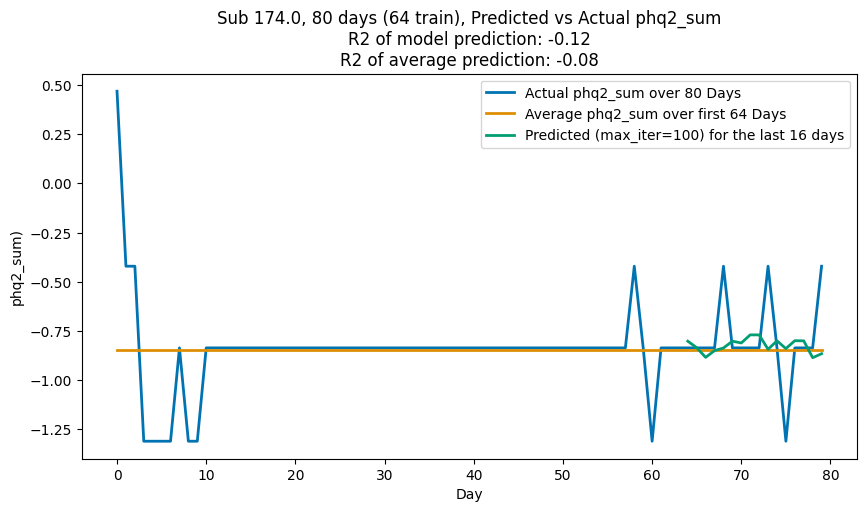

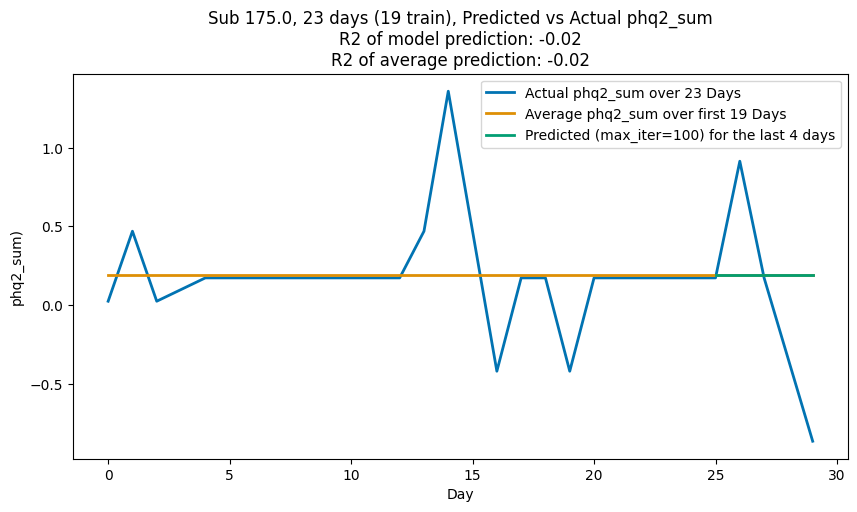

################### v1_week ###################
Using cols: ['mobility', 'mobility_radius', 'unreturned_calls', 'sms_count', 'aggregate_communication', 'call_duration', 'call_count', 'missed_interactions', 'sms_length', 'interaction_diversity', 'sds_1', 'stress', 'support', 'sds_3', 'sds_2', 'dt_mobility_v2', 'pc_unreturned_calls', 'pc_mobility', 'pc_mobility_radius']
################### v2_week ###################
Using cols: ['hours_walking', 'distance_high_speed_transportation_hr', 'distance_active', 'distance_active_hr', 'hours_accounted_for', 'distance_walking', 'hours_high_speed_transportation_hr', 'hours_high_speed_transportation', 'distance_walking_hr', 'hours_of_sleep_hr', 'hours_of_sleep', 'hours_of_sleep_hr.1', 'hours_of_sleep_hr.2', 'hours_of_sleep_hr.3', 'sds_1', 'mood_1', 'support', 'sds_3', 'sds_2', 'pc_commute']


In [76]:
print('Run on:', dt.datetime.today().strftime('%a %d %b %Y, %I:%M%p'))

max_iter_list = [100]
colors = sns.color_palette("colorblind")

test_perc = 0.2
r2_from_model = []

strong_corrs = {}
y_col = 'phq2_sum'
similar_y_col = 'phq'
for name in ['v1_day','v2_day','v1_week','v2_week']:
	print(f'################### {name} ###################')
	sub_count=0
	df=pd.read_csv(os.path.join(brighten_dir, f'{name}_trainval_pca.csv'))
	X_choices = anova_features[y_col][name]
	X_cols = list(set([col for col in X_choices if similar_y_col not in col and 'Unnamed' not in col and col not in id_columns and 'indicator' not in col]))
	X_cols_present = [col for col in df.columns if any(item in col for item in X_cols)]
	print(f'Using cols: {X_cols_present}')
	for sub, sub_df in df.groupby('num_id'):
		sub_count+=1
		sub_df_clean = sub_df.dropna(subset=[y_col])
		sub_df_clean = sub_df_clean.sort_values(by='day', ascending=True)
		days = len(sub_df_clean)
		if days > 20:
			X = sub_df_clean[X_cols_present]
			y = sub_df_clean[y_col]
		
			test_num = int(days*test_perc)
			train_num = days - test_num
			X_train = X[:train_num]
			X_test = X[train_num:]
			y_train = y[:train_num]
			y_test = y[train_num:]

			train_days_for_graphing = sub_df_clean['day'][:train_num]
			test_days_for_graphing = sub_df_clean['day'][train_num:]


			# build your actual_df as before
			actual_df = pd.DataFrame({
				'day': sub_df_clean['day'],
				y_col: y
			})
			

			
			avg = y_train.mean()
			avg_df = pd.DataFrame({
					'day': sub_df_clean['day'],
					y_col : [avg]*days
				})
			
			hgbt = HistGradientBoostingRegressor(max_iter=max_iter, random_state=42)
			hgbt.fit(X_train, y_train)
			y_pred = hgbt.predict(X_test)

			pred_df = pd.DataFrame({
				'day': test_days_for_graphing,
				y_col : y_pred
			})
			
			r2_actual_vs_model = r2_score(y_test, pred_df[y_col])
			r2_actual_vs_avg = r2_score(y_test, avg_df[y_col][:test_num])
			
			r2_from_model.append([sub, r2_actual_vs_model, r2_actual_vs_avg, r2_actual_vs_model-r2_actual_vs_avg])

			if sub_count<5:
				fig, ax = plt.subplots(figsize=(10, 5))


				actual_df.plot(
					x='day',
					y=y_col,
					color=colors[0],
					label=f"Actual {y_col} over {days} Days",
					linewidth=2,
					ax=ax
				)

				avg_df.plot(
					x='day',
					y=y_col,
					color=colors[1],
					label=f"Average {y_col} over first {train_num} Days",
					linewidth=2,
					ax=ax
				)

				pred_df.plot(
					x = 'day',
					y = y_col,
					color=colors[idx + 2],
					label=f"Predicted (max_iter={max_iter}) for the last {test_num} days",
					linewidth=2,
					ax=ax,
				)

				ax.set(
					title=f"Sub {sub}, {days} days ({train_num} train), Predicted vs Actual {y_col}\nR2 of model prediction: {round(r2_actual_vs_model,2)}\nR2 of average prediction: {round(r2_actual_vs_avg,2)}",
					xlabel="Day",
					ylabel=f"{y_col})",
				)
				ax.legend()
				plt.show()


	r2_from_model_df = pd.DataFrame(r2_from_model, columns=['sub', 'r2_actual_vs_model', 'r2_actual_vs_avg', 'r2_model_increase_from_avg'])
	r2_from_model_df.to_csv(os.path.join(results_dir, f'{name}_{y_col}_r2_model_increase_from_avg.csv'))
			
		


Run on: Sun 12 Apr 2026, 11:17PM
################### v1_day ###################
Using cols: ['mobility', 'mobility_radius', 'sms_count', 'aggregate_communication', 'call_count', 'missed_interactions', 'sms_length', 'interaction_diversity', 'sds_1', 'stress', 'support', 'sds_3', 'sds_2', 'dt_mobility_v2', 'pc_mobility', 'pc_unreturned_calls', 'pc_sms']


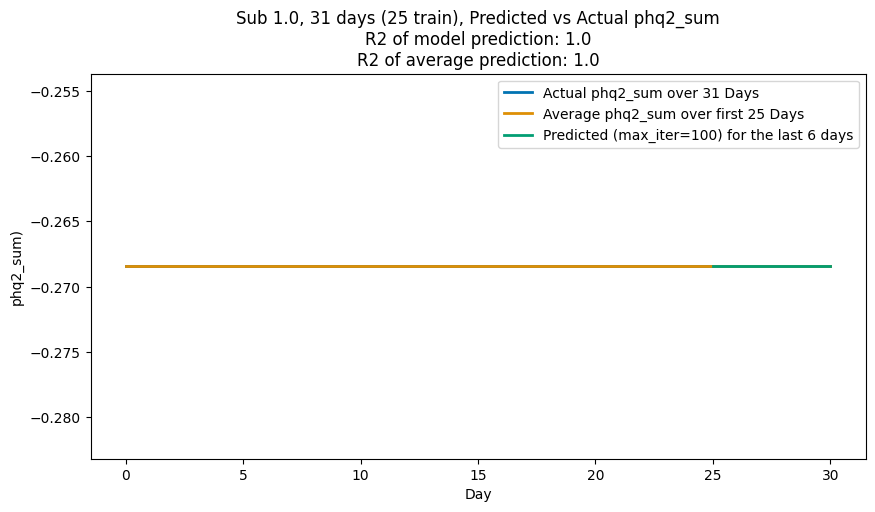

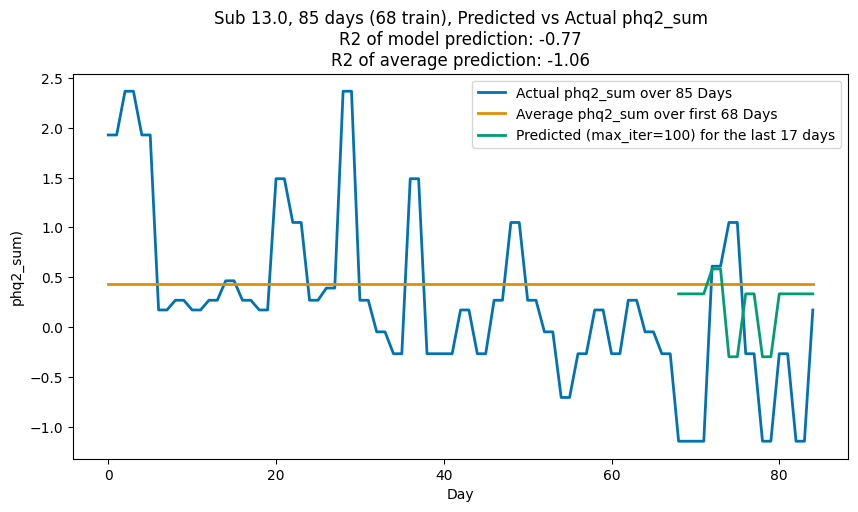

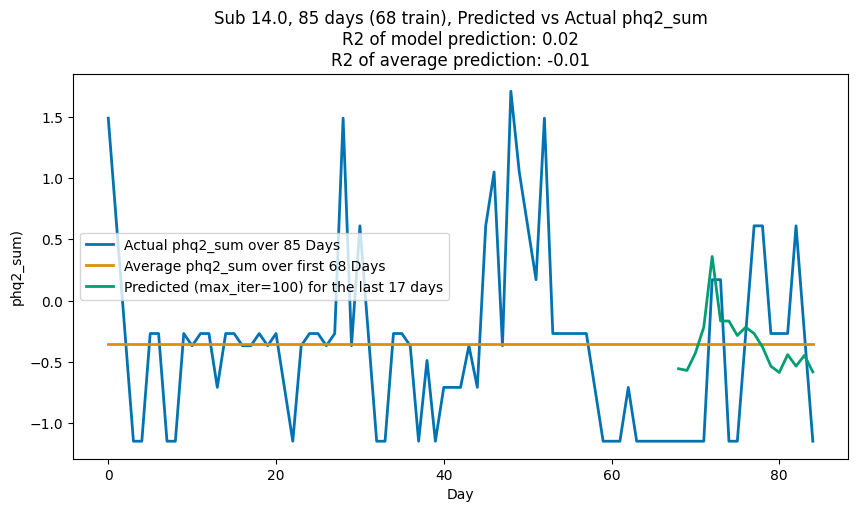

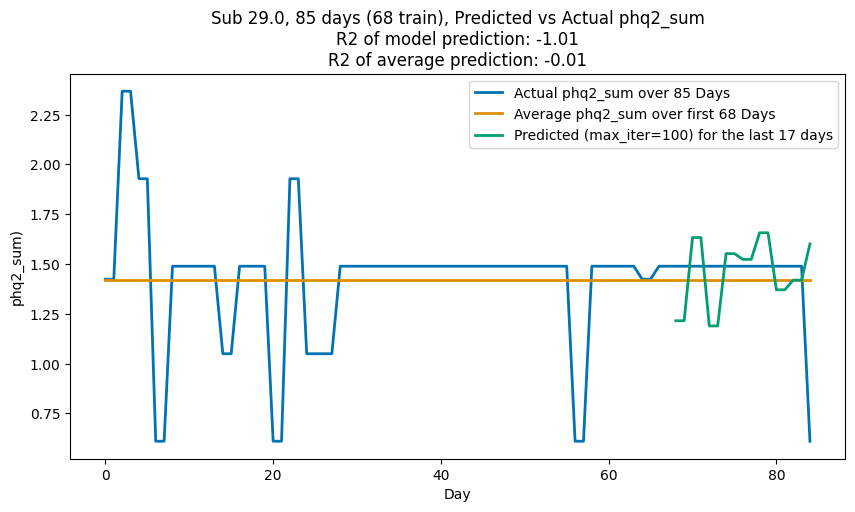

################### v2_day ###################
Using cols: ['distance_active_hr', 'location_variance_hr', 'location_variance', 'hours_active_hr', 'hours_of_sleep_hr', 'hours_of_sleep', 'humidity_IQR', 'humidity_std', 'temp_mean', 'temp_IQR', 'dew_point_mean', 'temp_median', 'hours_of_sleep_hr.1', 'hours_of_sleep_hr.2', 'hours_of_sleep_hr.3', 'pc_active_mobility', 'pc_temp_humidity_std', 'pc_dew_point_std', 'pc_temp']


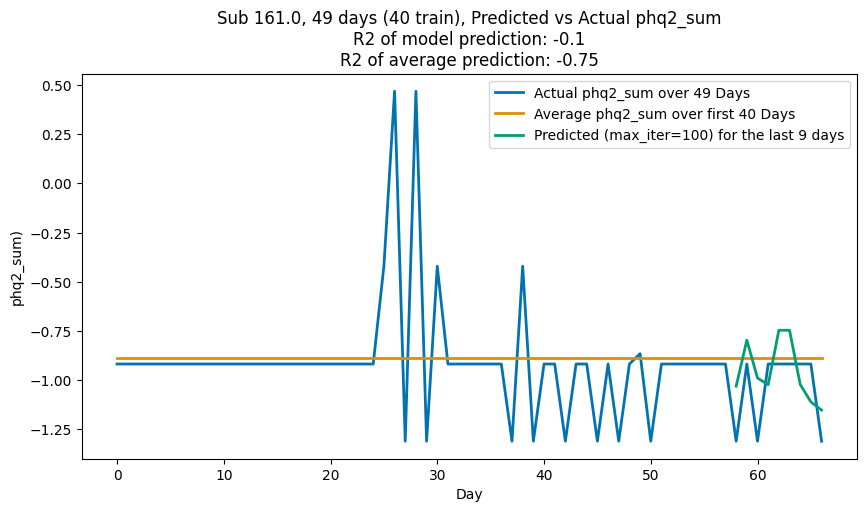

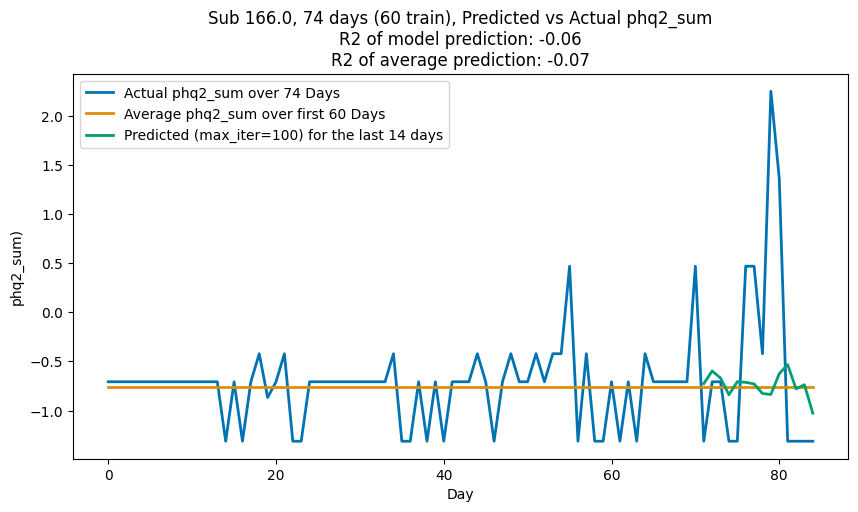

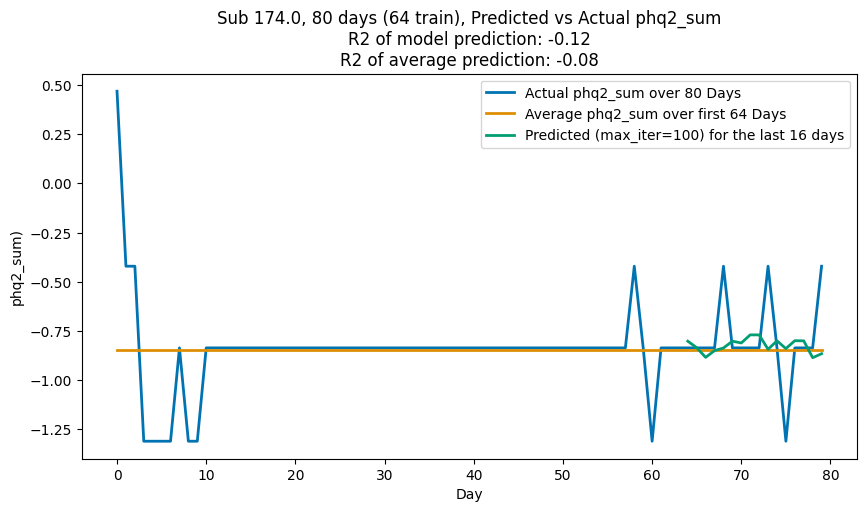

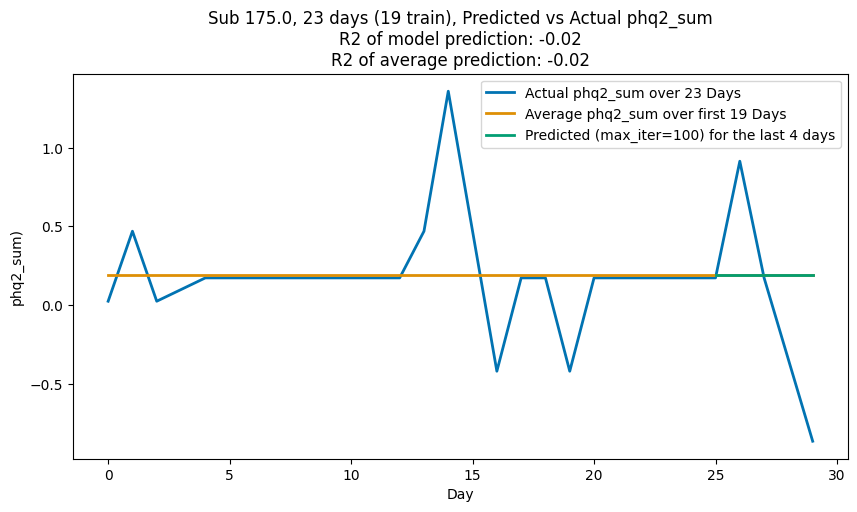

################### v1_week ###################
Using cols: ['mobility', 'mobility_radius', 'unreturned_calls', 'sms_count', 'aggregate_communication', 'call_duration', 'call_count', 'missed_interactions', 'sms_length', 'interaction_diversity', 'sds_1', 'stress', 'support', 'sds_3', 'sds_2', 'dt_mobility_v2', 'pc_unreturned_calls', 'pc_mobility', 'pc_mobility_radius']
################### v2_week ###################
Using cols: ['hours_walking', 'distance_high_speed_transportation_hr', 'distance_active', 'distance_active_hr', 'hours_accounted_for', 'distance_walking', 'hours_high_speed_transportation_hr', 'hours_high_speed_transportation', 'distance_walking_hr', 'hours_of_sleep_hr', 'hours_of_sleep', 'hours_of_sleep_hr.1', 'hours_of_sleep_hr.2', 'hours_of_sleep_hr.3', 'sds_1', 'mood_1', 'support', 'sds_3', 'sds_2', 'pc_commute']


In [77]:
print('Run on:', dt.datetime.today().strftime('%a %d %b %Y, %I:%M%p'))
max_iter_list = [100]
colors = sns.color_palette("colorblind")

test_perc = 0.2
r2_from_model = []

strong_corrs = {}
y_col = 'phq2_sum'
similar_y_col = 'phq'
for name in ['v1_day','v2_day','v1_week','v2_week']:
	print(f'################### {name} ###################')
	sub_count=0
	df=pd.read_csv(os.path.join(brighten_dir, f'{name}_trainval_pca.csv'))
	X_choices = anova_features[y_col][name]
	X_cols = list(set([col for col in X_choices if similar_y_col not in col and 'Unnamed' not in col and col not in id_columns and 'indicator' not in col]))
	X_cols_present = [col for col in df.columns if any(item in col for item in X_cols)]
	print(f'Using cols: {X_cols_present}')
	for sub, sub_df in df.groupby('num_id'):
		sub_count+=1
		sub_df_clean = sub_df.dropna(subset=[y_col])
		sub_df_clean = sub_df_clean.sort_values(by='day', ascending=True)
		days = len(sub_df_clean)
		if days > 20:
			X = sub_df_clean[X_cols_present]
			y = sub_df_clean[y_col]
		
			test_num = int(days*test_perc)
			train_num = days - test_num
			X_train = X[:train_num]
			X_test = X[train_num:]
			y_train = y[:train_num]
			y_test = y[train_num:]

			train_days_for_graphing = sub_df_clean['day'][:train_num]
			test_days_for_graphing = sub_df_clean['day'][train_num:]


			# build your actual_df as before
			actual_df = pd.DataFrame({
				'day': sub_df_clean['day'],
				y_col: y
			})
			

			
			avg = y_train.mean()
			avg_df = pd.DataFrame({
					'day': sub_df_clean['day'],
					y_col : [avg]*days
				})
			
			hgbt = HistGradientBoostingRegressor(max_iter=max_iter, random_state=42)
			hgbt.fit(X_train, y_train)
			y_pred = hgbt.predict(X_test)

			pred_df = pd.DataFrame({
				'day': test_days_for_graphing,
				y_col : y_pred
			})
			
			r2_actual_vs_model = r2_score(y_test, pred_df[y_col])
			r2_actual_vs_avg = r2_score(y_test, avg_df[y_col][:test_num])
			
			r2_from_model.append([sub, r2_actual_vs_model, r2_actual_vs_avg, r2_actual_vs_model-r2_actual_vs_avg])

			if sub_count<5:
				fig, ax = plt.subplots(figsize=(10, 5))


				actual_df.plot(
					x='day',
					y=y_col,
					color=colors[0],
					label=f"Actual {y_col} over {days} Days",
					linewidth=2,
					ax=ax
				)

				avg_df.plot(
					x='day',
					y=y_col,
					color=colors[1],
					label=f"Average {y_col} over first {train_num} Days",
					linewidth=2,
					ax=ax
				)

				pred_df.plot(
					x = 'day',
					y = y_col,
					color=colors[idx + 2],
					label=f"Predicted (max_iter={max_iter}) for the last {test_num} days",
					linewidth=2,
					ax=ax,
				)

				ax.set(
					title=f"Sub {sub}, {days} days ({train_num} train), Predicted vs Actual {y_col}\nR2 of model prediction: {round(r2_actual_vs_model,2)}\nR2 of average prediction: {round(r2_actual_vs_avg,2)}",
					xlabel="Day",
					ylabel=f"{y_col})",
				)
				ax.legend()
				plt.show()


	r2_from_model_df = pd.DataFrame(r2_from_model, columns=['sub', 'r2_actual_vs_model', 'r2_actual_vs_avg', 'r2_model_increase_from_avg'])
	r2_from_model_df.to_csv(os.path.join(results_dir, f'{name}_{y_col}_r2_model_increase_from_avg.csv'))
			
		


# PHQ9 Using top 15

In [78]:
print('Run on:', dt.datetime.today().strftime('%a %d %b %Y, %I:%M%p'))

max_iter_list = [100]
colors = sns.color_palette("colorblind")

test_perc = 0.2
r2_from_model = []

strong_corrs = {}
y_col = 'phq9_sum'
similar_y_col = 'phq9'
for name in ['v1_week','v2_week']:
	sub_count=0
	df=pd.read_csv(os.path.join(brighten_dir, f'{name}_trainval_pca.csv'))
	X_choices = anova_features[y_col][name]
	X_cols = list(set([col for col in X_choices if similar_y_col not in col and 'Unnamed' not in col and col not in id_columns and 'indicator' not in col and col not in ['week','month','day']]))
	X_cols_present = [col for col in df.columns if any(item in col for item in X_cols)]
	print(f'Using cols: {X_cols_present}')
	for sub, sub_df in df.groupby('num_id'):
		sub_count+=1
		sub_df_clean = sub_df.dropna(subset=[y_col])
		sub_df_clean = sub_df_clean.sort_values(by='week', ascending=True)
		days = len(sub_df_clean)
		if days > 20:
			X = sub_df_clean[X_cols_present]
			y = sub_df_clean[y_col]
		
			test_num = int(days*test_perc)
			train_num = days - test_num
			X_train = X[:train_num]
			X_test = X[train_num:]
			y_train = y[:train_num]
			y_test = y[train_num:]

			test_days_for_graphing = sub_df_clean['week'][train_num:]

			# build your actual_df as before
			actual_df = pd.DataFrame({
				'week': sub_df_clean['week'].copy(),
				y_col: y
			})
			

			
			avg = y_train.mean()
			avg_df = pd.DataFrame({
					'week': sub_df_clean['week'].copy(),
					y_col : [avg]*days
				})
			
			hgbt = HistGradientBoostingRegressor(max_iter=max_iter, random_state=42)
			hgbt.fit(X_train, y_train)
			y_pred = hgbt.predict(X_test)
			

			pred_df = pd.DataFrame({
				'week': test_days_for_graphing,
				y_col : y_pred
			})
			
			r2_actual_vs_model = r2_score(y_test, pred_df[y_col])
			r2_actual_vs_avg = r2_score(y_test, avg_df[y_col][:test_num])
			
			r2_from_model.append([sub, r2_actual_vs_model, r2_actual_vs_avg, r2_actual_vs_model-r2_actual_vs_avg])

			if sub_count<5:
				display(X_test)
				print(y_pred)
				fig, ax = plt.subplots(figsize=(10, 5))


				actual_df.plot(
					x='week',
					y=y_col,
					color=colors[0],
					label=f"Actual {y_col} over {days} Days",
					linewidth=2,
					ax=ax
				)

				avg_df.plot(
					x='week',
					y=y_col,
					color=colors[1],
					label=f"Average {y_col} over first {train_num} Days",
					linewidth=2,
					ax=ax
				)

				pred_df.plot(
					x = 'week',
					y = y_col,
					color=colors[idx + 2],
					label=f"Predicted (max_iter={max_iter}) for the last {test_num} days",
					linewidth=2,
					ax=ax,
				)

				ax.set(
					title=f"Sub {sub}, {days} days ({train_num} train), Predicted vs Actual {y_col}\nR2 of model prediction: {round(r2_actual_vs_model,2)}\nR2 of average prediction: {round(r2_actual_vs_avg,2)}",
					xlabel="Week",
					ylabel=f"{y_col})",
				)
				ax.legend()
				plt.show()


	r2_from_model_df = pd.DataFrame(r2_from_model, columns=['sub', 'r2_actual_vs_model', 'r2_actual_vs_avg', 'r2_model_increase_from_avg'])
	r2_from_model_df.to_csv(os.path.join(results_dir, f'{name}_{y_col}_r2_model_increase_from_avg.csv'))
			
		


Run on: Sun 12 Apr 2026, 11:17PM
Using cols: ['mobility', 'mobility_radius', 'unreturned_calls', 'call_duration', 'call_count', 'missed_interactions', 'sds_1', 'stress', 'sleep_3', 'support', 'sds_3', 'sds_2', 'phq2_1', 'phq2_bin', 'dt_mobility_v2', 'pc_unreturned_calls', 'pc_calls', 'pc_mobility', 'pc_sms', 'pc_mobility_radius']
Using cols: ['distance_powered_vehicle_hr', 'distance_active_hr', 'distance_powered_vehicle', 'hours_powered_vehicle_hr', 'hours_powered_vehicle', 'cloud_cover_mean', 'dew_point_IQR', 'temp_std', 'sds_1', 'stress', 'mood_1', 'support', 'sds_3', 'sds_2', 'phq2_sum', 'pc_humidity_cloud_mean', 'pc_phq2']


In [79]:
print('Run on:', dt.datetime.today().strftime('%a %d %b %Y, %I:%M%p'))
max_iter_list = [100]
colors = sns.color_palette("colorblind")

test_perc = 0.2
r2_from_model = []

strong_corrs = {}
y_col = 'phq9_sum'
similar_y_col = 'phq9'
for name in ['v1_week','v2_week']:
	sub_count=0
	df=pd.read_csv(os.path.join(brighten_dir, f'{name}_trainval_pca.csv'))
	X_choices = anova_features[y_col][name]
	X_cols = list(set([col for col in X_choices if similar_y_col not in col and 'Unnamed' not in col and col not in id_columns and 'indicator' not in col and col not in ['week','month','day']]))
	X_cols_present = [col for col in df.columns if any(item in col for item in X_cols)]
	print(f'Using cols: {X_cols_present}')
	for sub, sub_df in df.groupby('num_id'):
		sub_count+=1
		sub_df_clean = sub_df.dropna(subset=[y_col])
		sub_df_clean = sub_df_clean.sort_values(by='week', ascending=True)
		days = len(sub_df_clean)
		if days > 20:
			X = sub_df_clean[X_cols_present]
			y = sub_df_clean[y_col]
		
			test_num = int(days*test_perc)
			train_num = days - test_num
			X_train = X[:train_num]
			X_test = X[train_num:]
			y_train = y[:train_num]
			y_test = y[train_num:]

			test_days_for_graphing = sub_df_clean['week'][train_num:]

			# build your actual_df as before
			actual_df = pd.DataFrame({
				'week': sub_df_clean['week'].copy(),
				y_col: y
			})
			

			
			avg = y_train.mean()
			avg_df = pd.DataFrame({
					'week': sub_df_clean['week'].copy(),
					y_col : [avg]*days
				})
			
			hgbt = HistGradientBoostingRegressor(max_iter=max_iter, random_state=42)
			hgbt.fit(X_train, y_train)
			y_pred = hgbt.predict(X_test)
			

			pred_df = pd.DataFrame({
				'week': test_days_for_graphing,
				y_col : y_pred
			})
			
			r2_actual_vs_model = r2_score(y_test, pred_df[y_col])
			r2_actual_vs_avg = r2_score(y_test, avg_df[y_col][:test_num])
			
			r2_from_model.append([sub, r2_actual_vs_model, r2_actual_vs_avg, r2_actual_vs_model-r2_actual_vs_avg])

			if sub_count<5:
				display(X_test)
				print(y_pred)
				fig, ax = plt.subplots(figsize=(10, 5))


				actual_df.plot(
					x='week',
					y=y_col,
					color=colors[0],
					label=f"Actual {y_col} over {days} Days",
					linewidth=2,
					ax=ax
				)

				avg_df.plot(
					x='week',
					y=y_col,
					color=colors[1],
					label=f"Average {y_col} over first {train_num} Days",
					linewidth=2,
					ax=ax
				)

				pred_df.plot(
					x = 'week',
					y = y_col,
					color=colors[idx + 2],
					label=f"Predicted (max_iter={max_iter}) for the last {test_num} days",
					linewidth=2,
					ax=ax,
				)

				ax.set(
					title=f"Sub {sub}, {days} days ({train_num} train), Predicted vs Actual {y_col}\nR2 of model prediction: {round(r2_actual_vs_model,2)}\nR2 of average prediction: {round(r2_actual_vs_avg,2)}",
					xlabel="Week",
					ylabel=f"{y_col})",
				)
				ax.legend()
				plt.show()


	r2_from_model_df = pd.DataFrame(r2_from_model, columns=['sub', 'r2_actual_vs_model', 'r2_actual_vs_avg', 'r2_model_increase_from_avg'])
	r2_from_model_df.to_csv(os.path.join(results_dir, f'{name}_{y_col}_r2_model_increase_from_avg.csv'))
			
		


Run on: Sun 12 Apr 2026, 11:17PM
Using cols: ['mobility', 'mobility_radius', 'unreturned_calls', 'call_duration', 'call_count', 'missed_interactions', 'sds_1', 'stress', 'sleep_3', 'support', 'sds_3', 'sds_2', 'phq2_1', 'phq2_bin', 'dt_mobility_v2', 'pc_unreturned_calls', 'pc_calls', 'pc_mobility', 'pc_sms', 'pc_mobility_radius']
Using cols: ['distance_powered_vehicle_hr', 'distance_active_hr', 'distance_powered_vehicle', 'hours_powered_vehicle_hr', 'hours_powered_vehicle', 'cloud_cover_mean', 'dew_point_IQR', 'temp_std', 'sds_1', 'stress', 'mood_1', 'support', 'sds_3', 'sds_2', 'phq2_sum', 'pc_humidity_cloud_mean', 'pc_phq2']


In [80]:
for name in ['v1_day','v2_day','v1_week','v2_week']:
	r2_from_model_df=pd.read_csv(os.path.join(results_dir, f'{name}_r2_model_increase_from_avg.csv'))
	display(r2_from_model_df)
	fig = px.bar(r2_from_model_df, x='sub',y='r2_model_increase_from_avg',barmode='group')
	fig.show()


,Unnamed: 0,sub,r2_actual_vs_model,r2_actual_vs_avg,r2_model_increase_from_avg
0,0,13.0,-5.239997e-01,-1.838294e+00,1.314294e+00
1,1,14.0,-9.477787e-02,-3.273082e-03,-9.150479e-02
2,2,17.0,0.000000e+00,0.000000e+00,0.000000e+00
3,3,29.0,-3.704214e+31,-1.239015e+31,-2.465198e+31
4,4,44.0,-1.748016e-01,-9.317208e-01,7.569192e-01
...,...,...,...,...,...
193,193,2182.0,-1.617407e+01,-5.818885e+00,-1.035519e+01
194,194,2185.0,0.000000e+00,0.000000e+00,0.000000e+00
195,195,2186.0,-2.054951e+00,-2.054951e+00,0.000000e+00
196,196,2188.0,-2.637243e-01,-1.807531e-01,-8.297118e-02


,Unnamed: 0,sub,r2_actual_vs_model,r2_actual_vs_avg,r2_model_increase_from_avg
0,0,13.0,-5.239997e-01,-1.838294e+00,1.314294e+00
1,1,14.0,-9.477787e-02,-3.273082e-03,-9.150479e-02
2,2,17.0,0.000000e+00,0.000000e+00,0.000000e+00
3,3,29.0,-3.704214e+31,-1.239015e+31,-2.465198e+31
4,4,44.0,-1.748016e-01,-9.317208e-01,7.569192e-01
...,...,...,...,...,...
298,298,1123.0,-8.630283e+00,-8.630283e+00,0.000000e+00
299,299,1124.0,-7.834372e-02,-3.075446e-02,-4.758925e-02
300,300,1164.0,-1.690631e-01,-2.678571e-02,-1.422774e-01
301,301,1180.0,-5.817523e-01,-2.565222e-01,-3.252301e-01


,Unnamed: 0,sub,r2_actual_vs_model,r2_actual_vs_avg,r2_model_increase_from_avg
0,0,13.0,-5.239997e-01,-1.838294e+00,1.314294e+00
1,1,14.0,-9.477787e-02,-3.273082e-03,-9.150479e-02
2,2,17.0,0.000000e+00,0.000000e+00,0.000000e+00
3,3,29.0,-3.704214e+31,-1.239015e+31,-2.465198e+31
4,4,44.0,-1.748016e-01,-9.317208e-01,7.569192e-01
...,...,...,...,...,...
496,496,2182.0,-1.617407e+01,-5.818885e+00,-1.035519e+01
497,497,2185.0,0.000000e+00,0.000000e+00,0.000000e+00
498,498,2186.0,-2.054951e+00,-2.054951e+00,0.000000e+00
499,499,2188.0,-2.637243e-01,-1.807531e-01,-8.297118e-02


,Unnamed: 0,sub,r2_actual_vs_model,r2_actual_vs_avg,r2_model_increase_from_avg
0,0,13.0,-5.239997e-01,-1.838294e+00,1.314294e+00
1,1,14.0,-9.477787e-02,-3.273082e-03,-9.150479e-02
2,2,17.0,0.000000e+00,0.000000e+00,0.000000e+00
3,3,29.0,-3.704214e+31,-1.239015e+31,-2.465198e+31
4,4,44.0,-1.748016e-01,-9.317208e-01,7.569192e-01
...,...,...,...,...,...
601,601,1123.0,-8.630283e+00,-8.630283e+00,0.000000e+00
602,602,1124.0,-9.358010e-02,-3.075446e-02,-6.282563e-02
603,603,1164.0,-4.697548e-01,-2.678571e-02,-4.429690e-01
604,604,1180.0,-8.770970e-01,-2.565222e-01,-6.205748e-01


In [81]:
print('Run on:', dt.datetime.today().strftime('%a %d %b %Y, %I:%M%p'))

for name in ['v1_day','v2_day','v1_week','v2_week']:
	r2_from_model_df=pd.read_csv(os.path.join(results_dir, f'{name}_r2_model_increase_from_avg.csv'))
	display(r2_from_model_df)
	fig = px.bar(r2_from_model_df, x='sub',y='r2_model_increase_from_avg',barmode='group')
	fig.show()


Run on: Sun 12 Apr 2026, 11:17PM


,Unnamed: 0,sub,r2_actual_vs_model,r2_actual_vs_avg,r2_model_increase_from_avg
0,0,13.0,-5.239997e-01,-1.838294e+00,1.314294e+00
1,1,14.0,-9.477787e-02,-3.273082e-03,-9.150479e-02
2,2,17.0,0.000000e+00,0.000000e+00,0.000000e+00
3,3,29.0,-3.704214e+31,-1.239015e+31,-2.465198e+31
4,4,44.0,-1.748016e-01,-9.317208e-01,7.569192e-01
...,...,...,...,...,...
193,193,2182.0,-1.617407e+01,-5.818885e+00,-1.035519e+01
194,194,2185.0,0.000000e+00,0.000000e+00,0.000000e+00
195,195,2186.0,-2.054951e+00,-2.054951e+00,0.000000e+00
196,196,2188.0,-2.637243e-01,-1.807531e-01,-8.297118e-02


,Unnamed: 0,sub,r2_actual_vs_model,r2_actual_vs_avg,r2_model_increase_from_avg
0,0,13.0,-5.239997e-01,-1.838294e+00,1.314294e+00
1,1,14.0,-9.477787e-02,-3.273082e-03,-9.150479e-02
2,2,17.0,0.000000e+00,0.000000e+00,0.000000e+00
3,3,29.0,-3.704214e+31,-1.239015e+31,-2.465198e+31
4,4,44.0,-1.748016e-01,-9.317208e-01,7.569192e-01
...,...,...,...,...,...
298,298,1123.0,-8.630283e+00,-8.630283e+00,0.000000e+00
299,299,1124.0,-7.834372e-02,-3.075446e-02,-4.758925e-02
300,300,1164.0,-1.690631e-01,-2.678571e-02,-1.422774e-01
301,301,1180.0,-5.817523e-01,-2.565222e-01,-3.252301e-01


,Unnamed: 0,sub,r2_actual_vs_model,r2_actual_vs_avg,r2_model_increase_from_avg
0,0,13.0,-5.239997e-01,-1.838294e+00,1.314294e+00
1,1,14.0,-9.477787e-02,-3.273082e-03,-9.150479e-02
2,2,17.0,0.000000e+00,0.000000e+00,0.000000e+00
3,3,29.0,-3.704214e+31,-1.239015e+31,-2.465198e+31
4,4,44.0,-1.748016e-01,-9.317208e-01,7.569192e-01
...,...,...,...,...,...
496,496,2182.0,-1.617407e+01,-5.818885e+00,-1.035519e+01
497,497,2185.0,0.000000e+00,0.000000e+00,0.000000e+00
498,498,2186.0,-2.054951e+00,-2.054951e+00,0.000000e+00
499,499,2188.0,-2.637243e-01,-1.807531e-01,-8.297118e-02


,Unnamed: 0,sub,r2_actual_vs_model,r2_actual_vs_avg,r2_model_increase_from_avg
0,0,13.0,-5.239997e-01,-1.838294e+00,1.314294e+00
1,1,14.0,-9.477787e-02,-3.273082e-03,-9.150479e-02
2,2,17.0,0.000000e+00,0.000000e+00,0.000000e+00
3,3,29.0,-3.704214e+31,-1.239015e+31,-2.465198e+31
4,4,44.0,-1.748016e-01,-9.317208e-01,7.569192e-01
...,...,...,...,...,...
601,601,1123.0,-8.630283e+00,-8.630283e+00,0.000000e+00
602,602,1124.0,-9.358010e-02,-3.075446e-02,-6.282563e-02
603,603,1164.0,-4.697548e-01,-2.678571e-02,-4.429690e-01
604,604,1180.0,-8.770970e-01,-2.565222e-01,-6.205748e-01


## trying HistGradientBoosting on my data - all features 


In [7]:
print('Run on:', dt.datetime.today().strftime('%a %d %b %Y, %I:%M%p'))

y_cols = ['phq9_sum']
models = {
	'HistGradientBoostingRegressor': [HistGradientBoostingRegressor(), HistGradientBoostingClassifier()]
}
model_dict = {}
time_cols = ['month','week','day']

for name in ['v1_day','v2_day','v1_week','v2_week']:
	model_dict[name] = {}
	
	print(f'\n\n####### {name} #######')
	for y_col in y_cols:
		model_dict[name][y_col] = {}
		Xy_data=pd.read_csv(os.path.join(brighten_dir, f'{name}_trainval_pca.csv'))

		Xy=Xy_data.dropna(subset=[y_col])
		Xy=Xy.select_dtypes(include=('int64','float64'))

		baseline_cols_present = matches = [item for item in Xy.columns if any(col in item for col in baseline_cols)]
		y_cols_present = [item for item in Xy.columns if any(col in item for col in y_cols) or 'phq9' in item]
		drop_cols = [item for item in Xy.columns if 'Unnamed' in item or '_nan' in item or '_indicator' in item or 'season' in item or 'dt' in item or 'day' in item or 'week' in item or 'month' in item or 'date' in item]

		for time in ['baseline','8wks','both']:
			print(f'\n{time.upper()}')
			model_dict[name][y_col][time] = {}
			if 'baseline' in time:
				X=Xy[['num_id']+time_cols+baseline_cols_present].copy()
			elif '8wks' in time:
				X = Xy.drop(columns=[col for col in baseline_cols_present+y_cols_present+drop_cols if col not in id_columns]).copy()
			else:
				X=Xy.drop(columns=[col for col in y_cols_present+drop_cols if col not in id_columns])
			
			y=Xy[y_col]
			print('Columns in X:',X.columns.to_list())

			# Inputs
			groups = Xy['num_id']
			gkf = GroupKFold(n_splits=5)
			count=0
			print(f'X has {X.shape[0]} observations, {X.shape[1]} features')


			# print('models...')
			for model_name in models:
				model_dict[name][y_col][time][model_name] = {}
				model_dict[name][y_col][time][model_name]['model']=[]
				model_dict[name][y_col][time][model_name]['X_test']=[]
				model_dict[name][y_col][time][model_name]['r2_scores']=[]
				model_dict[name][y_col][time][model_name]['mae_scores']=[]
				model_dict[name][y_col][time][model_name]['y_pred']=[]
				model_dict[name][y_col][time][model_name]['y_test']=[]
				model_dict[name][y_col][time][model_name]['y_val']=[]
				model_dict[name][y_col][time][model_name]['y_valpred']=[]

				for train_idx, test_idx in gkf.split(X, y, groups):
					X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
					y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
					model_dict[name][y_col][time][model_name]['y_test'].append(y_test)
					model_dict[name][y_col][time][model_name]['X_test'].append(X_test)

					model = models[model_name][0]
					if y_col in ['change_cat','change_binary']:
						model= models[model_name][1]
					
					X_train_for_model = X_train.drop(columns=[col for col in time_cols+id_columns if col in X_train.columns and col != 'num_id'])
					if count==0:
						print(f'First CV\n{len(X_train)} observations in X_train, {len(X_test)} in X_test. {X_train['num_id'].nunique()} train subs, {X_test['num_id'].nunique()} test subs')
						print(f'Features: {X_train_for_model.columns.to_list()}')
						print(f'Train Subjects: {set(list(X_train['num_id']))}')
						print(f'Train Subjects: {set(list(X_test['num_id']))}')
						if len(set(list(X_train['num_id'])+list(X_test['num_id']))) == len(set(list(X_train['num_id']))) + len(set(list(X_test['num_id']))):
							print(f'All subjects in each set are unique')
						else:
							print(f"Overlapping subjects")
						count=1


					model.fit(X_train_for_model, y_train)
					assert list(model.feature_names_in_) == list(X_train_for_model.columns), f"Feature mismatch before saving model for {time}"
					model_dict[name][y_col][time][model_name]['model'].append(model)
					
					X_test_for_model = X_test.drop(columns=[col for col in time_cols+id_columns if col in X_train.columns and col != 'num_id'])
					y_pred = model.predict(X_test_for_model)
					model_dict[name][y_col][time][model_name]['y_pred'].append(y_pred)

					

					r2 = r2_score(y_test, y_pred)
					model_dict[name][y_col][time][model_name]['r2_scores'].append(r2)

					mae = mean_absolute_error(y_test, y_pred)
					model_dict[name][y_col][time][model_name]['mae_scores'].append(mae)
					

				print(f"{y_col} from {time} -- mean R²: {round(np.mean(model_dict[name][y_col][time][model_name]['r2_scores']), 4)}, mean MAE: {round(np.mean(model_dict[name][y_col][time][model_name]['mae_scores']), 4)} of scores [{round(y.min(), 1)}-{round(y.max(), 1)}]")
				

Run on: Mon 13 Apr 2026, 08:28AM


####### v1_day #######

BASELINE
Columns in X: ['num_id', 'month', 'week', 'day', 'phq9_9_base', 'phq9_1_base', 'phq9_5_base', 'education', 'phq9_4_base', 'phq9_8_base', 'phq9_7_base', 'phq9_3_base', 'income_satisfaction', 'phq9_2_base', 'phq9_6_base', 'gender_0.0', 'gender_1.0', 'marital_status_0.0', 'marital_status_1.0', 'marital_status_2.0', 'race_0.0', 'race_1.0', 'race_2.0', 'race_3.0', 'race_4.0', 'race_5.0', 'race_6.0', 'screen_1', 'screen_2', 'screen_3', 'screen_4', 'bin_clin', 'working', 'age_category']
X has 5200 observations, 34 features
First CV
4162 observations in X_train, 1038 in X_test. 132 train subs, 33 test subs
Features: ['num_id', 'phq9_9_base', 'phq9_1_base', 'phq9_5_base', 'education', 'phq9_4_base', 'phq9_8_base', 'phq9_7_base', 'phq9_3_base', 'income_satisfaction', 'phq9_2_base', 'phq9_6_base', 'gender_0.0', 'gender_1.0', 'marital_status_0.0', 'marital_status_1.0', 'marital_status_2.0', 'race_0.0', 'race_1.0', 'race_2.0', 'rac

## Histgradient predicting PHQ9_sum but with only top 15 all-subject ANOVA features

In [8]:
print('Run on:', dt.datetime.today().strftime('%a %d %b %Y, %I:%M%p'))

y_cols = ['phq9_sum']
models = {
	'HistGradientBoostingRegressor': [HistGradientBoostingRegressor(), HistGradientBoostingClassifier()]
}
time = 'anova_15'


for name in ['v1_week','v2_week']:
	print(f'\n\n####### {name} #######')
	for y_col in y_cols:
		model_dict[name][y_col][time] = {}
		Xy=pd.read_csv(os.path.join(brighten_dir, f'{name}_trainval_pca.csv'))

		Xy=Xy.dropna(subset=[y_col])
		X_choices = anova_features[y_col][name]
		X = Xy[[col for col in id_columns+X_choices if col in Xy.columns]]
		print('Columns in X:',X.columns.to_list())
		y = Xy[y_col]

		# Inputs
		groups = Xy['num_id']
		gkf = GroupKFold(n_splits=5)
		count=0
		print(f'X has {X.shape[0]} observations, {X.shape[1]} features')


		# print('models...')
		for model_name in models:
			model_dict[name][y_col][time][model_name] = {}
			model_dict[name][y_col][time][model_name]['model']=[]
			model_dict[name][y_col][time][model_name]['X_test']=[]
			model_dict[name][y_col][time][model_name]['r2_scores']=[]
			model_dict[name][y_col][time][model_name]['mae_scores']=[]
			model_dict[name][y_col][time][model_name]['y_pred']=[]
			model_dict[name][y_col][time][model_name]['y_test']=[]
			model_dict[name][y_col][time][model_name]['y_val']=[]
			model_dict[name][y_col][time][model_name]['y_valpred']=[]
			for train_idx, test_idx in gkf.split(X, y, groups):
				X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
				y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
				model_dict[name][y_col][time][model_name]['y_test'].append(y_test)
				model_dict[name][y_col][time][model_name]['X_test'].append(X_test)

				model = models[model_name][0]
				if y_col in ['change_cat','change_binary']:
					model= models[model_name][1]
				
				X_train_for_model = X_train.drop(columns=[col for col in id_columns if col in X_train.columns])
				if count==0:
					print(f'First CV\n{len(X_train)} observations in X_train, {len(X_test)} in X_test. {X_train['num_id'].nunique()} train subs, {X_test['num_id'].nunique()} test subs')
					print(f'Features: {X_train_for_model.columns.to_list()}')
					print(f'Train Subjects: {set(list(X_train['num_id']))}')
					print(f'Train Subjects: {set(list(X_test['num_id']))}')
					if len(set(list(X_train['num_id'])+list(X_test['num_id']))) == len(set(list(X_train['num_id']))) + len(set(list(X_test['num_id']))):
						print(f'All subjects in each set are unique')
					else:
						print(f"Overlapping subjects")
					count=1


				model.fit(X_train_for_model, y_train)
				assert list(model.feature_names_in_) == list(X_train_for_model.columns), f"Feature mismatch before saving model for {time}"
				model_dict[name][y_col][time][model_name]['model'].append(model)
				
				X_test_for_model = X_test.drop(columns=[col for col in time_cols+id_columns if col in X_test.columns])
				y_pred = model.predict(X_test_for_model)
				model_dict[name][y_col][time][model_name]['y_pred'].append(y_pred)

				

				r2 = r2_score(y_test, y_pred)
				model_dict[name][y_col][time][model_name]['r2_scores'].append(r2)

				mae = mean_absolute_error(y_test, y_pred)
				model_dict[name][y_col][time][model_name]['mae_scores'].append(mae)
				

				print(f"{y_col} from {time} -- mean R²: {round(np.mean(model_dict[name][y_col][time][model_name]['r2_scores']), 4)}, mean MAE: {round(np.mean(model_dict[name][y_col][time][model_name]['mae_scores']), 4)} of scores [{round(y.min(), 1)}-{round(y.max(), 1)}]")
				





Run on: Mon 13 Apr 2026, 08:29AM


####### v1_week #######
Columns in X: ['num_id', 'date', 'month', 'week', 'day', 'id_week', 'v', 'day_of_week', 'sds_2', 'sds_1', 'sds_3', 'support', 'missed_interactions', 'phq2_1', 'call_count', 'stress', 'call_duration', 'phq2_bin', 'pc_calls', 'mobility', 'sleep_3', 'unreturned_calls', 'pc_sms']
X has 849 observations, 23 features
First CV
679 observations in X_train, 170 in X_test. 128 train subs, 32 test subs
Features: ['sds_2', 'sds_1', 'sds_3', 'support', 'missed_interactions', 'phq2_1', 'call_count', 'stress', 'call_duration', 'phq2_bin', 'pc_calls', 'mobility', 'sleep_3', 'unreturned_calls', 'pc_sms']
Train Subjects: {13.0, 14.0, 17.0, 29.0, 44.0, 60.0, 71.0, 1117.0, 95.0, 105.0, 1132.0, 1136.0, 135.0, 1166.0, 1687.0, 1688.0, 1692.0, 1710.0, 1202.0, 1203.0, 1715.0, 1717.0, 1721.0, 1725.0, 1726.0, 1727.0, 1732.0, 1734.0, 1735.0, 1740.0, 1743.0, 1744.0, 1746.0, 1749.0, 1751.0, 1240.0, 1752.0, 1753.0, 1757.0, 1758.0, 1760.0, 1763.0, 1765.0, 176

# SHAP for the above predictive models

v1_week 8wks HistGradientBoostingRegressor Mean R2: 0.445


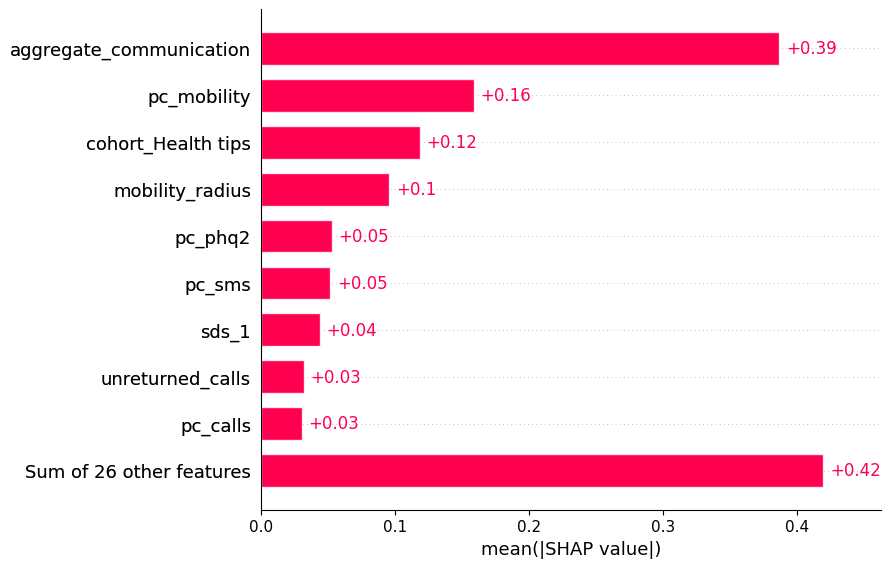

v1_week both HistGradientBoostingRegressor Mean R2: 0.432


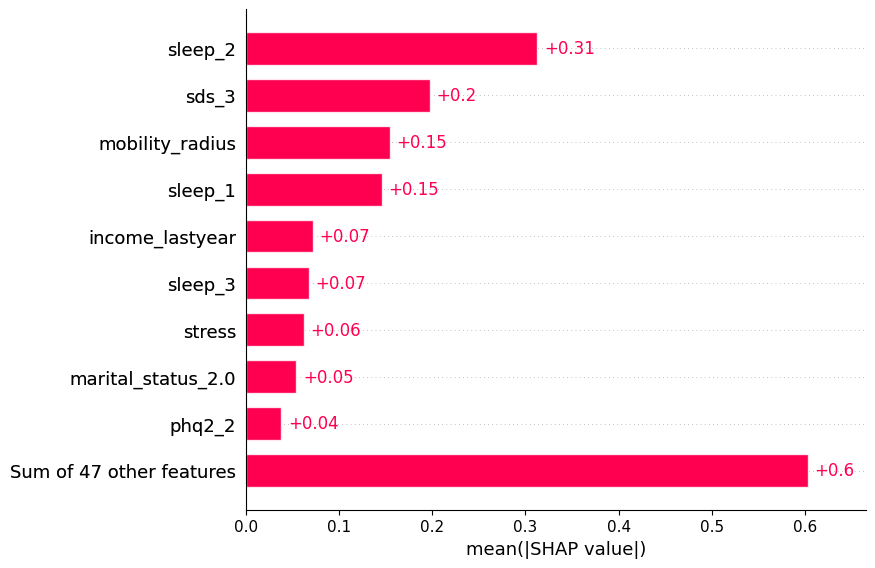

v1_week top 15 ANOVA HistGradientBoostingRegressor Mean R2: 0.41


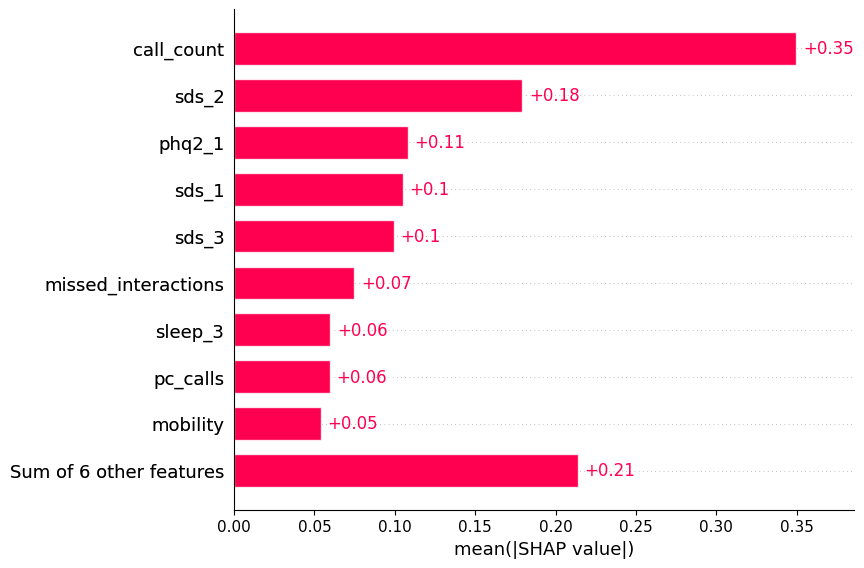

v2_week 8wks HistGradientBoostingRegressor Mean R2: 0.396


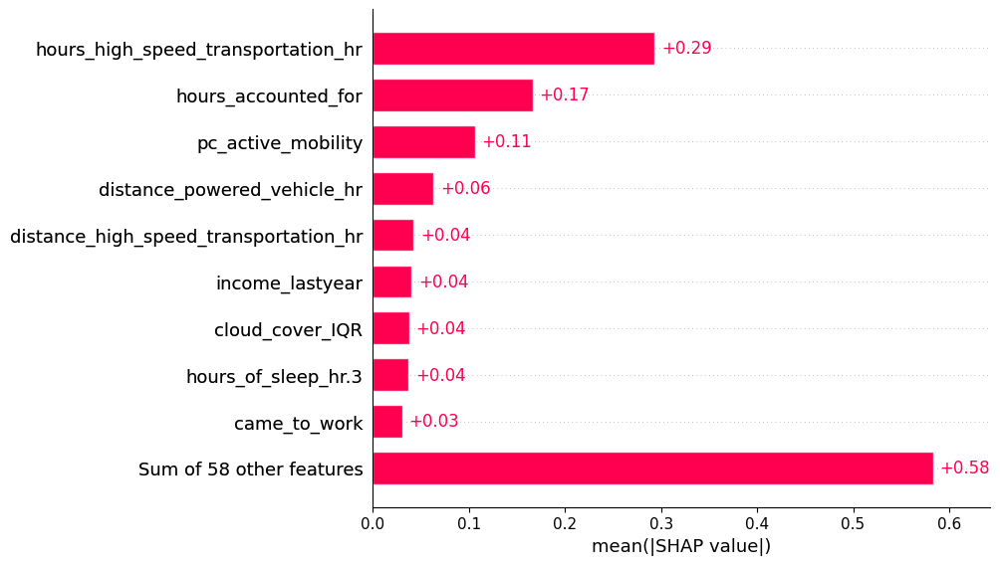

v2_week both HistGradientBoostingRegressor Mean R2: 0.396


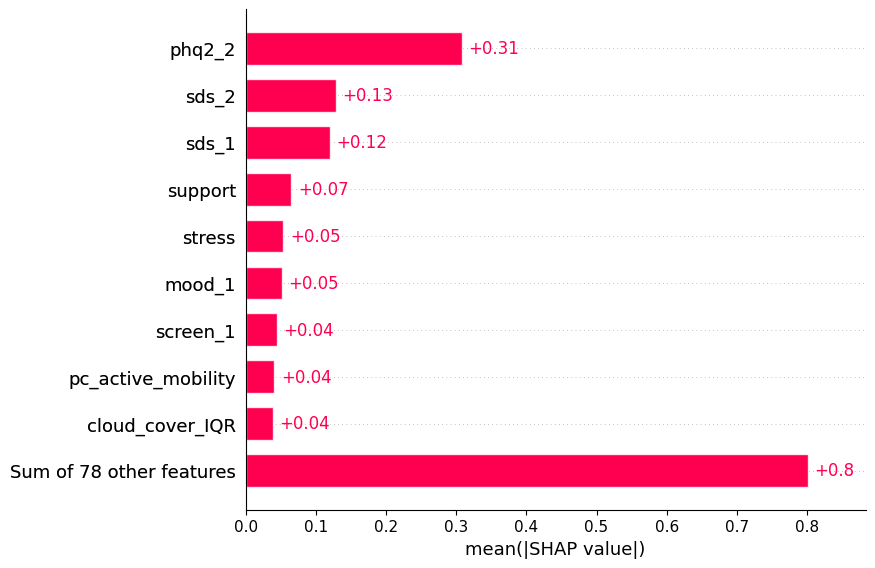

v2_week top 15 ANOVA HistGradientBoostingRegressor Mean R2: 0.29


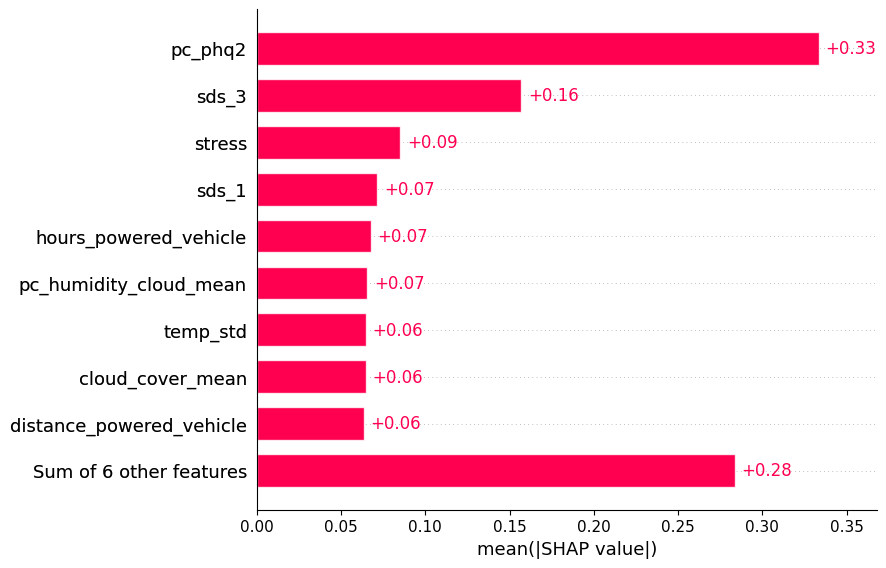

In [135]:
# SHAP Printing -- do after above, can't run without first making results {}
import gc 

for name in ['v1_week', 'v2_week']: #4
	for y_col in ['phq9_sum']: #2
		for time in ['8wks','both','top 15 ANOVA']: #3
			for model_name in models: #only one atm 
				mean_r2 = round(np.mean(model_dict[name][y_col][time][model_name]['r2_scores']), 3)
				print(name, time, model_name, f'Mean R2: {mean_r2}')
				i=0 #change based on which CV you want to see
				df = model_dict[name][y_col][time][model_name]['X_test'][i]
				df_model = df[[col for col in df.columns if col not in id_columns]]
				explainer = shap.Explainer(model_dict[name][y_col][time][model_name]['model'][i], approximate=True)
				shap_values = explainer(df_model, check_additivity=False)
				shap.plots.bar(shap_values)
				del explainer, shap_values
				gc.collect()


In [12]:
for name in ['v1_week', 'v2_week']: #4
	for y_col in ['phq9_sum']: #2
		for time in ['8wks','both','anova_15']: #3
			for model_name in models: #only one atm 

				X_test = model_dict[name][y_col][time][model_name]['X_test'][0]
				assert 'num_id' in X_test.columns.to_list()
				assert 'day' in X_test.columns.to_list()



In [14]:
print('Run on:', dt.datetime.today().strftime('%a %d %b %Y, %I:%M%p'))

import gc 
num_to_show=2

for name in ['v1_week', 'v2_week']: #4
	for y_col in ['phq9_sum']: #2
		for time in ['8wks','both','anova_15']: #3
			for model_name in models: #only one atm 
				num_shown=0
				mean_r2 = round(np.mean(model_dict[name][y_col][time][model_name]['r2_scores']), 3)
				print(name, time, model_name, f'Mean R2: {mean_r2}')
				i=0 #change based on which CV you want to see
				# df = model_dict[name][y_col][time][model_name]['X_test'][i]
				# df_model = df[[col for col in df.columns if col not in id_columns]]
				# explainer = shap.Explainer(model_dict[name][y_col][time][model_name]['model'][i], approximate=True)
				# shap_values = explainer(df_model, check_additivity=False)
				# shap.plots.bar(shap_values)
				# del explainer, shap_values
				# gc.collect()  

				X_test = model_dict[name][y_col][time][model_name]['X_test'][i]
				y_pred = model_dict[name][y_col][time][model_name]['y_pred'][i]
				y_test = model_dict[name][y_col][time][model_name]['y_test'][i]

				Xy = pd.read_csv(os.path.join(brighten_dir, f'{name}_trainval_pca.csv'))

				y_df = pd.DataFrame({
					f'{y_col}_pred': y_pred, 
					f'{y_col}_actual': y_test.values
					}, index=y_test.index)

				meta = Xy.loc[y_test.index, ['num_id', 'day', 'week']]
				X_test_no_ids = X_test.drop(columns=[col for col in id_columns if col in X_test.columns])
				X_test_no_ids = X_test_no_ids.set_index(y_test.index) if not X_test_no_ids.index.equals(y_test.index) else X_test_no_ids

				df = pd.concat([meta, X_test_no_ids, y_df], axis=1)

				# verify no duplicate columns
				assert not df.columns.duplicated().any(), f"Duplicate cols: {df.columns[df.columns.duplicated()].tolist()}"

				for sub, sub_df in df.groupby('num_id'):
					if len(sub_df.dropna(subset=f'{y_col}_pred'))==0:
						continue
					
					if num_shown<=num_to_show:
						sub_df = sub_df.sort_values(by='day')

						fig = px.line(sub_df, x='day', y=[f'{y_col}_pred', f'{y_col}_actual'], 
						title=f'For sub {sub}, using {X_test.shape[1]} {time} features,  pred. vs. actual {y_col} score -- Mean R2 = {mean_r2} over 5 CVs')

						fig.show()
						num_shown+=1



			

Run on: Mon 13 Apr 2026, 08:31AM
v1_week 8wks HistGradientBoostingRegressor Mean R2: 0.445


v1_week both HistGradientBoostingRegressor Mean R2: 0.432


v1_week anova_15 HistGradientBoostingRegressor Mean R2: 0.41


v2_week 8wks HistGradientBoostingRegressor Mean R2: 0.396


v2_week both HistGradientBoostingRegressor Mean R2: 0.396


v2_week anova_15 HistGradientBoostingRegressor Mean R2: 0.29


# NO PHQ2 or other related variables (SDS, stress, mood)


In [16]:

y_cols = ['phq9_sum']
drop_survey_cols = ['phq2_1','phq2_2','phq2_sum','phq2_bin','sds_1','sds_2','sds_3','stress','support','mhs_1','mhs_2','mhs_3','mhs_4','mhs_5'] #sum up the MHS vars
end_cols = ['6wks_depressed_binary', 'depression_change_bin']
drop_cols_base = y_cols+drop_survey_cols+end_cols
drop_cols_with_this_present = ['phq9','Unnamed','_nan','_indicator','race','season','cohort'] #take out race because it adds 8 vars

time_cols = ['month','week','day']

models = {
	'HistGradientBoostingRegressor': [HistGradientBoostingRegressor(), HistGradientBoostingClassifier()]
}


time = 'only_sensor'

for name in ['v1_week','v2_week']:
	
	print(f'\n\n####### {name} #######')
	for y_col in y_cols:
		
		Xy=pd.read_csv(os.path.join(brighten_dir, f'{name}_trainval_pca.csv'))

		Xy=Xy.dropna(subset=[y_col])
		Xy=Xy.select_dtypes(include=('int64','float64'))
		print(f"Cols in Xy: {Xy.columns.to_list()}")
		y=Xy[y_col]
		baseline_cols_present = matches = [item for item in Xy.columns if any(col in item for col in baseline_cols)]
		drop_cols = drop_cols_base.copy()
		drop_additional_cols = [item for item in Xy.columns if any(col in item for col in drop_cols_with_this_present)]
		drop_cols += drop_additional_cols		


		print(f'\n{time.upper()}')
		model_dict[name][y_col][time] = {}
		if 'baseline' in time:
			X1=Xy[['num_id']+time_cols+baseline_cols_present].copy()
			
		elif '8wks' in time:
			drop_cols = [col for col in drop_cols if col in Xy.columns]
			X1 = Xy.drop(columns=[col for col in baseline_cols_present+drop_cols if col not in id_columns] ).copy()
		else:
			drop_cols = [col for col in drop_cols if col in Xy.columns]
			X1=Xy.drop(columns=[col for col in drop_cols if col not in id_columns])
		
		# Inputs
		groups = Xy['num_id']
		gkf = GroupKFold(n_splits=5)
		count=0
		print(f'X has {X1.shape[0]} observations, {X1.shape[1]} features')
		print(f'Cols in X: {X1.columns.to_list()}')


		# print('models...')
		for model_name in models:
			model_dict[name][y_col][time][model_name] = {}
			model_dict[name][y_col][time][model_name]['model']=[]
			model_dict[name][y_col][time][model_name]['X_test']=[]
			model_dict[name][y_col][time][model_name]['X_test_for_model']=[]
			model_dict[name][y_col][time][model_name]['r2_scores']=[]
			model_dict[name][y_col][time][model_name]['mae_scores']=[]
			model_dict[name][y_col][time][model_name]['y_pred']=[]
			model_dict[name][y_col][time][model_name]['y_test']=[]
			model_dict[name][y_col][time][model_name]['y_val']=[]
			model_dict[name][y_col][time][model_name]['y_valpred']=[]

			
			for train_idx, test_idx in gkf.split(X1, y, groups):
				X_train, X_test = X1.iloc[train_idx], X1.iloc[test_idx]
				y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
				model_dict[name][y_col][time][model_name]['y_test'].append(y_test)
				model_dict[name][y_col][time][model_name]['X_test'].append(X_test)


				model = models[model_name][0]
				if y_col in ['change_cat','change_binary']:
					model= models[model_name][1]
				
				present_time_cols = [col for col in time_cols+id_columns if col in X_train.columns]
				X_train_for_model = X_train.drop(columns=present_time_cols)
				if count==0:
					print(f'cols for {X_train_for_model.columns.to_list()}')
					print(f'First CV\n{len(X_train)} observations in X_train, {len(X_test)} in X_test. {X_train['num_id'].nunique()} train subs, {X_test['num_id'].nunique()} test subs')
					print(f'Features in X_train_for_model: {X_train_for_model.columns.to_list()}')
					print(f'Train Subjects ({len(set(list(X_train['num_id'])))}) {set(list(X_train['num_id']))}')
					print(f'Test Subjects ({len(set(list(X_test['num_id'])))}): {set(list(X_test['num_id']))}')
					if len(set(list(X_train['num_id'])+list(X_test['num_id']))) == len(set(list(X_train['num_id']))) + len(set(list(X_test['num_id']))):
						print(f'All subjects in each set are unique')
					else:
						print(f"Overlapping subjects")
					count=1


				model.fit(X_train_for_model, y_train)
				assert list(model.feature_names_in_) == list(X_train_for_model.columns), f"Feature mismatch before saving model for {time}"
				model_dict[name][y_col][time][model_name]['model'].append(model)
				
				X_test_for_model = X_test.drop(columns=[col for col in time_cols+id_columns if col in X_test.columns])
				model_dict[name][y_col][time][model_name]['X_test_for_model'].append(X_test_for_model)

				y_pred = model.predict(X_test_for_model)

				model_dict[name][y_col][time][model_name]['y_pred'].append(y_pred)

				r2 = r2_score(y_test, y_pred)
				model_dict[name][y_col][time][model_name]['r2_scores'].append(r2)

				mae = mean_absolute_error(y_test, y_pred)
				model_dict[name][y_col][time][model_name]['mae_scores'].append(mae)
				

			print(f"{y_col} from {time} -- mean R²: {round(np.mean(model_dict[name][y_col][time][model_name]['r2_scores']), 4)}, mean MAE: {round(np.mean(model_dict[name][y_col][time][model_name]['mae_scores']), 4)} of scores [{round(y.min(), 1)}-{round(y.max(), 1)}]")
			
			# X_val = val_df[[col for col in val_df.columns if col in X_test]]
			# X_val_for_model = val_df[[col for col in X_val.columns if col in X_test_for_model]]
			# X_val_for_model = X_val_for_model[X_test_for_model.columns]
			# yval_pred = model.predict(X_val_for_model)
			# model_dict[name][y_col][time][model_name]['y_valpred'].append(yval_pred)
			# yval_true = val_df[y_col]
			# model_dict[name][y_col][time][model_name]['y_val'].append(yval_true)
			
			# r2 = r2_score(y_test, y_pred)
			# print(f"FOR VAL:: {y_col} from {time} -- R²: {r2}")









####### v1_week #######
Cols in Xy: ['mobility', 'mobility_radius', 'unreturned_calls', 'sms_count', 'aggregate_communication', 'call_duration', 'call_count', 'missed_interactions', 'sms_length', 'interaction_diversity', 'sleep_1', 'sds_1', 'stress', 'phq9_9_base', 'phq9_1_base', 'phq9_5_base', 'education', 'sleep_3', 'phq9_4_base', 'support', 'phq9_8_base', 'phq9_7_base', 'phq9_3_base', 'sds_3', 'income_satisfaction', 'phq9_2_base', 'phq9_6_base', 'sds_2', 'sleep_2', 'phq2_1', 'phq2_2', 'phq2_sum', 'phq9_1', 'phq9_2', 'phq9_3', 'phq9_4', 'phq9_5', 'phq9_6', 'phq9_7', 'phq9_8', 'phq9_9', 'phq9_sum', 'Unnamed: 0', 'num_id', 'month', 'week', 'day', 'day_of_week', 'cohort_Akili', 'cohort_Health tips', 'cohort_PST', 'gender_0.0', 'gender_1.0', 'marital_status_0.0', 'marital_status_1.0', 'marital_status_2.0', 'race_0.0', 'race_1.0', 'race_2.0', 'race_3.0', 'race_4.0', 'race_5.0', 'race_6.0', 'season_fall', 'season_spring', 'season_summer', 'season_winter', 'season_num_1.0', 'season_num_1.

v1_week 8wks HistGradientBoostingRegressor Mean R2: 0.445


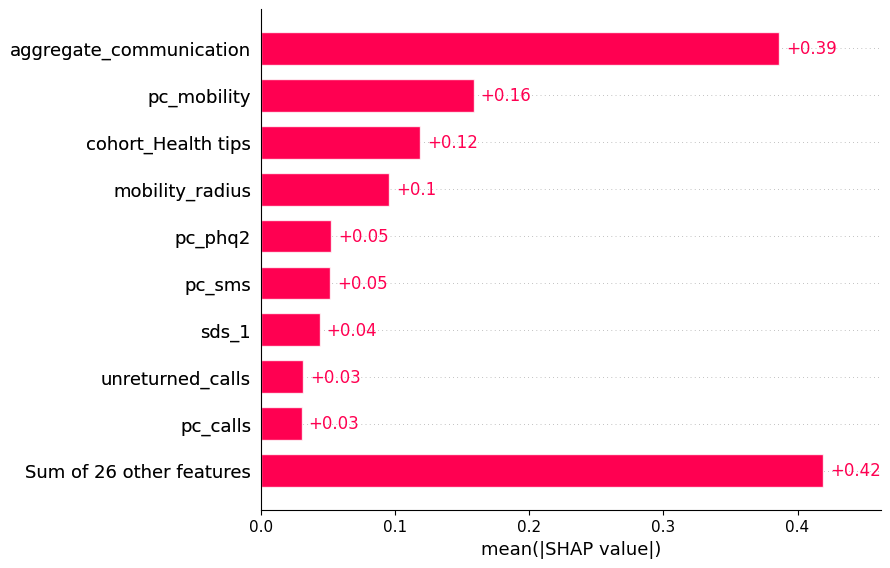

['hours_walking', 'distance_high_speed_transportation_hr', 'distance_active', 'distance_powered_vehicle_hr', 'distance_active_hr', 'hours_accounted_for', 'location_variance_hr', 'distance_walking', 'hours_high_speed_transportation_hr', 'hours_high_speed_transportation', 'came_to_work', 'distance_powered_vehicle', 'location_variance', 'hours_active_hr', 'hours_powered_vehicle_hr', 'distance_walking_hr', 'precip_sum', 'distance_high_speed_transportation', 'hours_powered_vehicle', 'hours_active', 'hours_of_sleep_hr', 'humidity_median', 'dew_point_median', 'cloud_cover_mean', 'hours_of_sleep', 'cloud_cover_median', 'humidity_IQR', 'humidity_std', 'dew_point_IQR', 'cloud_cover_std', 'cloud_cover_IQR', 'dew_point_std', 'temp_mean', 'humidity_mean', 'temp_IQR', 'dew_point_mean', 'temp_median', 'temp_std', 'education', 'income_satisfaction', 'num_id', 'hours_of_sleep_hr.1', 'gender_0.0', 'gender_1.0', 'marital_status_0.0', 'marital_status_1.0', 'marital_status_2.0', 'race_0.0', 'race_1.0', 'ra

v1_week both HistGradientBoostingRegressor Mean R2: 0.432


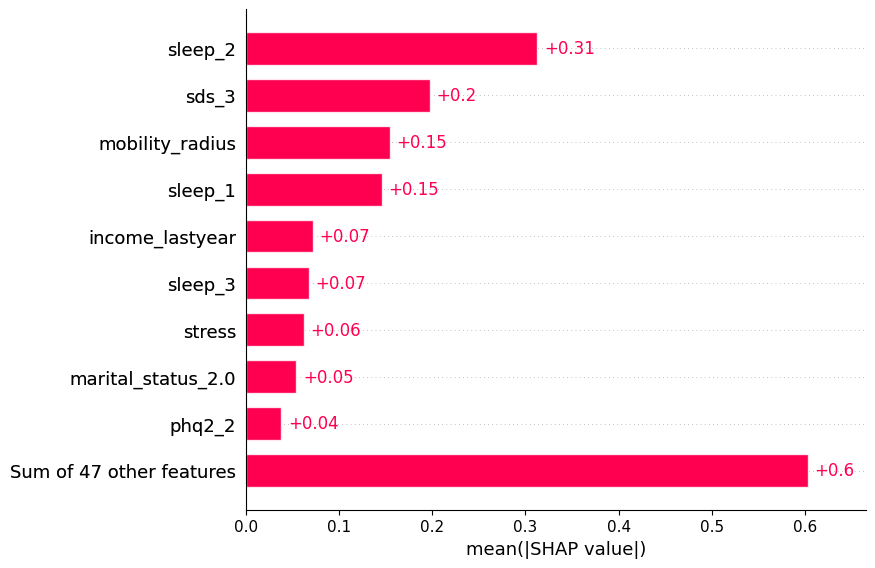

['hours_walking', 'distance_high_speed_transportation_hr', 'distance_active', 'distance_powered_vehicle_hr', 'distance_active_hr', 'hours_accounted_for', 'location_variance_hr', 'distance_walking', 'hours_high_speed_transportation_hr', 'hours_high_speed_transportation', 'came_to_work', 'distance_powered_vehicle', 'location_variance', 'hours_active_hr', 'hours_powered_vehicle_hr', 'distance_walking_hr', 'precip_sum', 'distance_high_speed_transportation', 'hours_powered_vehicle', 'hours_active', 'hours_of_sleep_hr', 'humidity_median', 'dew_point_median', 'cloud_cover_mean', 'hours_of_sleep', 'cloud_cover_median', 'humidity_IQR', 'humidity_std', 'dew_point_IQR', 'cloud_cover_std', 'cloud_cover_IQR', 'dew_point_std', 'temp_mean', 'humidity_mean', 'temp_IQR', 'dew_point_mean', 'temp_median', 'temp_std', 'education', 'income_satisfaction', 'num_id', 'hours_of_sleep_hr.1', 'gender_0.0', 'gender_1.0', 'marital_status_0.0', 'marital_status_1.0', 'marital_status_2.0', 'race_0.0', 'race_1.0', 'ra

v1_week only_sensor HistGradientBoostingRegressor Mean R2: 0.279


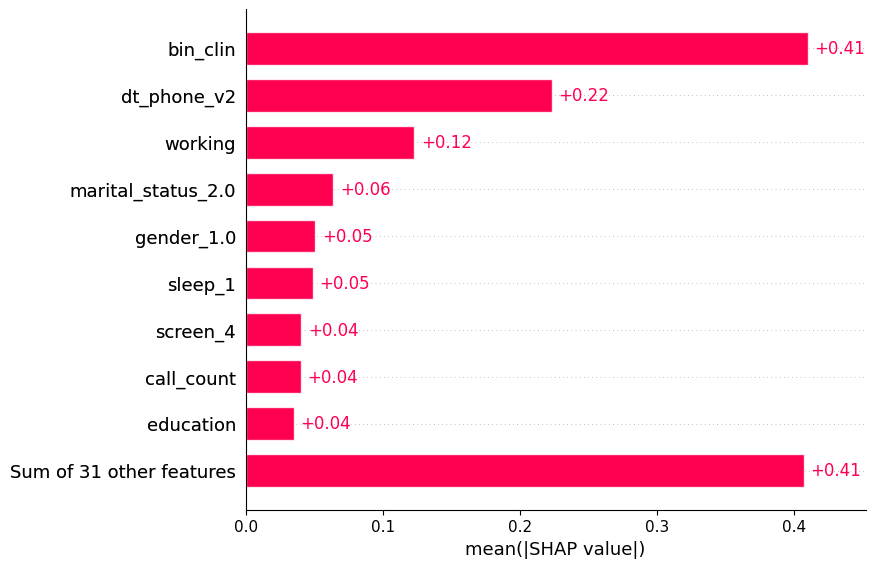

['hours_walking', 'distance_high_speed_transportation_hr', 'distance_active', 'distance_powered_vehicle_hr', 'distance_active_hr', 'hours_accounted_for', 'location_variance_hr', 'distance_walking', 'hours_high_speed_transportation_hr', 'hours_high_speed_transportation', 'came_to_work', 'distance_powered_vehicle', 'location_variance', 'hours_active_hr', 'hours_powered_vehicle_hr', 'distance_walking_hr', 'precip_sum', 'distance_high_speed_transportation', 'hours_powered_vehicle', 'hours_active', 'hours_of_sleep_hr', 'humidity_median', 'dew_point_median', 'cloud_cover_mean', 'hours_of_sleep', 'cloud_cover_median', 'humidity_IQR', 'humidity_std', 'dew_point_IQR', 'cloud_cover_std', 'cloud_cover_IQR', 'dew_point_std', 'temp_mean', 'humidity_mean', 'temp_IQR', 'dew_point_mean', 'temp_median', 'temp_std', 'education', 'income_satisfaction', 'hours_of_sleep_hr.1', 'gender_0.0', 'gender_1.0', 'marital_status_0.0', 'marital_status_1.0', 'marital_status_2.0', 'hours_of_sleep_hr.2', 'hours_of_slee

v1_week anova_15 HistGradientBoostingRegressor Mean R2: 0.41


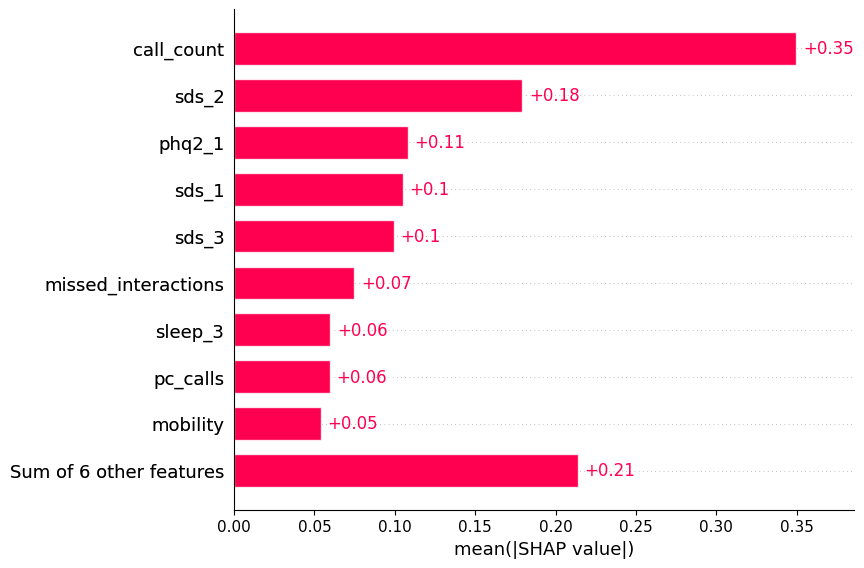

['sds_3', 'stress', 'sds_2', 'support', 'dew_point_IQR', 'sds_1', 'pc_phq2', 'phq2_sum', 'distance_active_hr', 'distance_powered_vehicle', 'temp_std', 'cloud_cover_mean', 'pc_humidity_cloud_mean', 'mood_1', 'hours_powered_vehicle'] 



v2_week 8wks HistGradientBoostingRegressor Mean R2: 0.396


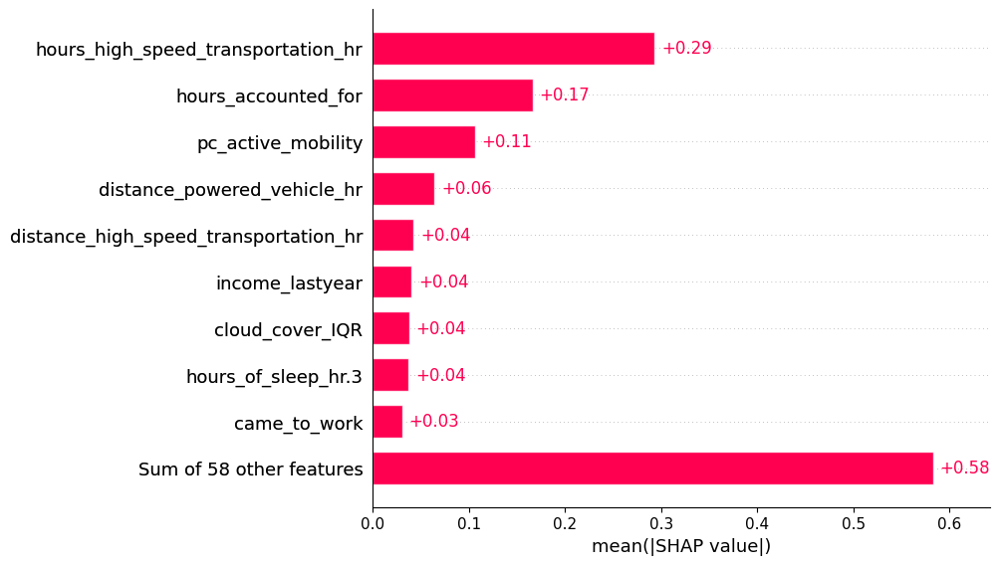

['hours_walking', 'distance_high_speed_transportation_hr', 'distance_active', 'distance_powered_vehicle_hr', 'distance_active_hr', 'hours_accounted_for', 'location_variance_hr', 'distance_walking', 'hours_high_speed_transportation_hr', 'hours_high_speed_transportation', 'came_to_work', 'distance_powered_vehicle', 'location_variance', 'hours_active_hr', 'hours_powered_vehicle_hr', 'distance_walking_hr', 'precip_sum', 'distance_high_speed_transportation', 'hours_powered_vehicle', 'hours_active', 'hours_of_sleep_hr', 'humidity_median', 'dew_point_median', 'cloud_cover_mean', 'hours_of_sleep', 'cloud_cover_median', 'humidity_IQR', 'humidity_std', 'dew_point_IQR', 'cloud_cover_std', 'cloud_cover_IQR', 'dew_point_std', 'temp_mean', 'humidity_mean', 'temp_IQR', 'dew_point_mean', 'temp_median', 'temp_std', 'education', 'income_satisfaction', 'num_id', 'hours_of_sleep_hr.1', 'gender_0.0', 'gender_1.0', 'marital_status_0.0', 'marital_status_1.0', 'marital_status_2.0', 'race_0.0', 'race_1.0', 'ra

v2_week both HistGradientBoostingRegressor Mean R2: 0.396


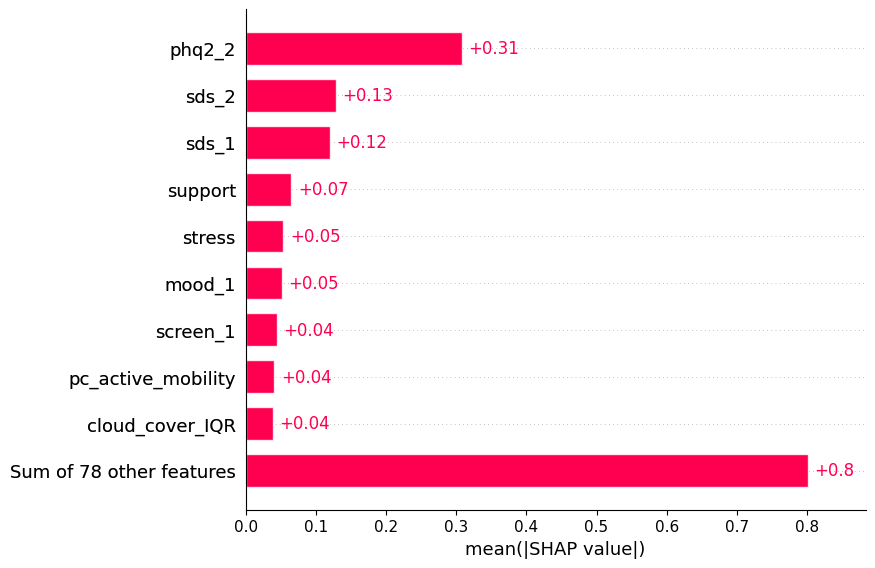

['hours_walking', 'distance_high_speed_transportation_hr', 'distance_active', 'distance_powered_vehicle_hr', 'distance_active_hr', 'hours_accounted_for', 'location_variance_hr', 'distance_walking', 'hours_high_speed_transportation_hr', 'hours_high_speed_transportation', 'came_to_work', 'distance_powered_vehicle', 'location_variance', 'hours_active_hr', 'hours_powered_vehicle_hr', 'distance_walking_hr', 'precip_sum', 'distance_high_speed_transportation', 'hours_powered_vehicle', 'hours_active', 'hours_of_sleep_hr', 'humidity_median', 'dew_point_median', 'cloud_cover_mean', 'hours_of_sleep', 'cloud_cover_median', 'humidity_IQR', 'humidity_std', 'dew_point_IQR', 'cloud_cover_std', 'cloud_cover_IQR', 'dew_point_std', 'temp_mean', 'humidity_mean', 'temp_IQR', 'dew_point_mean', 'temp_median', 'temp_std', 'education', 'income_satisfaction', 'num_id', 'hours_of_sleep_hr.1', 'gender_0.0', 'gender_1.0', 'marital_status_0.0', 'marital_status_1.0', 'marital_status_2.0', 'race_0.0', 'race_1.0', 'ra

v2_week only_sensor HistGradientBoostingRegressor Mean R2: 0.255


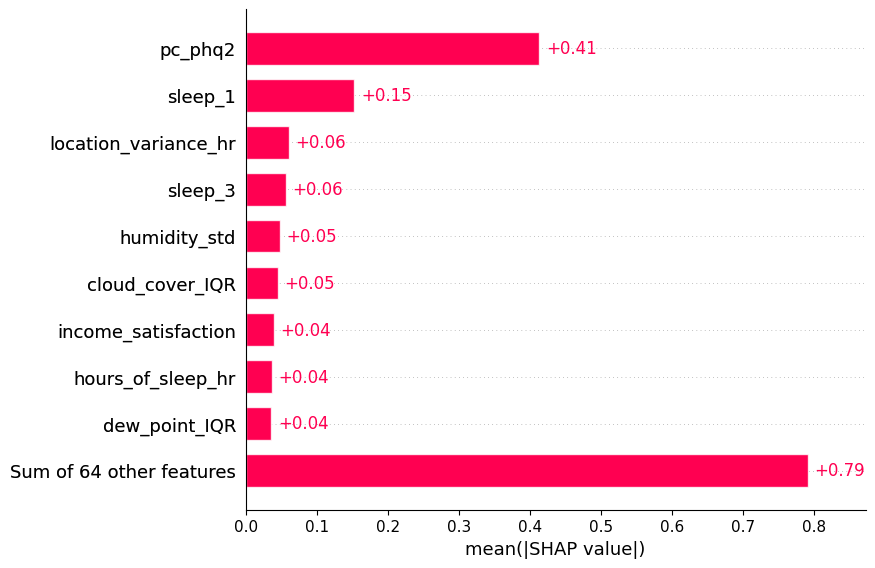

['hours_walking', 'distance_high_speed_transportation_hr', 'distance_active', 'distance_powered_vehicle_hr', 'distance_active_hr', 'hours_accounted_for', 'location_variance_hr', 'distance_walking', 'hours_high_speed_transportation_hr', 'hours_high_speed_transportation', 'came_to_work', 'distance_powered_vehicle', 'location_variance', 'hours_active_hr', 'hours_powered_vehicle_hr', 'distance_walking_hr', 'precip_sum', 'distance_high_speed_transportation', 'hours_powered_vehicle', 'hours_active', 'hours_of_sleep_hr', 'humidity_median', 'dew_point_median', 'cloud_cover_mean', 'hours_of_sleep', 'cloud_cover_median', 'humidity_IQR', 'humidity_std', 'dew_point_IQR', 'cloud_cover_std', 'cloud_cover_IQR', 'dew_point_std', 'temp_mean', 'humidity_mean', 'temp_IQR', 'dew_point_mean', 'temp_median', 'temp_std', 'education', 'income_satisfaction', 'hours_of_sleep_hr.1', 'gender_0.0', 'gender_1.0', 'marital_status_0.0', 'marital_status_1.0', 'marital_status_2.0', 'hours_of_sleep_hr.2', 'hours_of_slee

v2_week anova_15 HistGradientBoostingRegressor Mean R2: 0.29


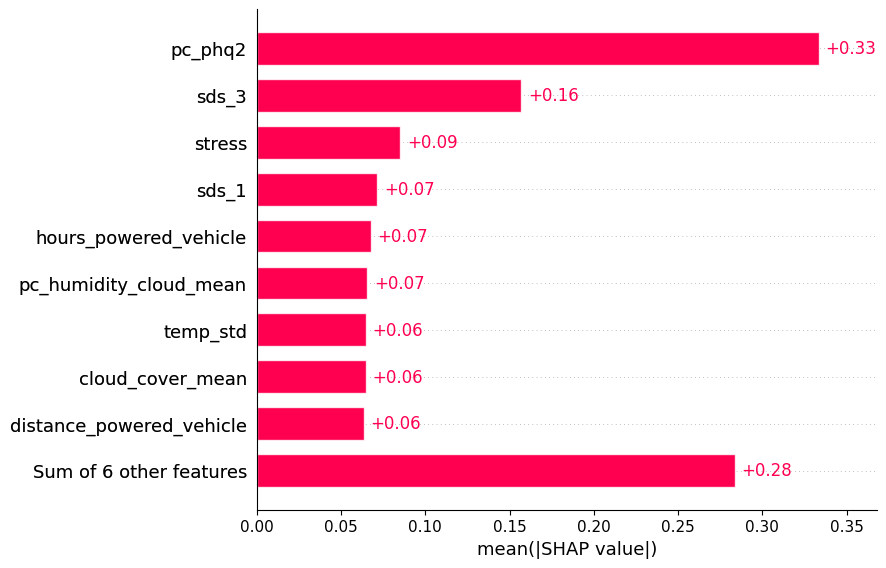

['sds_3', 'stress', 'sds_2', 'support', 'dew_point_IQR', 'sds_1', 'pc_phq2', 'phq2_sum', 'distance_active_hr', 'distance_powered_vehicle', 'temp_std', 'cloud_cover_mean', 'pc_humidity_cloud_mean', 'mood_1', 'hours_powered_vehicle'] 



In [17]:
#where i stopped mon apr 13 1:09am
import gc 

subject_scores = []

for name in ['v1_week','v2_week']: #4
	for y_col in ['phq9_sum']: #2
		for time in ['8wks','both','only_sensor','anova_15']: #3
			for model_name in models: #only one atm 
				mean_r2 = round(np.mean(model_dict[name][y_col][time][model_name]['r2_scores']), 3)
				print(name, time, model_name, f'Mean R2: {mean_r2}')
				i=0 #change based on which CV you want to see
				model = model_dict[name][y_col][time][model_name]['model'][i]
				explainer = shap.Explainer(model_dict[name][y_col][time][model_name]['model'][i], approximate=True)
				test_df = model_dict[name][y_col][time][model_name]['X_test'][i]
				x_test_for_model = test_df.drop(columns=[col for col in test_df.columns if col in id_columns])
				shap_values = explainer(x_test_for_model, check_additivity=False)
				shap.plots.bar(shap_values)
				del explainer, shap_values
				gc.collect()  

				X_test = model_dict[name][y_col][time][model_name]['X_test'][i] # use X_test for the plotting bc it has the day/week variable
				y_pred = model_dict[name][y_col][time][model_name]['y_pred'][i]
				y_test = model_dict[name][y_col][time][model_name]['y_test'][i]

				y_df = pd.DataFrame({f'{y_col}_pred': y_pred, f'{y_col}_actual': y_test})
				df = pd.concat([X_test, y_df], axis=1)

				print(list(model.feature_names_in_), '\n')

				
				for sub, sub_df in df.groupby('num_id'):
					if len(sub_df.dropna(subset=f'{y_col}_pred'))<3:
						continue

					sub_df = sub_df.sort_values(by='day')

					r2_score_sub = r2_score(list(sub_df[f'{y_col}_actual']), list(sub_df[f'{y_col}_pred']))
					pmc_score_sub = pearsonr(list(sub_df[f'{y_col}_actual']), list(sub_df[f'{y_col}_pred']))

					fig = px.line(sub_df, x='day', y=[f'{y_col}_pred', f'{y_col}_actual'], 
					title=f'Sub {sub}, {X_test.shape[1]} {time} feats, pred. vs. actual {y_col} score | R2:{round(r2_score_sub, 2)}, PMC:{round(pmc_score_sub[0], 2)}')

					fig.show()

					subject_scores.append([name, y_col, time, model_name, sub, r2_score_sub, pmc_score_sub[0]])

subject_scores_df = pd.DataFrame(subject_scores, columns=['name', 'y_col', 'time', 'model_name', 'sub', 'r2_score_sub', 'pmc_score_sub'])
subject_scores_df.to_csv(os.path.join(results_dir, 'subject_phq9_preds_from_diff_models.csv'))

v1_week <class 'type'> HistGradientBoostingRegressor Mean R2: 0.445


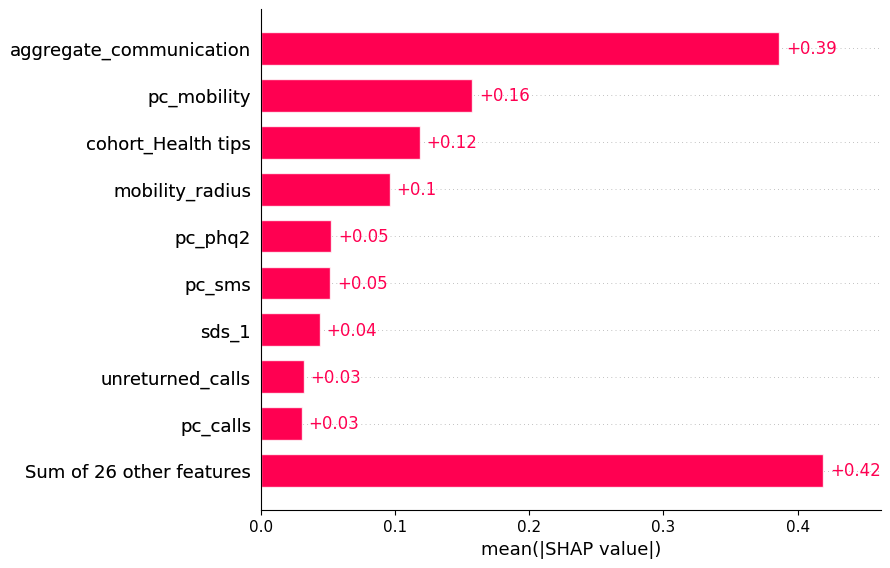

['hours_walking', 'distance_high_speed_transportation_hr', 'distance_active', 'distance_powered_vehicle_hr', 'distance_active_hr', 'hours_accounted_for', 'location_variance_hr', 'distance_walking', 'hours_high_speed_transportation_hr', 'hours_high_speed_transportation', 'came_to_work', 'distance_powered_vehicle', 'location_variance', 'hours_active_hr', 'hours_powered_vehicle_hr', 'distance_walking_hr', 'precip_sum', 'distance_high_speed_transportation', 'hours_powered_vehicle', 'hours_active', 'hours_of_sleep_hr', 'humidity_median', 'dew_point_median', 'cloud_cover_mean', 'hours_of_sleep', 'cloud_cover_median', 'humidity_IQR', 'humidity_std', 'dew_point_IQR', 'cloud_cover_std', 'cloud_cover_IQR', 'dew_point_std', 'temp_mean', 'humidity_mean', 'temp_IQR', 'dew_point_mean', 'temp_median', 'temp_std', 'education', 'income_satisfaction', 'num_id', 'hours_of_sleep_hr.1', 'gender_0.0', 'gender_1.0', 'marital_status_0.0', 'marital_status_1.0', 'marital_status_2.0', 'race_0.0', 'race_1.0', 'ra

v1_week <class 'type'> HistGradientBoostingRegressor Mean R2: 0.432


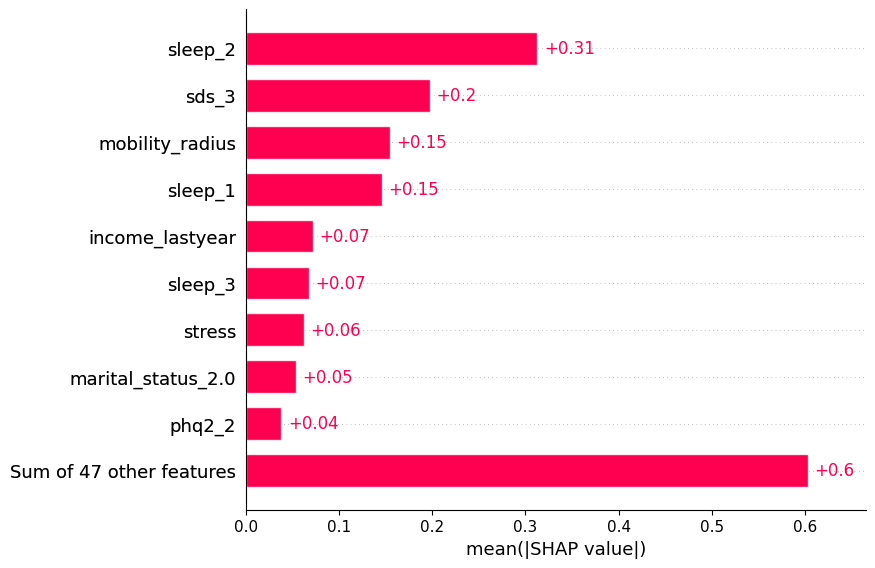

['hours_walking', 'distance_high_speed_transportation_hr', 'distance_active', 'distance_powered_vehicle_hr', 'distance_active_hr', 'hours_accounted_for', 'location_variance_hr', 'distance_walking', 'hours_high_speed_transportation_hr', 'hours_high_speed_transportation', 'came_to_work', 'distance_powered_vehicle', 'location_variance', 'hours_active_hr', 'hours_powered_vehicle_hr', 'distance_walking_hr', 'precip_sum', 'distance_high_speed_transportation', 'hours_powered_vehicle', 'hours_active', 'hours_of_sleep_hr', 'humidity_median', 'dew_point_median', 'cloud_cover_mean', 'hours_of_sleep', 'cloud_cover_median', 'humidity_IQR', 'humidity_std', 'dew_point_IQR', 'cloud_cover_std', 'cloud_cover_IQR', 'dew_point_std', 'temp_mean', 'humidity_mean', 'temp_IQR', 'dew_point_mean', 'temp_median', 'temp_std', 'education', 'income_satisfaction', 'num_id', 'hours_of_sleep_hr.1', 'gender_0.0', 'gender_1.0', 'marital_status_0.0', 'marital_status_1.0', 'marital_status_2.0', 'race_0.0', 'race_1.0', 'ra

v2_week <class 'type'> HistGradientBoostingRegressor Mean R2: 0.396


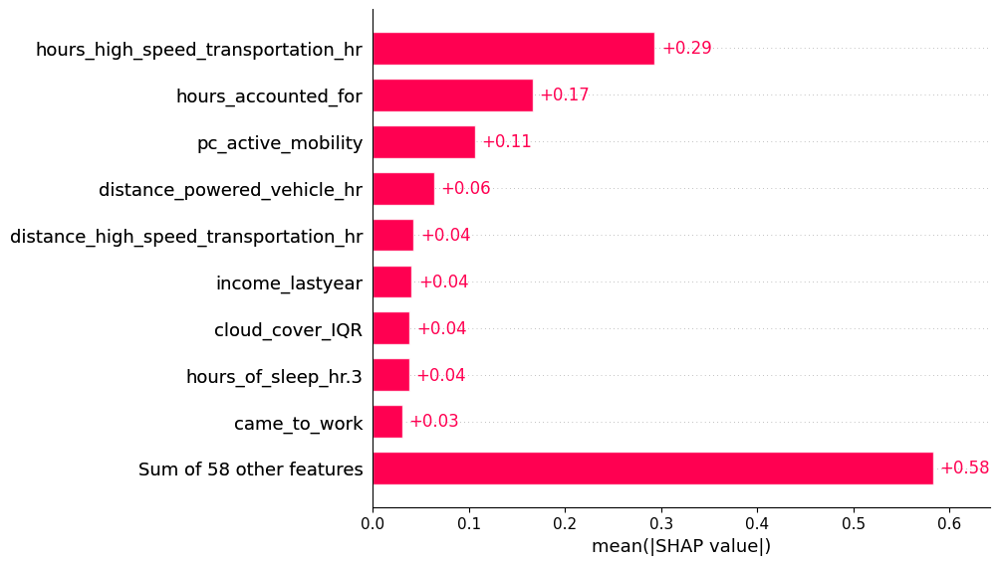

['hours_walking', 'distance_high_speed_transportation_hr', 'distance_active', 'distance_powered_vehicle_hr', 'distance_active_hr', 'hours_accounted_for', 'location_variance_hr', 'distance_walking', 'hours_high_speed_transportation_hr', 'hours_high_speed_transportation', 'came_to_work', 'distance_powered_vehicle', 'location_variance', 'hours_active_hr', 'hours_powered_vehicle_hr', 'distance_walking_hr', 'precip_sum', 'distance_high_speed_transportation', 'hours_powered_vehicle', 'hours_active', 'hours_of_sleep_hr', 'humidity_median', 'dew_point_median', 'cloud_cover_mean', 'hours_of_sleep', 'cloud_cover_median', 'humidity_IQR', 'humidity_std', 'dew_point_IQR', 'cloud_cover_std', 'cloud_cover_IQR', 'dew_point_std', 'temp_mean', 'humidity_mean', 'temp_IQR', 'dew_point_mean', 'temp_median', 'temp_std', 'education', 'income_satisfaction', 'num_id', 'hours_of_sleep_hr.1', 'gender_0.0', 'gender_1.0', 'marital_status_0.0', 'marital_status_1.0', 'marital_status_2.0', 'race_0.0', 'race_1.0', 'ra

v2_week <class 'type'> HistGradientBoostingRegressor Mean R2: 0.396


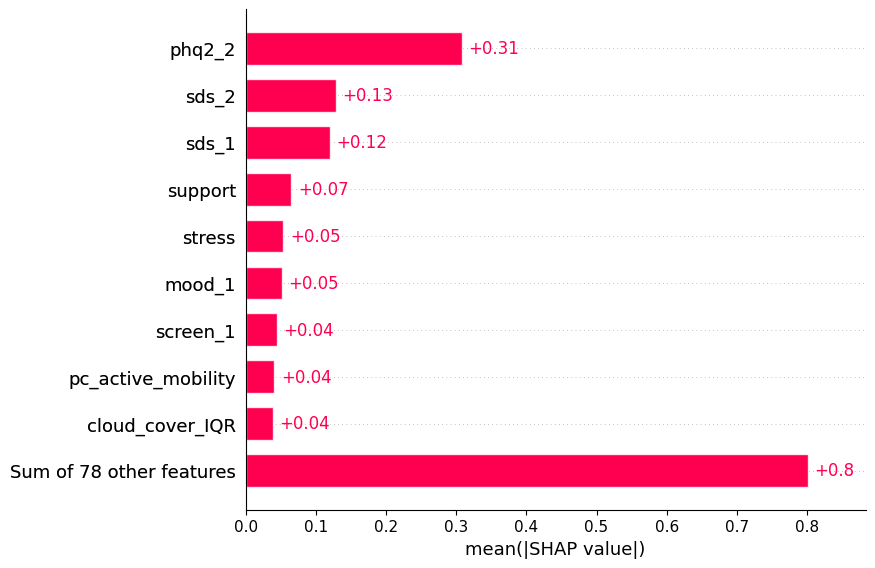

['hours_walking', 'distance_high_speed_transportation_hr', 'distance_active', 'distance_powered_vehicle_hr', 'distance_active_hr', 'hours_accounted_for', 'location_variance_hr', 'distance_walking', 'hours_high_speed_transportation_hr', 'hours_high_speed_transportation', 'came_to_work', 'distance_powered_vehicle', 'location_variance', 'hours_active_hr', 'hours_powered_vehicle_hr', 'distance_walking_hr', 'precip_sum', 'distance_high_speed_transportation', 'hours_powered_vehicle', 'hours_active', 'hours_of_sleep_hr', 'humidity_median', 'dew_point_median', 'cloud_cover_mean', 'hours_of_sleep', 'cloud_cover_median', 'humidity_IQR', 'humidity_std', 'dew_point_IQR', 'cloud_cover_std', 'cloud_cover_IQR', 'dew_point_std', 'temp_mean', 'humidity_mean', 'temp_IQR', 'dew_point_mean', 'temp_median', 'temp_std', 'education', 'income_satisfaction', 'num_id', 'hours_of_sleep_hr.1', 'gender_0.0', 'gender_1.0', 'marital_status_0.0', 'marital_status_1.0', 'marital_status_2.0', 'race_0.0', 'race_1.0', 'ra

In [18]:

import gc 

subject_scores = []

for name in ['v1_week','v2_week']: #4
	for y_col in ['phq9_sum']: #2
		for time in ['8wks','both']: #3
			for model_name in models: #only one atm 
				mean_r2 = round(np.mean(model_dict[name][y_col][time][model_name]['r2_scores']), 3)
				print(name, type, model_name, f'Mean R2: {mean_r2}')
				i=0 #change based on which CV you want to see
				model = model_dict[name][y_col][time][model_name]['model'][i]
				explainer = shap.Explainer(model_dict[name][y_col][time][model_name]['model'][i], approximate=True)
				test_df = model_dict[name][y_col][time][model_name]['X_test'][i]
				x_test_for_model = test_df.drop(columns=[col for col in test_df.columns if col in id_columns])
				shap_values = explainer(x_test_for_model, check_additivity=False)
				shap.plots.bar(shap_values)
				del explainer, shap_values
				gc.collect()  

				X_test = model_dict[name][y_col][time][model_name]['X_test'][i] # use X_test for the plotting bc it has the day/week variable
				y_pred = model_dict[name][y_col][time][model_name]['y_pred'][i]
				y_test = model_dict[name][y_col][time][model_name]['y_test'][i]

				y_df = pd.DataFrame({f'{y_col}_pred': y_pred, f'{y_col}_actual': y_test})
				df = pd.concat([X_test, y_df], axis=1)

				print(list(model.feature_names_in_), '\n')

				
				for sub, sub_df in df.groupby('num_id'):
					if len(sub_df.dropna(subset=f'{y_col}_pred'))<3:
						continue

					sub_df = sub_df.sort_values(by='day')

					r2_score_sub = r2_score(list(sub_df[f'{y_col}_actual']), list(sub_df[f'{y_col}_pred']))
					pmc_score_sub = pearsonr(list(sub_df[f'{y_col}_actual']), list(sub_df[f'{y_col}_pred']))

					fig = px.line(sub_df, x='day', y=[f'{y_col}_pred', f'{y_col}_actual'], 
					title=f'Sub {sub}, {X_test.shape[1]} {time} feats, pred. vs. actual {y_col} score | R2:{round(r2_score_sub, 2)}, PMC:{round(pmc_score_sub[0], 2)}')

					fig.show()

					subject_scores.append([name, y_col, time, model_name, sub, r2_score_sub, pmc_score_sub[0]])

subject_scores_df = pd.DataFrame(subject_scores, columns=['name', 'y_col', 'time', 'model_name', 'sub', 'r2_score_sub', 'pmc_score_sub'])
subject_scores_df.to_csv(os.path.join(results_dir, 'subject_phq9_preds_from_diff_models.csv'))

In [19]:
subject_scores_df = pd.read_csv(os.path.join(results_dir, 'subject_phq9_preds_from_diff_models.csv'))
time_map = {'8wks': 'Passive Variables over 8 weeks', 'both': 'Passive Variables over 8 weeks + Baseline clinical and demographic features'}
for time in time_map.keys():
	for metric in ['r2_score_sub','pmc_score_sub']:
		subject_scores_df=subject_scores_df.mask(subject_scores_df[metric]<-1)
		# assuming your DataFrame is called df
		fig = px.bar(
			subject_scores_df[subject_scores_df['time']==time],
			x='sub',
			y=metric,
			title=f'{metric} Score per Subject',
			labels={'sub': 'Subject ID'},
			color='name'
		)

		# Optional: improve layout and readability
		fig.update_layout(
			xaxis={'type': 'category'},  # keeps x-axis discrete even if numeric
			xaxis_tickangle=-45,
			plot_bgcolor='white',
			yaxis=dict(zeroline=True, zerolinewidth=1, zerolinecolor='black'),
		)
		
		fig.show()

In [20]:
subject_scores_df = pd.read_csv(os.path.join(results_dir, 'subject_phq9_preds_from_diff_models.csv'))
time_map = {'8wks': 'Passive Variables over 8 weeks', 'both': 'Passive Variables over 8 weeks + Baseline clinical and demographic features'}
for time in time_map.keys():
	for metric in ['r2_score_sub','pmc_score_sub']:
		subject_scores_df=subject_scores_df.mask(subject_scores_df[metric]<-1)
		# assuming your DataFrame is called df
		fig = px.bar(
			subject_scores_df[subject_scores_df['time']==time],
			x='sub',
			y=metric,
			title=f'{metric} Score per Subject',
			labels={'sub': 'Subject ID'},
			color='name'
		)

		# Optional: improve layout and readability
		fig.update_layout(
			xaxis={'type': 'category'},  # keeps x-axis discrete even if numeric
			xaxis_tickangle=-45,
			plot_bgcolor='white',
			yaxis=dict(zeroline=True, zerolinewidth=1, zerolinecolor='black'),
		)
		
		fig.show()

# PHQ2 sum predicting

In [25]:

y_cols = ['phq2_sum']
drop_survey_cols = ['phq2_1','phq2_2','phq2_sum','phq2_bin','sds_1','sds_2','sds_3','stress','support','mhs_1','mhs_2','mhs_3','mhs_4','mhs_5'] #sum up the MHS vars
end_cols = ['6wks_depressed_binary', 'depression_change_bin']
drop_cols_base = y_cols+drop_survey_cols+end_cols
drop_cols_with_this_present = ['phq2','phq9','Unnamed','_nan','_indicator','race','season','cohort','dt'] #take out race because it adds 8 vars

time_cols = ['month','week','day']

models = {
	'HistGradientBoostingRegressor': [HistGradientBoostingRegressor(), HistGradientBoostingClassifier()]
}


times = ['8wks','both']
for name in ['v1_day','v2_day']:
	
	print(f'\n\n####### {name} #######')
	for y_col in y_cols:
		if not y_col in model_dict[name].keys():
			model_dict[name][y_col]={}
		
		Xy=pd.read_csv(os.path.join(brighten_dir, f'{name}_trainval_pca.csv'))

		Xy=Xy.dropna(subset=[y_col])
		Xy=Xy.select_dtypes(include=('int64','float64'))
		y=Xy[y_col]
		baseline_cols_present = matches = [item for item in Xy.columns if any(col in item for col in baseline_cols)]
		drop_cols = drop_cols_base.copy()
		drop_additional_cols = [item for item in Xy.columns if any(col in item for col in drop_cols_with_this_present)]
		drop_cols += drop_additional_cols		

		for time in times:
			print(f'\n{time.upper()}')
			model_dict[name][y_col][time] = {}
			if 'baseline' in time:
				X1=Xy[['num_id']+time_cols+baseline_cols_present].copy()
				
			elif '8wks' in time:
				drop_cols = [col for col in drop_cols if col in Xy.columns]
				X1 = Xy.drop(columns=[col for col in baseline_cols_present+drop_cols if col not in id_columns] ).copy()
			else:
				drop_cols = [col for col in drop_cols if col in Xy.columns]
				X1=Xy.drop(columns=[col for col in drop_cols if col not in id_columns])
			
			# Inputs
			groups = Xy['num_id']
			gkf = GroupKFold(n_splits=5)
			count=0
			print(f'X has {X1.shape[0]} observations, {X1.shape[1]} features')
			print(f'Cols in X: {X1.columns.to_list()}')


			# print('models...')
			for model_name in models:
				model_dict[name][y_col][time][model_name] = {}
				model_dict[name][y_col][time][model_name]['model']=[]
				model_dict[name][y_col][time][model_name]['X_test']=[]
				model_dict[name][y_col][time][model_name]['X_test_for_model']=[]
				model_dict[name][y_col][time][model_name]['r2_scores']=[]
				model_dict[name][y_col][time][model_name]['mae_scores']=[]
				model_dict[name][y_col][time][model_name]['y_pred']=[]
				model_dict[name][y_col][time][model_name]['y_test']=[]
				model_dict[name][y_col][time][model_name]['y_val']=[]
				model_dict[name][y_col][time][model_name]['y_valpred']=[]

				
				for train_idx, test_idx in gkf.split(X1, y, groups):
					X_train, X_test = X1.iloc[train_idx], X1.iloc[test_idx]
					y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
					model_dict[name][y_col][time][model_name]['y_test'].append(y_test)
					model_dict[name][y_col][time][model_name]['X_test'].append(X_test)


					model = models[model_name][0]
					if y_col in ['change_cat','change_binary']:
						model= models[model_name][1]
					
					present_time_cols = [col for col in time_cols+id_columns if col in X_train.columns]
					X_train_for_model = X_train.drop(columns=present_time_cols)
					if count==0:
						print(f'Model cols: {X_train_for_model.columns.to_list()}')
						print(f'First CV\n{len(X_train)} observations in X_train, {len(X_test)} in X_test. {X_train['num_id'].nunique()} train subs, {X_test['num_id'].nunique()} test subs')
						print(f'Features in X_train_for_model: {X_train_for_model.columns.to_list()}')
						print(f'Train Subjects ({len(set(list(X_train['num_id'])))}) {set(list(X_train['num_id']))}')
						print(f'Test Subjects ({len(set(list(X_test['num_id'])))}): {set(list(X_test['num_id']))}')
						if len(set(list(X_train['num_id'])+list(X_test['num_id']))) == len(set(list(X_train['num_id']))) + len(set(list(X_test['num_id']))):
							print(f'All subjects in each set are unique')
						else:
							print(f"Overlapping subjects")
						count=1


					model.fit(X_train_for_model, y_train)
					assert list(model.feature_names_in_) == list(X_train_for_model.columns), f"Feature mismatch before saving model for {time}"
					model_dict[name][y_col][time][model_name]['model'].append(model)
					
					X_test_for_model = X_test.drop(columns=[col for col in time_cols+id_columns if col in X_test.columns])
					model_dict[name][y_col][time][model_name]['X_test_for_model'].append(X_test_for_model)

					y_pred = model.predict(X_test_for_model)

					model_dict[name][y_col][time][model_name]['y_pred'].append(y_pred)

					r2 = r2_score(y_test, y_pred)
					model_dict[name][y_col][time][model_name]['r2_scores'].append(r2)

					mae = mean_absolute_error(y_test, y_pred)
					model_dict[name][y_col][time][model_name]['mae_scores'].append(mae)
					

				print(f"{y_col} from {time} -- mean R²: {round(np.mean(model_dict[name][y_col][time][model_name]['r2_scores']), 4)}, mean MAE: {round(np.mean(model_dict[name][y_col][time][model_name]['mae_scores']), 4)} of scores [{round(y.min(), 1)}-{round(y.max(), 1)}]")
				









####### v1_day #######

8WKS
X has 12841 observations, 26 features
Cols in X: ['mobility', 'mobility_radius', 'unreturned_calls', 'sms_count', 'aggregate_communication', 'call_duration', 'call_count', 'missed_interactions', 'sms_length', 'interaction_diversity', 'sleep_1', 'sleep_3', 'sleep_2', 'num_id', 'month', 'week', 'day', 'day_of_week', 'hours_stationary', 'hours_stationary_nhw', 'income_lastyear', 'mood_1', 'pc_mobility', 'pc_calls', 'pc_unreturned_calls', 'pc_sms']
Model cols: ['mobility', 'mobility_radius', 'unreturned_calls', 'sms_count', 'aggregate_communication', 'call_duration', 'call_count', 'missed_interactions', 'sms_length', 'interaction_diversity', 'sleep_1', 'sleep_3', 'sleep_2', 'hours_stationary', 'hours_stationary_nhw', 'income_lastyear', 'mood_1', 'pc_mobility', 'pc_calls', 'pc_unreturned_calls', 'pc_sms']
First CV
10261 observations in X_train, 2580 in X_test. 138 train subs, 35 test subs
Features in X_train_for_model: ['mobility', 'mobility_radius', 'unreturn

v1_day <class 'type'> HistGradientBoostingRegressor Mean R2: -0.049


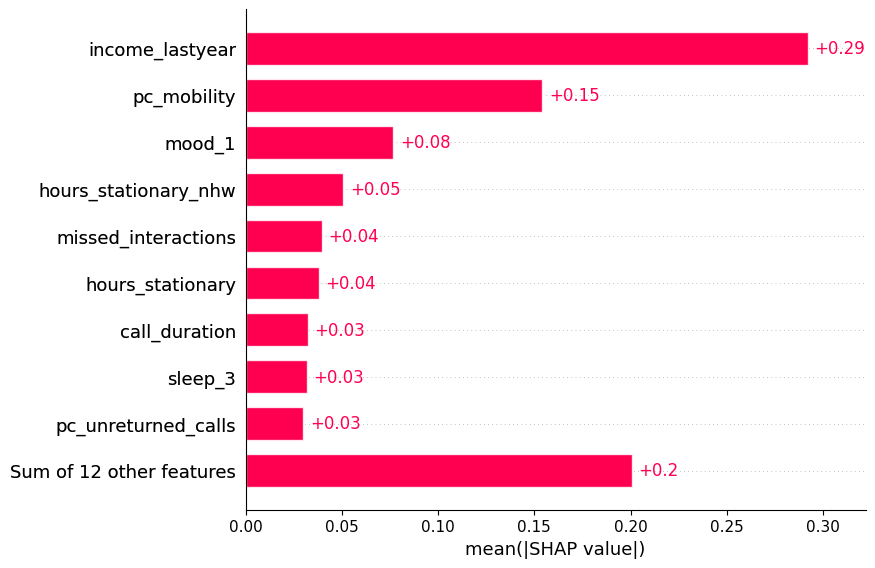

['hours_walking', 'distance_high_speed_transportation_hr', 'distance_active', 'distance_powered_vehicle_hr', 'distance_active_hr', 'hours_accounted_for', 'location_variance_hr', 'distance_walking', 'hours_high_speed_transportation_hr', 'hours_high_speed_transportation', 'came_to_work', 'distance_powered_vehicle', 'location_variance', 'hours_active_hr', 'hours_powered_vehicle_hr', 'distance_walking_hr', 'precip_sum', 'distance_high_speed_transportation', 'hours_powered_vehicle', 'hours_active', 'hours_of_sleep_hr', 'humidity_median', 'dew_point_median', 'cloud_cover_mean', 'hours_of_sleep', 'cloud_cover_median', 'humidity_IQR', 'humidity_std', 'dew_point_IQR', 'cloud_cover_std', 'cloud_cover_IQR', 'dew_point_std', 'temp_mean', 'humidity_mean', 'temp_IQR', 'dew_point_mean', 'temp_median', 'temp_std', 'education', 'income_satisfaction', 'hours_of_sleep_hr.1', 'gender_0.0', 'gender_1.0', 'marital_status_0.0', 'marital_status_1.0', 'marital_status_2.0', 'hours_of_sleep_hr.2', 'hours_of_slee

/var/folders/hw/bbf5fg0s5md12mjn50bptvhh0000gq/T/ipykernel_3713/400976083.py:36: ConstantInputWarning:

An input array is constant; the correlation coefficient is not defined.



/var/folders/hw/bbf5fg0s5md12mjn50bptvhh0000gq/T/ipykernel_3713/400976083.py:36: ConstantInputWarning:

An input array is constant; the correlation coefficient is not defined.



v1_day <class 'type'> HistGradientBoostingRegressor Mean R2: 0.083


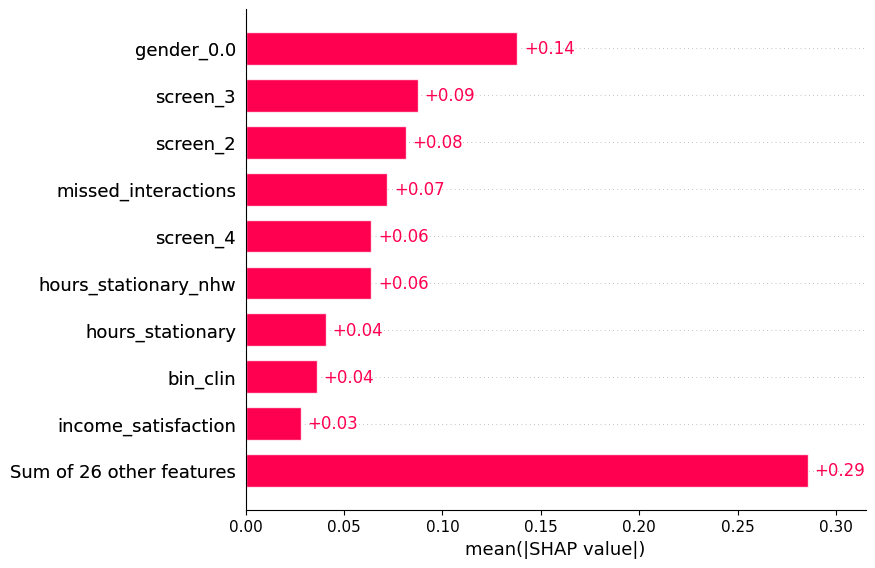

['hours_walking', 'distance_high_speed_transportation_hr', 'distance_active', 'distance_powered_vehicle_hr', 'distance_active_hr', 'hours_accounted_for', 'location_variance_hr', 'distance_walking', 'hours_high_speed_transportation_hr', 'hours_high_speed_transportation', 'came_to_work', 'distance_powered_vehicle', 'location_variance', 'hours_active_hr', 'hours_powered_vehicle_hr', 'distance_walking_hr', 'precip_sum', 'distance_high_speed_transportation', 'hours_powered_vehicle', 'hours_active', 'hours_of_sleep_hr', 'humidity_median', 'dew_point_median', 'cloud_cover_mean', 'hours_of_sleep', 'cloud_cover_median', 'humidity_IQR', 'humidity_std', 'dew_point_IQR', 'cloud_cover_std', 'cloud_cover_IQR', 'dew_point_std', 'temp_mean', 'humidity_mean', 'temp_IQR', 'dew_point_mean', 'temp_median', 'temp_std', 'education', 'income_satisfaction', 'hours_of_sleep_hr.1', 'gender_0.0', 'gender_1.0', 'marital_status_0.0', 'marital_status_1.0', 'marital_status_2.0', 'hours_of_sleep_hr.2', 'hours_of_slee

/var/folders/hw/bbf5fg0s5md12mjn50bptvhh0000gq/T/ipykernel_3713/400976083.py:36: ConstantInputWarning:

An input array is constant; the correlation coefficient is not defined.



/var/folders/hw/bbf5fg0s5md12mjn50bptvhh0000gq/T/ipykernel_3713/400976083.py:36: ConstantInputWarning:

An input array is constant; the correlation coefficient is not defined.



v2_day <class 'type'> HistGradientBoostingRegressor Mean R2: -0.073


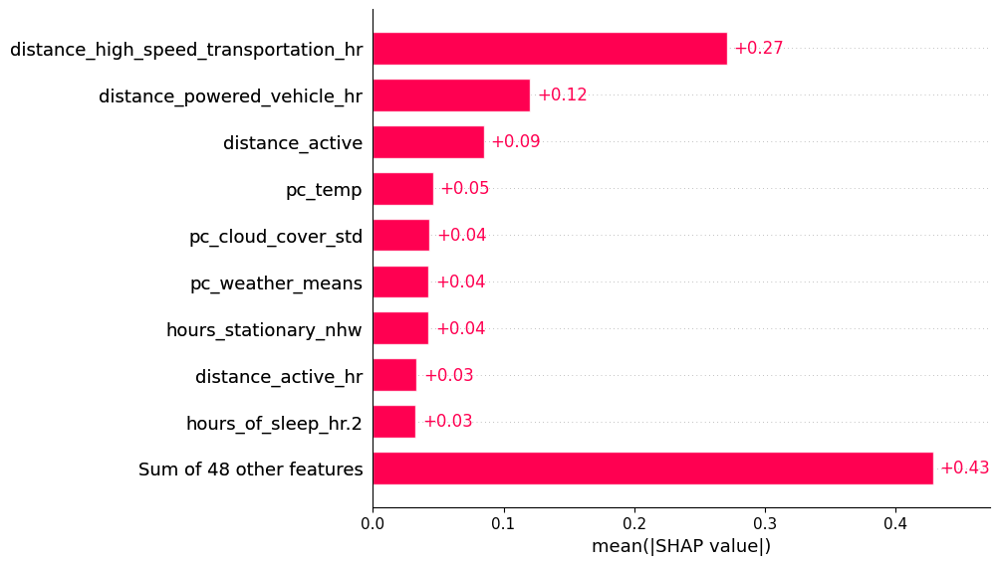

['hours_walking', 'distance_high_speed_transportation_hr', 'distance_active', 'distance_powered_vehicle_hr', 'distance_active_hr', 'hours_accounted_for', 'location_variance_hr', 'distance_walking', 'hours_high_speed_transportation_hr', 'hours_high_speed_transportation', 'came_to_work', 'distance_powered_vehicle', 'location_variance', 'hours_active_hr', 'hours_powered_vehicle_hr', 'distance_walking_hr', 'precip_sum', 'distance_high_speed_transportation', 'hours_powered_vehicle', 'hours_active', 'hours_of_sleep_hr', 'humidity_median', 'dew_point_median', 'cloud_cover_mean', 'hours_of_sleep', 'cloud_cover_median', 'humidity_IQR', 'humidity_std', 'dew_point_IQR', 'cloud_cover_std', 'cloud_cover_IQR', 'dew_point_std', 'temp_mean', 'humidity_mean', 'temp_IQR', 'dew_point_mean', 'temp_median', 'temp_std', 'education', 'income_satisfaction', 'hours_of_sleep_hr.1', 'gender_0.0', 'gender_1.0', 'marital_status_0.0', 'marital_status_1.0', 'marital_status_2.0', 'hours_of_sleep_hr.2', 'hours_of_slee

/var/folders/hw/bbf5fg0s5md12mjn50bptvhh0000gq/T/ipykernel_3713/400976083.py:36: NearConstantInputWarning:

An input array is nearly constant; the computed correlation coefficient may be inaccurate.



v2_day <class 'type'> HistGradientBoostingRegressor Mean R2: -0.017


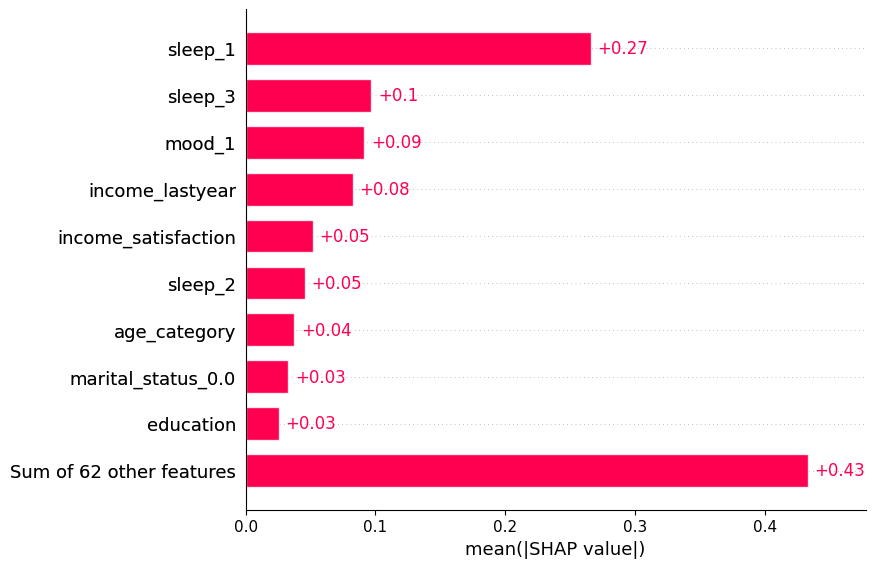

['hours_walking', 'distance_high_speed_transportation_hr', 'distance_active', 'distance_powered_vehicle_hr', 'distance_active_hr', 'hours_accounted_for', 'location_variance_hr', 'distance_walking', 'hours_high_speed_transportation_hr', 'hours_high_speed_transportation', 'came_to_work', 'distance_powered_vehicle', 'location_variance', 'hours_active_hr', 'hours_powered_vehicle_hr', 'distance_walking_hr', 'precip_sum', 'distance_high_speed_transportation', 'hours_powered_vehicle', 'hours_active', 'hours_of_sleep_hr', 'humidity_median', 'dew_point_median', 'cloud_cover_mean', 'hours_of_sleep', 'cloud_cover_median', 'humidity_IQR', 'humidity_std', 'dew_point_IQR', 'cloud_cover_std', 'cloud_cover_IQR', 'dew_point_std', 'temp_mean', 'humidity_mean', 'temp_IQR', 'dew_point_mean', 'temp_median', 'temp_std', 'education', 'income_satisfaction', 'hours_of_sleep_hr.1', 'gender_0.0', 'gender_1.0', 'marital_status_0.0', 'marital_status_1.0', 'marital_status_2.0', 'hours_of_sleep_hr.2', 'hours_of_slee

/var/folders/hw/bbf5fg0s5md12mjn50bptvhh0000gq/T/ipykernel_3713/400976083.py:36: NearConstantInputWarning:

An input array is nearly constant; the computed correlation coefficient may be inaccurate.



In [26]:

import gc 

subject_scores = []

for name in ['v1_day','v2_day']: #4
	for y_col in ['phq2_sum']: #2
		for time in ['8wks','both']: #3
			for model_name in models: #only one atm 
				mean_r2 = round(np.mean(model_dict[name][y_col][time][model_name]['r2_scores']), 3)
				print(name, type, model_name, f'Mean R2: {mean_r2}')
				i=0 #change based on which CV you want to see
				model = model_dict[name][y_col][time][model_name]['model'][i]
				explainer = shap.Explainer(model_dict[name][y_col][time][model_name]['model'][i], approximate=True)
				shap_values = explainer(model_dict[name][y_col][time][model_name]['X_test_for_model'][i], check_additivity=False)
				shap.plots.bar(shap_values)
				del explainer, shap_values
				gc.collect()  

				X_test = model_dict[name][y_col][time][model_name]['X_test'][i] # use X_test for the plotting bc it has the day/week variable
				y_pred = model_dict[name][y_col][time][model_name]['y_pred'][i]
				y_test = model_dict[name][y_col][time][model_name]['y_test'][i]

				y_df = pd.DataFrame({f'{y_col}_pred': y_pred, f'{y_col}_actual': y_test})
				df = pd.concat([X_test, y_df], axis=1)

				print(list(model.feature_names_in_), '\n')

				
				for sub, sub_df in df.groupby('num_id'):
					if len(sub_df.dropna(subset=f'{y_col}_pred'))<3:
						continue

					sub_df = sub_df.sort_values(by='day')

					r2_score_sub = r2_score(list(sub_df[f'{y_col}_actual']), list(sub_df[f'{y_col}_pred']))
					pmc_score_sub = pearsonr(list(sub_df[f'{y_col}_actual']), list(sub_df[f'{y_col}_pred']))

					fig = px.line(sub_df, x='day', y=[f'{y_col}_pred', f'{y_col}_actual'], 
					title=f'Sub {sub}, {X_test.shape[1]} {time} feats, pred. vs. actual {y_col} score | R2:{round(r2_score_sub, 2)}, PMC:{round(pmc_score_sub[0], 2)}')					
					fig.show()

					subject_scores.append([name, y_col, time, model_name, sub, r2_score_sub, pmc_score_sub[0]])

subject_scores_df = pd.DataFrame(subject_scores, columns=['name', 'y_col', 'time', 'model_name', 'sub', 'r2_score_sub', 'pmc_score_sub'])
subject_scores_df.to_csv(os.path.join(results_dir, 'subject_phq2_preds_from_diff_models.csv'))

# Subject Scores for PHQ2 prediction

In [ ]:

subject_scores_df = pd.read_csv(os.path.join(results_dir, 'subject_phq2_preds_from_diff_models.csv'))
time_map = {'8wks': 'Passive Variables over 8 weeks', 'both': 'Passive Variables over 8 weeks + Baseline clinical and demographic features'}
for time in time_map.keys():
	for metric in ['r2_score_sub','pmc_score_sub']:
		subject_scores_df=subject_scores_df.mask(subject_scores_df[metric]<-1)
		# assuming your DataFrame is called df
		fig = px.bar(
			subject_scores_df[subject_scores_df['time']==time],
			x='sub',
			y=metric,
			title=f'{metric} Score per Subject',
			labels={'sub': 'Subject ID'},
			color='name'
		)

		# Optional: improve layout and readability
		fig.update_layout(
			xaxis={'type': 'category'},  # keeps x-axis discrete even if numeric
			xaxis_tickangle=-45,
			plot_bgcolor='white',
			yaxis=dict(zeroline=True, zerolinewidth=1, zerolinecolor='black'),
		)
		
		fig.show()

['gad7_1', 'gad7_2', 'gad7_3', 'gad7_4', 'gad7_5', 'gad7_6', 'gad7_7', 'gad7_8', 'gad7_sum', 'gad_cat', 'phq9_1_base', 'phq9_2_base', 'phq9_3_base', 'phq9_4_base', 'phq9_5_base', 'phq9_6_base', 'phq9_7_base', 'phq9_8_base', 'phq9_9_base', 'phq9_sum_base', 'cid', 'bin_clin', 'bipolar', 'scz', 'screen_1', 'screen_2', 'screen_3', 'screen_4', 'gender', 'education', 'working', 'income_satisfaction', 'incomelastyear', 'marital_status', 'race', 'age', 'heard_about_us', 'device', 'startdate', 'study_arm', 'study', 'alc_1', 'alc_2', 'alc_3', 'alc_sum', 'alc_cat', 'mhs_1', 'mhs_2', 'mhs_3', 'mhs_4', 'mhs_5']


# Modelling using slope, int and mean features with ONLY first 4 weeks
## across all subjects


In [29]:

from sklearn.ensemble import HistGradientBoostingRegressor
import numpy as np
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.model_selection import GroupKFold
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
from sklearn.feature_selection import f_classif, SelectKBest
fs = SelectKBest(score_func=f_classif, k=25)

print('Using smartphone sensor data + surveys, over 8 weeks')

y_cols =['phq9_sum_6wks', '6wks_depressed_binary', 'depression_change_bin']
models = {
	'HistGradientBoostingRegressor': [HistGradientBoostingRegressor(), HistGradientBoostingClassifier()]
}

model_dict_slopeint = {}
count=0
for name in ['v1_day', 'v2_day']: 
	Xy = pd.read_csv(os.path.join(brighten_dir, f"{name}_wide_slopeintercept_2wk_outcomes.csv"))
	model_dict_slopeint[name] = {}
	

	print(f'####### {name} #######')
	for y_col in y_cols:
		Xy = Xy.dropna(subset=[y_col])

		model_dict_slopeint[name][y_col] = {}
		for time in ['8wks','both','baseline']:
			print(f'\n\nPREDICTING: {y_col} from {time}')
			if 'baseline' in time:
				usable_cols = baseline_cols
			if '8wks' in time:
				usable_cols = daily_cols_v1+daily_cols_v2+weekly_cols
			elif 'both' in time:
				usable_cols = baseline_cols+daily_cols_v1+daily_cols_v2+weekly_cols

			model_dict_slopeint[name][y_col][time]={}
			
			y=Xy[y_col]
			# columns to drop
			X=Xy[[col for col in Xy.columns if any(item in col for item in usable_cols) and 'phq' not in col]].copy()
			X=X.drop(columns=[col for col in X.columns if 'block3' in col or 'block4' in col or 'block5' in col or 'block6' in col]).copy()	
	
			print(f'X has {X.shape[0]} observations, {X.shape[1]} features')
			
			#display(X)
			non_numeric_cols = X.select_dtypes(include=['object']).columns
			if len(non_numeric_cols) > 0:
				print("Non-numeric columns found:", non_numeric_cols)
				print(X[non_numeric_cols].head())
			
			# Inputs
			groups = Xy['num_id']
			gkf = GroupKFold(n_splits=5)


			for model_name in models:
				model_dict_slopeint[name][y_col][time][model_name] = {}
				model_dict_slopeint[name][y_col][time][model_name]['model']=[]
				model_dict_slopeint[name][y_col][time][model_name]['X_test']=[]
				model_dict_slopeint[name][y_col][time][model_name]['r2_scores']=[]
				model_dict_slopeint[name][y_col][time][model_name]['mae_scores']=[]
				for train_idx, test_idx in gkf.split(X, y, groups):
					X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
					y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

					if X_train.shape[0]==0 or X_train.shape[1]==0 or len(X_train)==0:
						model_dict_slopeint[name][y_col][time][model_name]['model'].append(np.nan)
						model_dict_slopeint[name][y_col][time][model_name]['X_test'].append(np.nan)
						model_dict_slopeint[name][y_col][time][model_name]['r2_scores'].append(np.nan)
						model_dict_slopeint[name][y_col][time][model_name]['mae_scores'].append(np.nan)
						continue

					model = models[model_name][0]
					if y_col in ['start_depressed_binary','6wks_depressed_binary','depression_change_bin','bin_clin']:
						model= models[model_name][1]

					model.fit(X_train, y_train)
					model_dict_slopeint[name][y_col][time][model_name]['model'].append(model)

					y_pred = np.round(model.predict(X_test)).astype(int) #ordinal Y
					model_dict_slopeint[name][y_col][time][model_name]['X_test'].append(X_test)

					r2 = r2_score(y_test, y_pred)
					model_dict_slopeint[name][y_col][time][model_name]['r2_scores'].append(r2)

					mae = mean_absolute_error(y_test, y_pred)
					model_dict_slopeint[name][y_col][time][model_name]['mae_scores'].append(mae)
					

				print(f"TIME {time} -- mean R²: {round(np.mean(model_dict_slopeint[name][y_col][time][model_name]['r2_scores']), 4)}, mean MAE: {round(np.mean(model_dict_slopeint[name][y_col][time][model_name]['mae_scores']), 4)} of {round(y.min(), 1)}-{round(y.max(), 1)}\n")




Using smartphone sensor data + surveys, over 8 weeks
####### v1_day #######


PREDICTING: phq9_sum_6wks from 8wks
X has 304 observations, 160 features
TIME 8wks -- mean R²: 0.2388, mean MAE: 3.563 of 0.0-25.0



PREDICTING: phq9_sum_6wks from both
X has 304 observations, 172 features
TIME both -- mean R²: 0.2405, mean MAE: 3.6148 of 0.0-25.0



PREDICTING: phq9_sum_6wks from baseline
X has 304 observations, 12 features
TIME baseline -- mean R²: -0.3487, mean MAE: 4.8913 of 0.0-25.0



PREDICTING: 6wks_depressed_binary from 8wks
X has 304 observations, 160 features
TIME 8wks -- mean R²: -0.4238, mean MAE: 0.2894 of 0.0-1.0



PREDICTING: 6wks_depressed_binary from both
X has 304 observations, 172 features
TIME both -- mean R²: -0.4251, mean MAE: 0.2896 of 0.0-1.0



PREDICTING: 6wks_depressed_binary from baseline
X has 304 observations, 12 features
TIME baseline -- mean R²: -0.7348, mean MAE: 0.3483 of 0.0-1.0



PREDICTING: depression_change_bin from 8wks
X has 304 observations, 160 fe

# Now show the feature importance for the above


name v1_day y_col phq9_sum_6wks time 8wks model_name HistGradientBoostingRegressor mean r2 0.2388


,columns,shap_values
8,unreturned_calls_block1_slope,1.872804
1,mobility_block1_intercept,1.482703
10,unreturned_calls_block1_mean,0.964157
0,mobility_block1_slope,0.753991
9,unreturned_calls_block1_intercept,0.554922
6,mobility_radius_block1_mean,0.524852
3,mobility_block1_std,0.451539
11,unreturned_calls_block1_std,0.364424
7,mobility_radius_block1_std,0.237517
5,mobility_radius_block1_intercept,0.041578


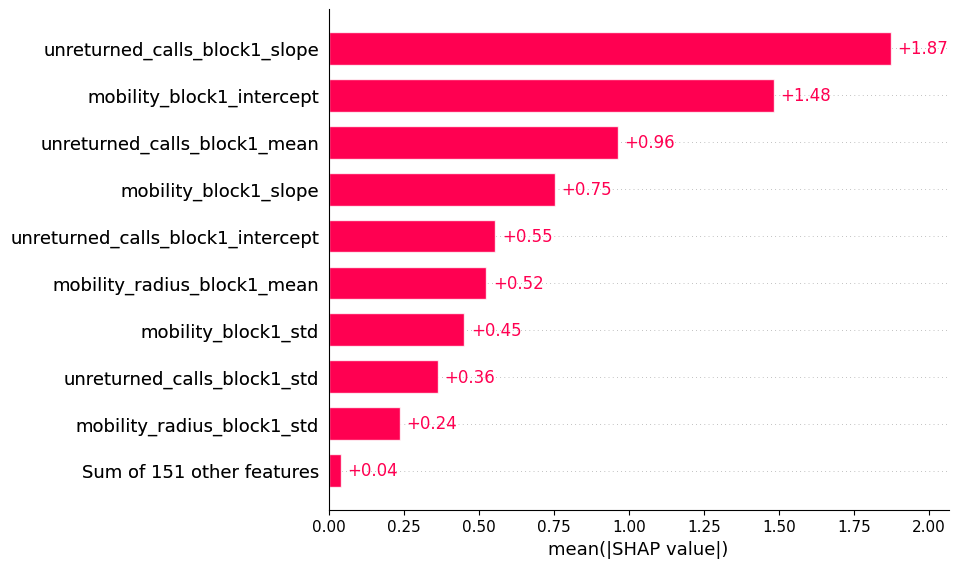

name v1_day y_col phq9_sum_6wks time both model_name HistGradientBoostingRegressor mean r2 0.2405


,columns,shap_values
8,unreturned_calls_block1_slope,1.872804
1,mobility_block1_intercept,1.482703
10,unreturned_calls_block1_mean,0.964157
0,mobility_block1_slope,0.753991
9,unreturned_calls_block1_intercept,0.554922
6,mobility_radius_block1_mean,0.524852
3,mobility_block1_std,0.451539
11,unreturned_calls_block1_std,0.364424
7,mobility_radius_block1_std,0.237517
5,mobility_radius_block1_intercept,0.041578


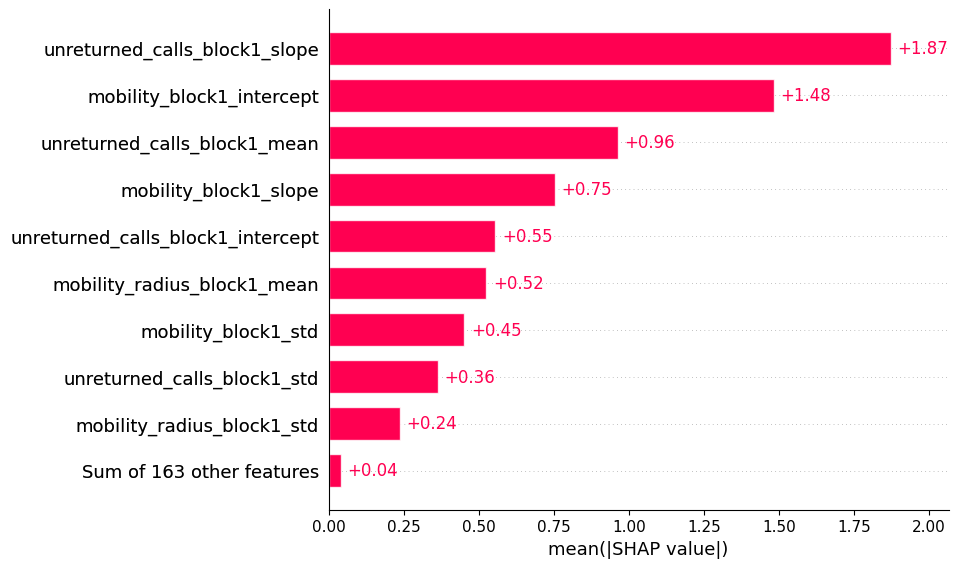

name v1_day y_col phq9_sum_6wks time baseline model_name HistGradientBoostingRegressor mean r2 -0.3487


,columns,shap_values
1,screen_2,1.931467
9,marital_status,0.860355
6,education,0.851304
0,screen_1,0.848174
8,income_satisfaction,0.822053
10,race,0.616430
11,age_category,0.575341
3,screen_4,0.450992
7,working,0.133576
5,gender,0.073922


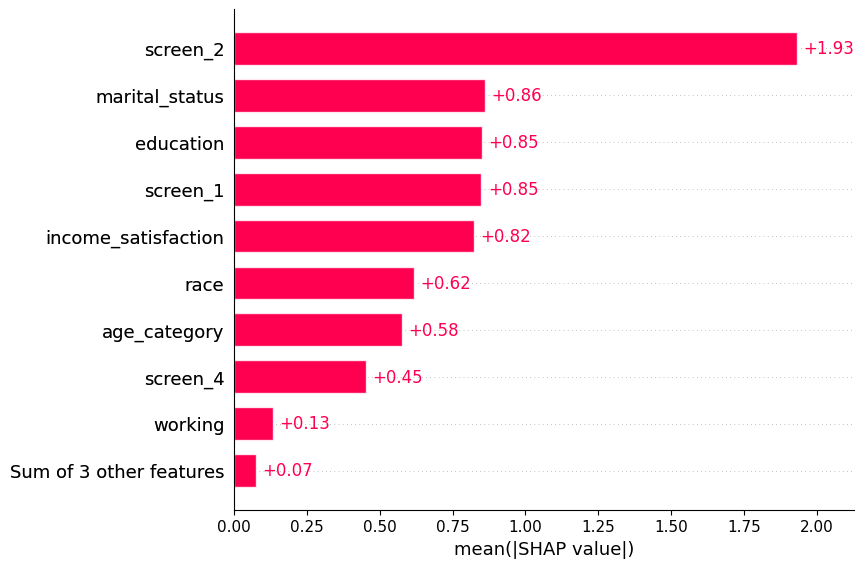

name v1_day y_col 6wks_depressed_binary time 8wks model_name HistGradientBoostingRegressor mean r2 -0.4238
name v1_day y_col 6wks_depressed_binary time both model_name HistGradientBoostingRegressor mean r2 -0.4251
name v1_day y_col 6wks_depressed_binary time baseline model_name HistGradientBoostingRegressor mean r2 -0.7348
name v1_day y_col depression_change_bin time 8wks model_name HistGradientBoostingRegressor mean r2 -0.2412
name v1_day y_col depression_change_bin time both model_name HistGradientBoostingRegressor mean r2 -0.2452
name v1_day y_col depression_change_bin time baseline model_name HistGradientBoostingRegressor mean r2 -0.5929
name v2_day y_col phq9_sum_6wks time 8wks model_name HistGradientBoostingRegressor mean r2 -0.0195


,columns,shap_values
1,distance_high_speed_transportation_hr_block1_i...,2.179622
8,distance_active_hr_block1_slope,1.979741
10,distance_active_hr_block1_mean,0.998923
0,distance_high_speed_transportation_hr_block1_s...,0.809032
3,distance_high_speed_transportation_hr_block1_std,0.580552
11,distance_active_hr_block1_std,0.551900
6,distance_powered_vehicle_hr_block1_mean,0.528503
9,distance_active_hr_block1_intercept,0.494170
7,distance_powered_vehicle_hr_block1_std,0.209391
5,distance_powered_vehicle_hr_block1_intercept,0.036415


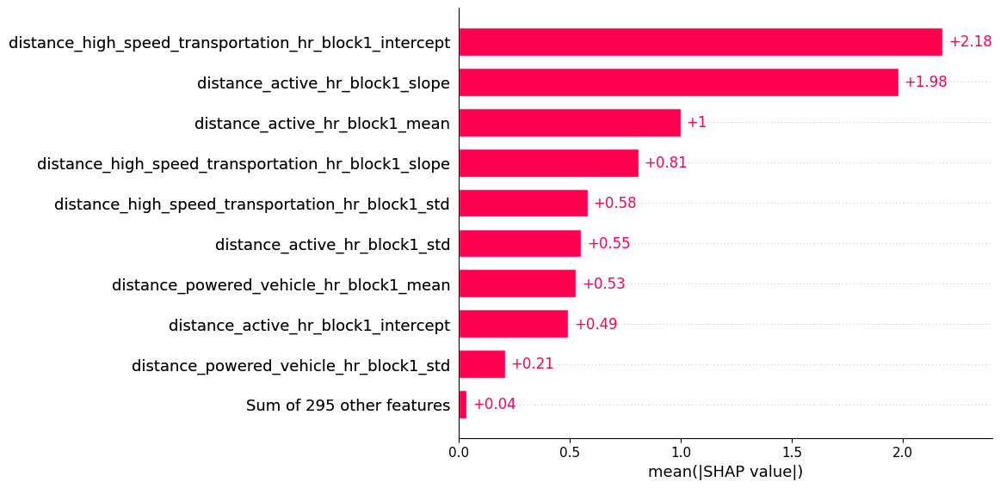

name v2_day y_col phq9_sum_6wks time both model_name HistGradientBoostingRegressor mean r2 -0.0131


,columns,shap_values
1,distance_high_speed_transportation_hr_block1_i...,2.179622
8,distance_active_hr_block1_slope,1.979741
10,distance_active_hr_block1_mean,0.998923
0,distance_high_speed_transportation_hr_block1_s...,0.809032
3,distance_high_speed_transportation_hr_block1_std,0.580552
11,distance_active_hr_block1_std,0.551900
6,distance_powered_vehicle_hr_block1_mean,0.528503
9,distance_active_hr_block1_intercept,0.494170
7,distance_powered_vehicle_hr_block1_std,0.209391
5,distance_powered_vehicle_hr_block1_intercept,0.036415


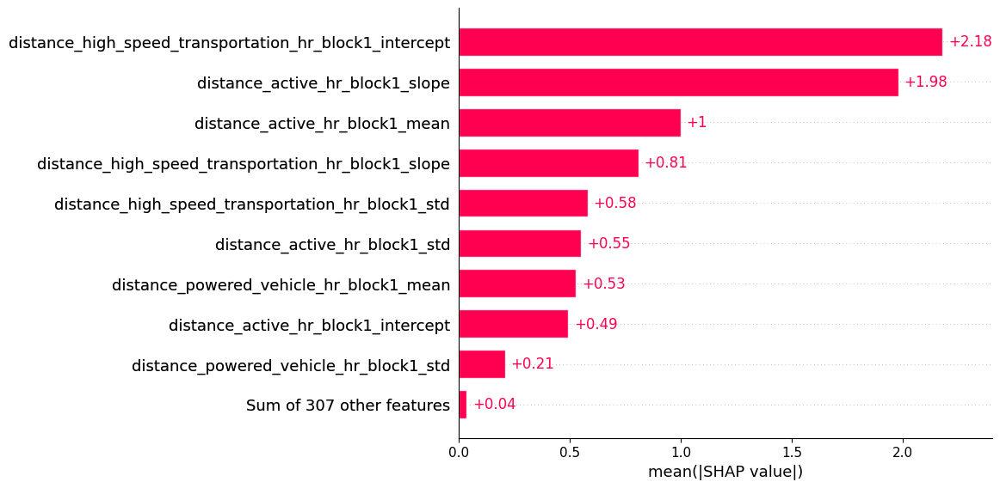

name v2_day y_col phq9_sum_6wks time baseline model_name HistGradientBoostingRegressor mean r2 -0.0719


,columns,shap_values
8,income_satisfaction,1.125366
9,marital_status,0.904603
6,education,0.860350
1,screen_2,0.824231
11,age_category,0.804324
10,race,0.703707
0,screen_1,0.444900
7,working,0.390781
3,screen_4,0.296115
5,gender,0.071423


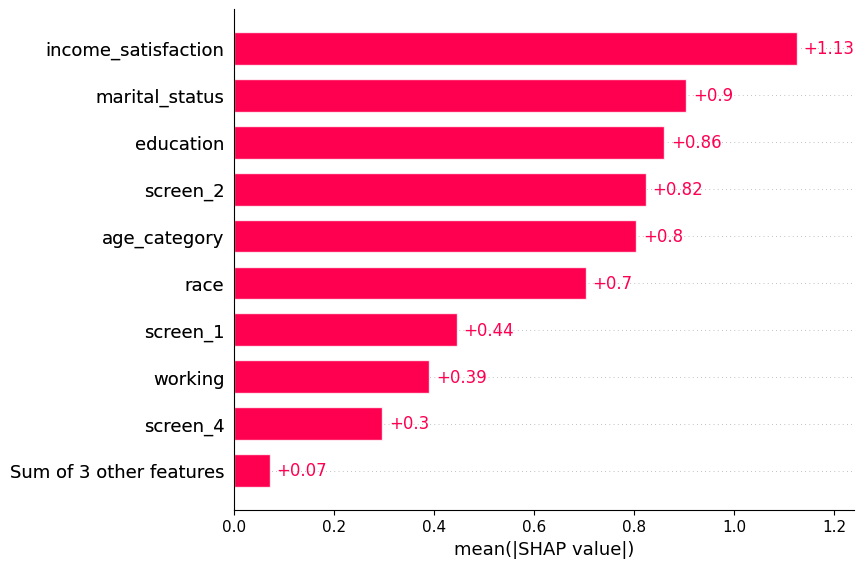

name v2_day y_col 6wks_depressed_binary time 8wks model_name HistGradientBoostingRegressor mean r2 -0.5863
name v2_day y_col 6wks_depressed_binary time both model_name HistGradientBoostingRegressor mean r2 -0.5847
name v2_day y_col 6wks_depressed_binary time baseline model_name HistGradientBoostingRegressor mean r2 -0.9073
name v2_day y_col depression_change_bin time 8wks model_name HistGradientBoostingRegressor mean r2 -0.4585
name v2_day y_col depression_change_bin time both model_name HistGradientBoostingRegressor mean r2 -0.434
name v2_day y_col depression_change_bin time baseline model_name HistGradientBoostingRegressor mean r2 -0.5622


In [35]:
i=0 #change based on which CV you want to see
count=0
top15features = {}
for name, y_dict in model_dict_slopeint.items():
	top15features[name] = {}
	for y_col, type_dict in y_dict.items():
		top15features[name][y_col] = {}
		for time, model_dict in type_dict.items():
			top15features[name][y_col][time]={}
			for model_name, metrics in model_dict.items():
				# mean_r2 = round(np.mean(model_dict_slopeint[name][y_col][time][model_name]['r2_scores']), 3)
				print('name',name, 'y_col',y_col, 'time',time, 'model_name',model_name, 'mean r2', round(np.mean(model_dict_slopeint[name][y_col][time][model_name]['r2_scores']), 4))
		
				model = model_dict_slopeint[name][y_col][time][model_name]['model'][i]
				X_test = model_dict_slopeint[name][y_col][time][model_name]['X_test'][i]
				
				if name == 'v1_day' and y_col == 'start_depressed_binary' and time == '8wks':
					if count<1:
						print(X_test.columns.to_list())
						count=1

				if model is None or X_test is None or len(X_test) == 0:
					continue

				# === Choose the right SHAP explainer dynamically ===
				if y_col in ['start_depressed_binary','6wks_depressed_binary','depression_change_bin']:
					continue
					# fallback to model-agnostic Explainer for Classifier
					explainer = shap.Explainer(model.predict_proba, X_test, feature_names=X_test.columns)
					shap_values = explainer(X_test)

					# SHAP gives one explanation per class → pick positive class (index 1)
					shap_values = shap_values[:, :, 1]
				else:
					# normal tree explainer for Regressor
					explainer = shap.TreeExplainer(model, approximate=True)
					shap_values = explainer(X_test, check_additivity=False)

				# === Plot mean absolute SHAP values per feature ===
				shap_df = pd.DataFrame({
					'columns': X_test.columns,
					'shap_values': np.abs(shap_values.values).mean(axis=0)
				})
				display(shap_df.sort_values('shap_values', ascending=False).head(10))
				top15features[name][y_col][time] = list(shap_df['columns'])[:20]


				shap.plots.bar(shap_values, max_display=10)

				del explainer, shap_values
				gc.collect()

				shap_df = shap_df.sort_values(by='shap_values', ascending=False) #sort from highest to lowest
				

# Using only the top 10 features from feature importance 
### Still slope/int and block1+2 to predict week 6

In [ ]:


model_dict_slopeint_top10 = {}
y_cols =['phq9_sum_6wks', '6wks_depressed_binary', 'depression_change_bin']

models = {
	'HistGradientBoostingRegressor': [HistGradientBoostingRegressor(), HistGradientBoostingClassifier()]
}

for name in ['v1_day','v2_day']: 
	df = pd.read_csv(os.path.join(brighten_dir, f"{name}_wide_slopeintercept_2wk_outcomes.csv"))
	model_dict_slopeint_top10[name] = {}
	

	print(f'####### {name} #######')
	for y_col in y_cols:
		model_dict_slopeint_top10[name][y_col]={}
		df_clean = df.dropna(subset=[y_col])
		model_dict_slopeint_top10[name][y_col] = {}
		for time in ['8wks','both','baseline']:
			model_dict_slopeint_top10[name][y_col][time]={}
			y=df_clean[y_col]
			X=df_clean[top15features[name][y_col][time]]
			non_numeric_cols = X.select_dtypes(include=['object']).columns
			if len(non_numeric_cols) > 0:
				print("Non-numeric columns found:", non_numeric_cols)
				print(X[non_numeric_cols].head())

				
			# Inputs
			groups = df_clean['num_id']
			gkf = GroupKFold(n_splits=5)

			for model_name in models:
				model_dict_slopeint_top10[name][y_col][time][model_name] = {}
				model_dict_slopeint_top10[name][y_col][time][model_name]['model']=[]
				model_dict_slopeint_top10[name][y_col][time][model_name]['X_test']=[]
				model_dict_slopeint_top10[name][y_col][time][model_name]['r2_scores']=[]
				model_dict_slopeint_top10[name][y_col][time][model_name]['mae_scores']=[]
				for train_idx, test_idx in gkf.split(X, y, groups):
					X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
					y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

					if X_train.shape[0]==0 or X_train.shape[1]==0 or len(X_train)==0:
						continue

					model = models[model_name][0]
					if 'bin' in y_col: #binary-- use classifier model instead of regressor model
						model= models[model_name][1]
					model.fit(X_train, y_train)
					model_dict_slopeint_top10[name][y_col][time][model_name]['model'].append(model)

					y_pred = np.round(model.predict(X_test)).astype(int) #ordinal Y
					model_dict_slopeint_top10[name][y_col][time][model_name]['X_test'].append(X_test)

					r2 = r2_score(y_test, y_pred)
					model_dict_slopeint_top10[name][y_col][time][model_name]['r2_scores'].append(r2)

					mae = mean_absolute_error(y_test, y_pred)
					model_dict_slopeint_top10[name][y_col][time][model_name]['mae_scores'].append(mae)
					

				print(f"TIME {time} -- Num features: {len(X_train.columns)}, train: {len(X_train)} obs, test: {len(X_test)} obs || mean R²: {round(np.mean(model_dict_slopeint_top10[name][y_col][time][model_name]['r2_scores']), 4)}, mean MAE: {round(np.mean(model_dict_slopeint_top10[name][y_col][time][model_name]['mae_scores']), 4)} of {round(y.min(), 1)}-{round(y.max(), 1)}\n")



